# Data Association


In [1]:
try:
  # %tensorflow_version only exists in Colab.
  %tensorflow_version 2.x
except Exception:
    pass

# Load the TensorBoard notebook extension
%load_ext tensorboard
logdir = './logs/'

# Directory where the checkpoints will be saved
checkpoint_dir = './training_checkpoints'

# matplotlib rendering
%matplotlib inline

import sys
sys.path.append("../") # go to parent dir -> for module loading

!pip -q install -r ../requirements.txt

TensorFlow 2.x selected.
ERROR: Could not open requirements file: [Errno 2] No such file or directory: '../requirements.txt'


In [2]:
!wget pollithy.com/Pfeffer.zip
!unzip -q Pfeffer.zip

--2019-12-10 14:35:01--  http://pollithy.com/Pfeffer.zip
Resolving pollithy.com (pollithy.com)... 87.118.94.85
Connecting to pollithy.com (pollithy.com)|87.118.94.85|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://pollithy.com/Pfeffer.zip [following]
--2019-12-10 14:35:02--  https://pollithy.com/Pfeffer.zip
Connecting to pollithy.com (pollithy.com)|87.118.94.85|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 11741795 (11M) [application/zip]
Saving to: ‘Pfeffer.zip’

Pfeffer.zip         100%[===================>]  11.20M  3.93MB/s    in 2.8s    

2019-12-10 14:35:06 (3.93 MB/s) - ‘Pfeffer.zip’ saved [11741795/11741795]



In [3]:
!wget -N pollithy.com/rnn_model_fake_data.h5

--2019-12-10 14:35:47--  http://pollithy.com/rnn_model_fake_data.h5
Resolving pollithy.com (pollithy.com)... 87.118.94.85
Connecting to pollithy.com (pollithy.com)|87.118.94.85|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://pollithy.com/rnn_model_fake_data.h5 [following]
--2019-12-10 14:35:48--  https://pollithy.com/rnn_model_fake_data.h5
Connecting to pollithy.com (pollithy.com)|87.118.94.85|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 34203912 (33M)
Saving to: ‘rnn_model_fake_data.h5’

rnn_model_fake_data 100%[===================>]  32.62M  9.40MB/s    in 5.1s    

2019-12-10 14:35:54 (6.41 MB/s) - ‘rnn_model_fake_data.h5’ saved [34203912/34203912]



In [98]:
import os
import random
import itertools
import shutil

import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd

from tensorboard.plugins.hparams import api as hp
from tensorflow.keras import backend as K
from datetime import datetime
from collections import defaultdict

# custom modules
import data
import model

print('Tensorflow version:', tf.__version__)

print('GPU support:', tf.test.is_gpu_available())
plt.rcParams['figure.figsize'] = [10, 5]

# Name of the checkpoint files
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt_{epoch}")

# set all keras layers to use float64
tf.keras.backend.set_floatx('float64')

Tensorflow version: 2.0.0
GPU support: True


In [0]:
from scipy.spatial import distance_matrix
from scipy.optimize import linear_sum_assignment

In [91]:
import importlib
importlib.reload(model)

<module 'model' from '/content/model.py'>

28


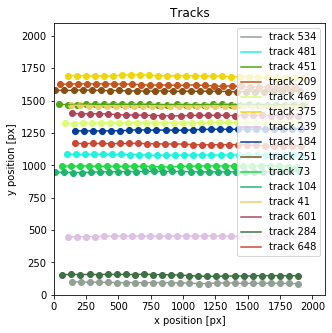

In [6]:
num_time_steps = 350
nan_value = 0
batch_size = 64
belt_width = 2000

dataset = data.FakeDataSet(timesteps=num_time_steps, batch_size=batch_size, number_trajectories=700, 
                           additive_noise_stddev=2, additive_target_stddev=20, belt_width=belt_width,
                          nan_value=nan_value)

# dataset_train, dataset_test = dataset.get_tf_data_sets_seq2seq_data(normalized=True)
dataset_train, dataset_test = dataset.get_tf_data_sets_seq2seq_data(normalized=True)

longest_track_time_steps = dataset.longest_track

dataset.plot_random_tracks(n=15)

In [12]:
# load model
rnn_model = tf.keras.models.load_model('rnn_model_fake_data.h5')

# summarize model.
rnn_model.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
masking_layer (Masking)      (64, 28, 2)               0         
_________________________________________________________________
rnn-0 (LSTM)                 (64, 28, 1024)            4206592   
_________________________________________________________________
rnn-1 (LSTM)                 (64, 28, 16)              66624     
_________________________________________________________________
dense_7 (Dense)              (64, 28, 2)               34        
Total params: 4,273,250
Trainable params: 4,273,250
Non-trainable params: 0
_________________________________________________________________


In [0]:
import seaborn as sn

Time step: 0


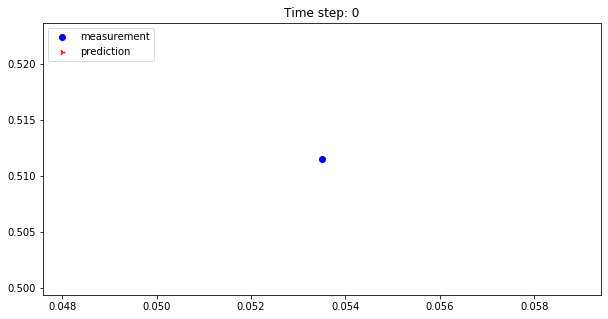

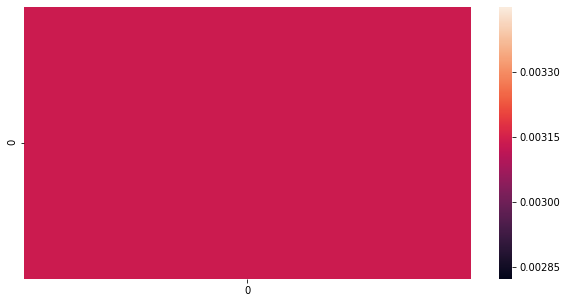

Time step: 1


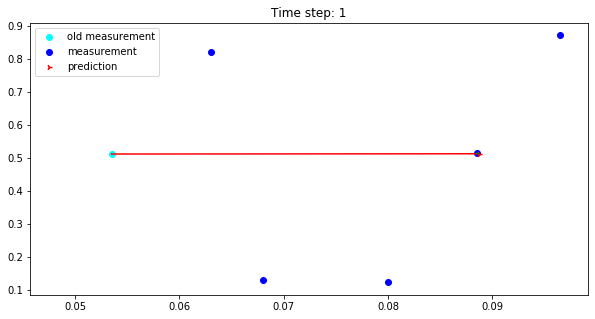

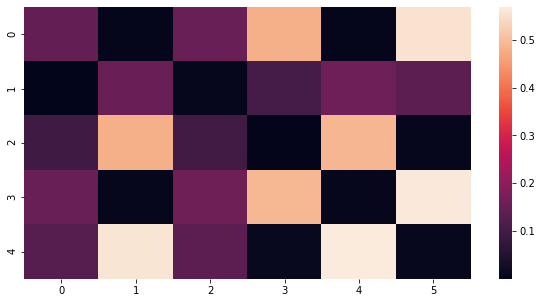

Time step: 2


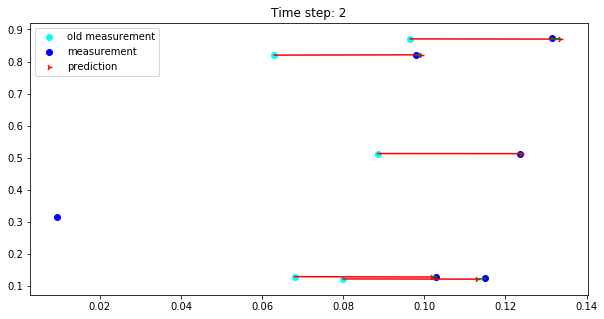

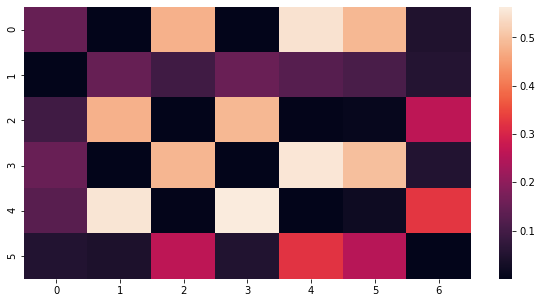

Time step: 3


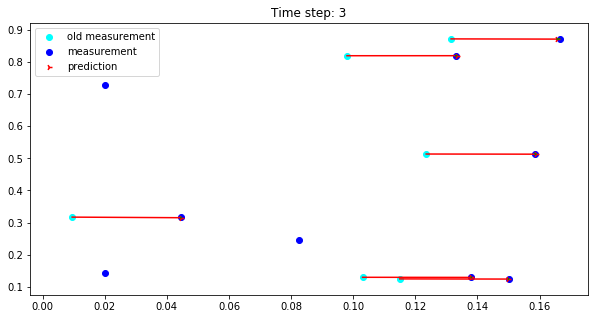

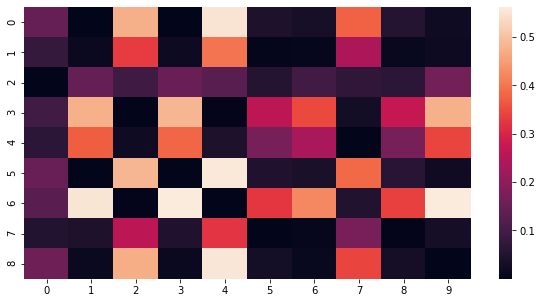

Time step: 4


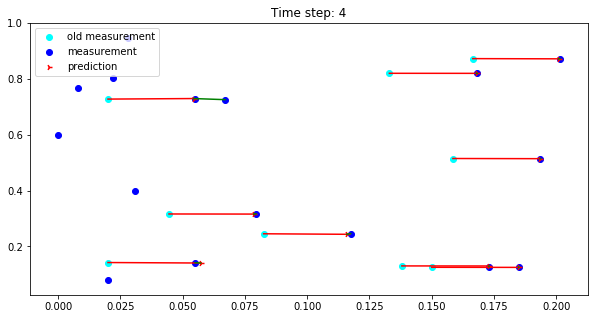

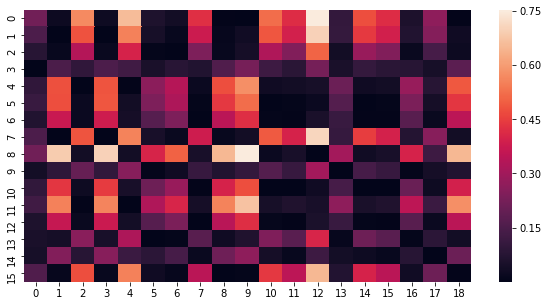

Time step: 5


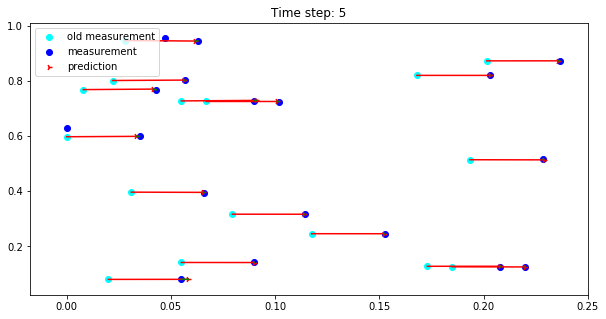

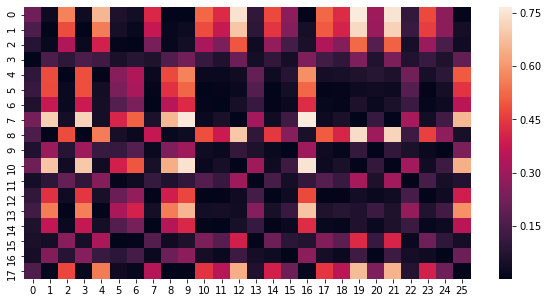

Time step: 6


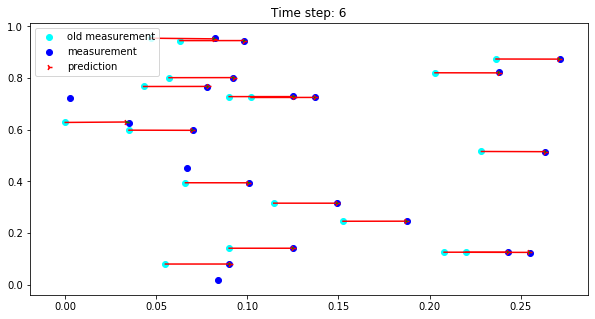

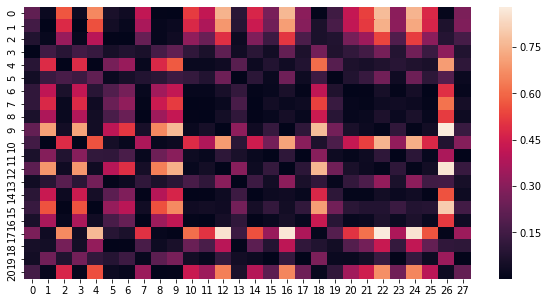

Time step: 7


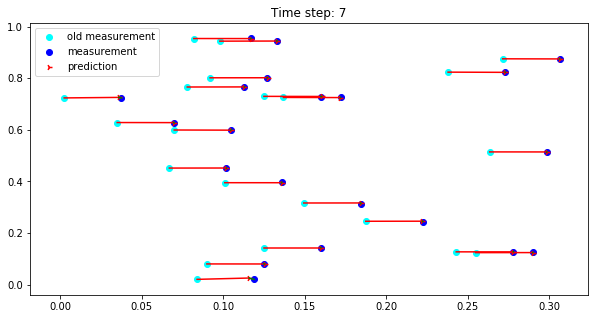

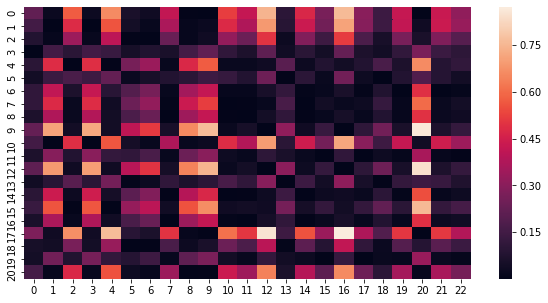

Time step: 8


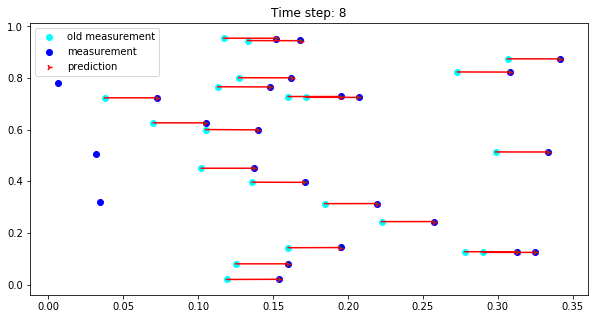

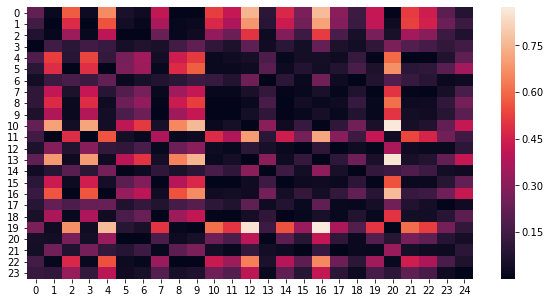

Time step: 9


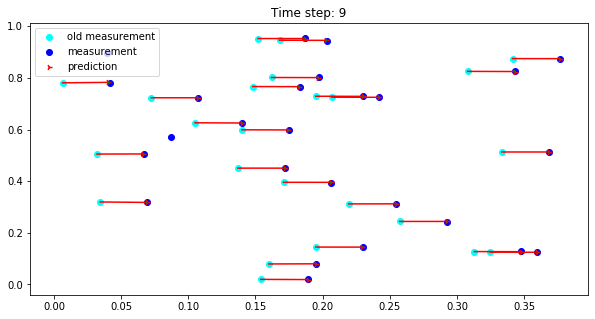

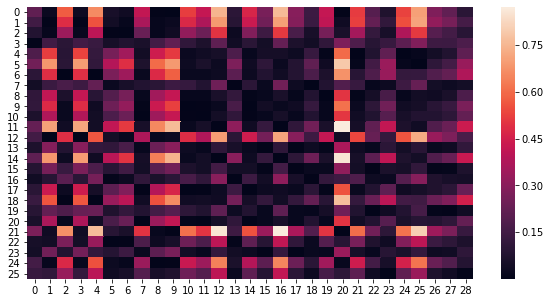

Time step: 10


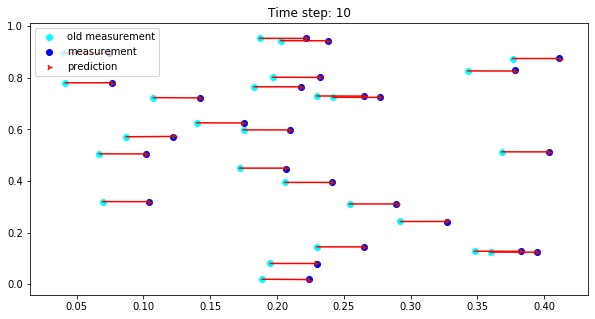

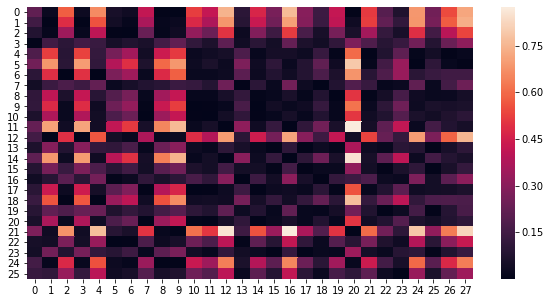

Time step: 11


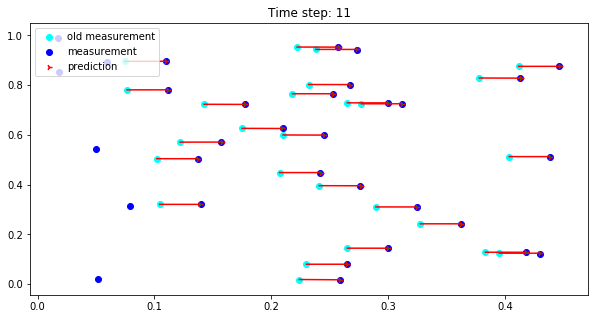

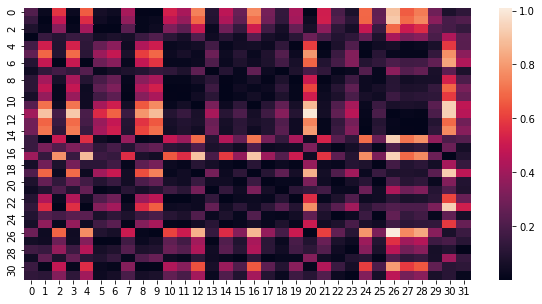

Time step: 12


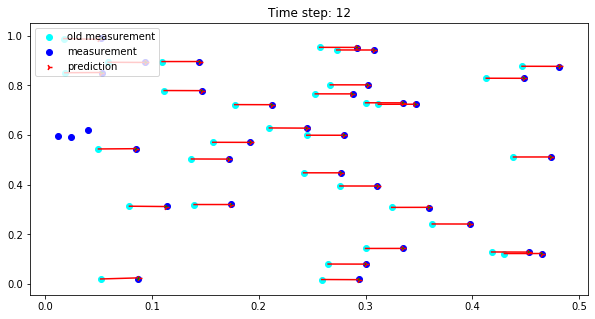

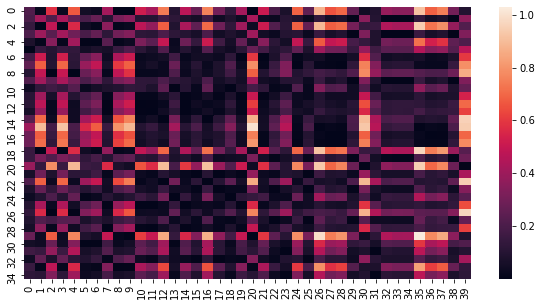

Time step: 13


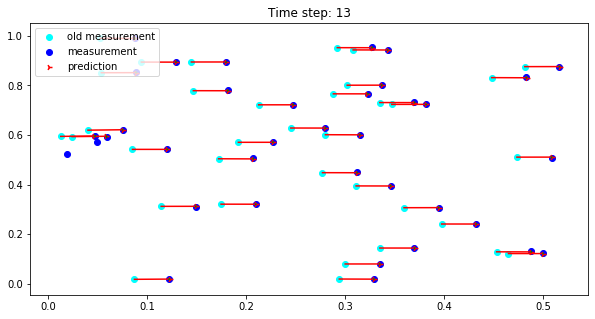

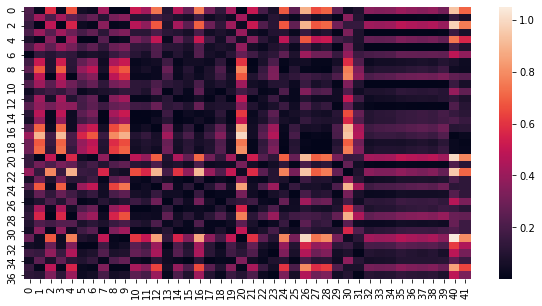

Time step: 14


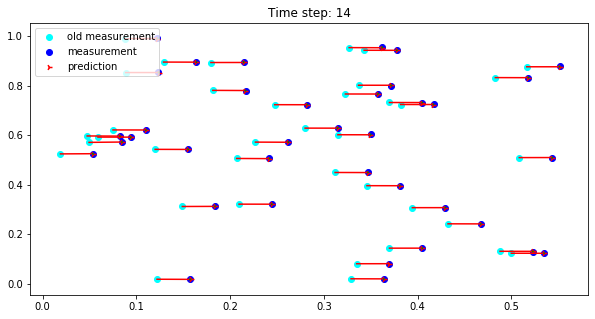

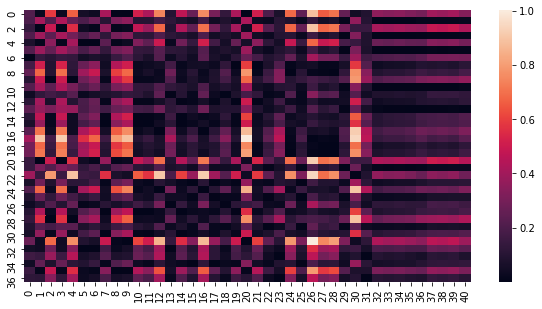

Time step: 15


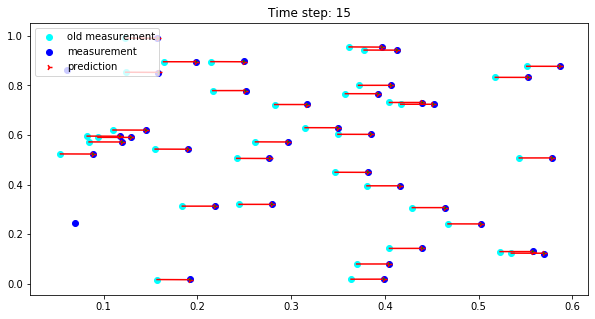

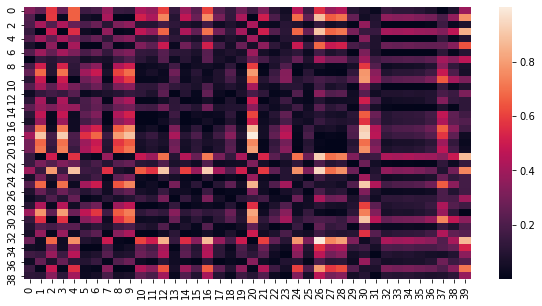

Time step: 16


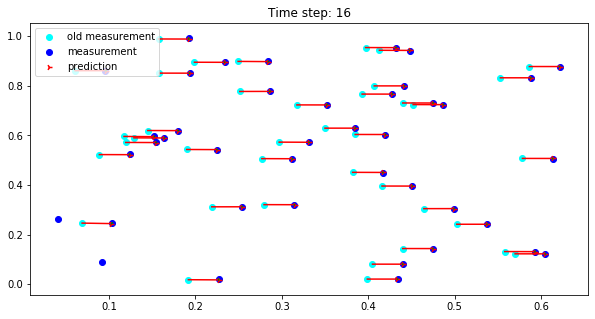

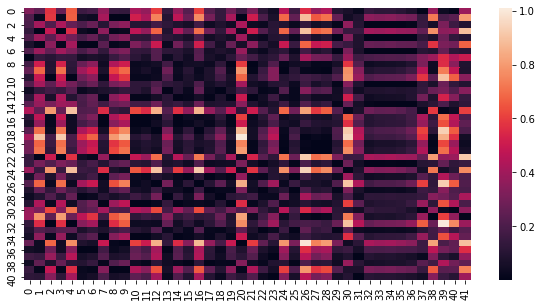

Time step: 17


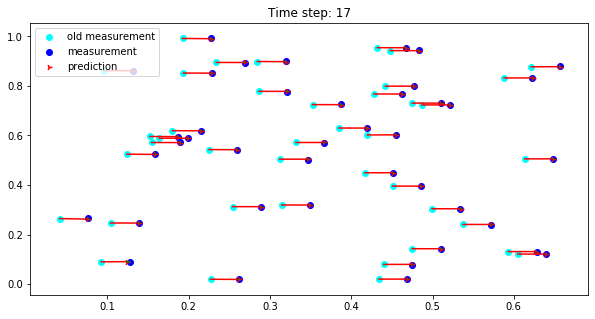

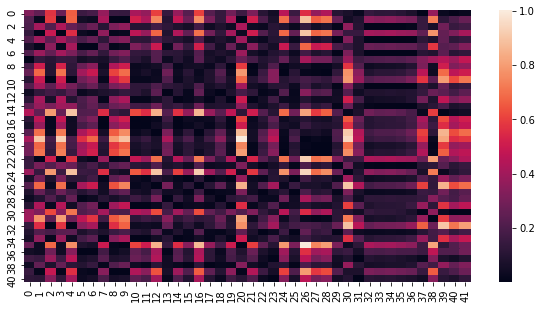

Time step: 18


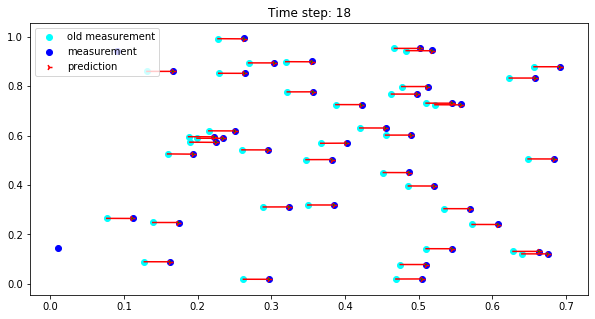

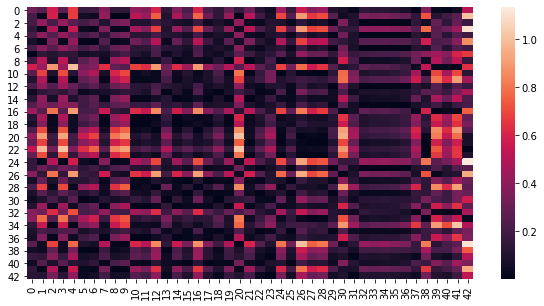

Time step: 19


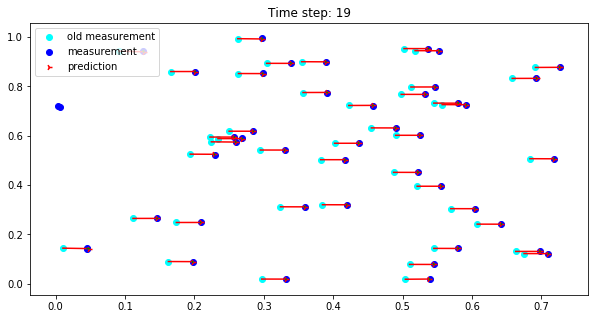

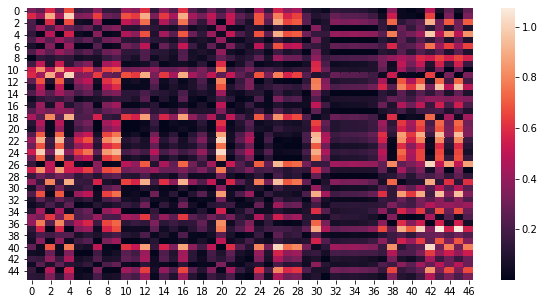

Time step: 20


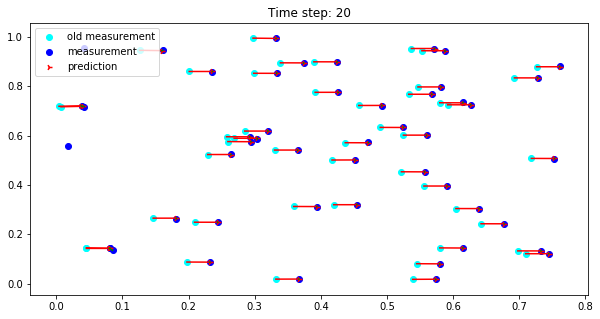

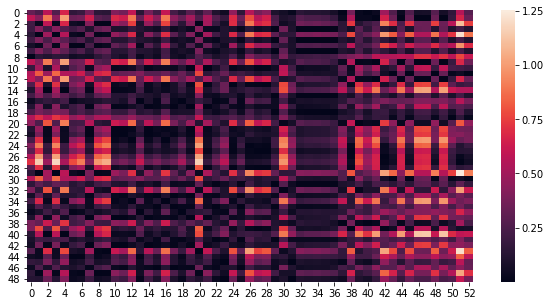

Time step: 21


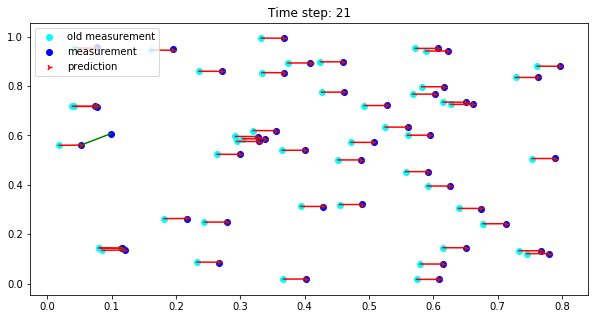

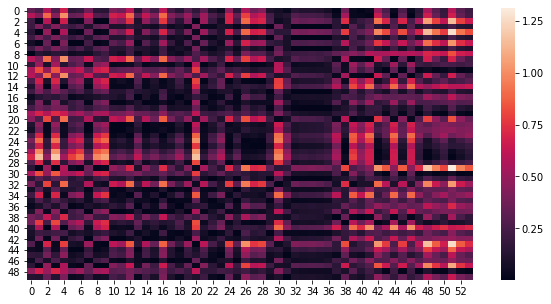

Time step: 22


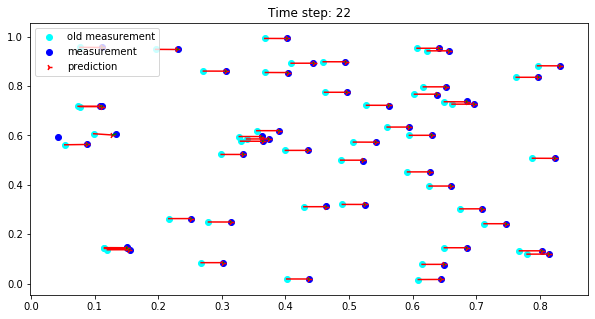

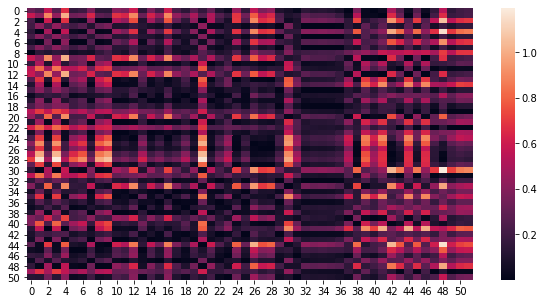

Time step: 23


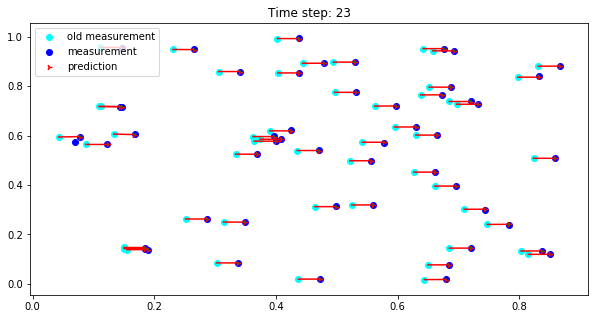

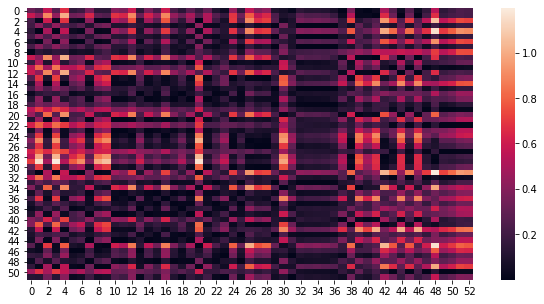

Time step: 24


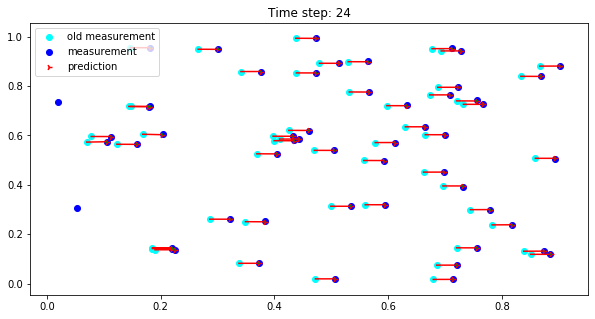

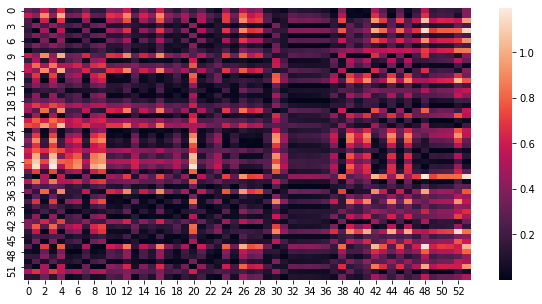

Time step: 25


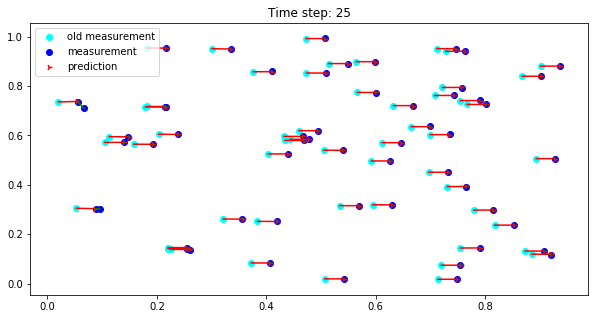

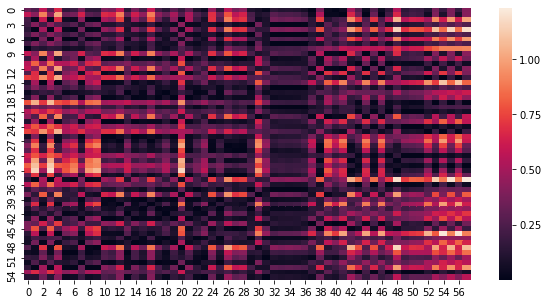

Time step: 26


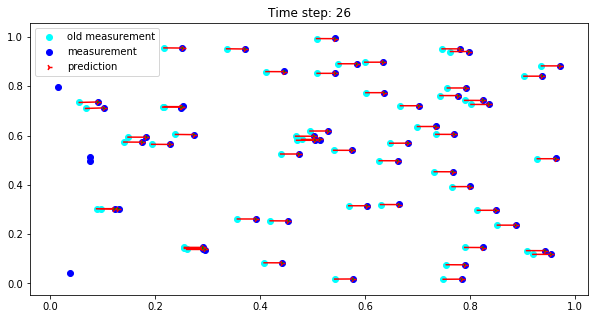

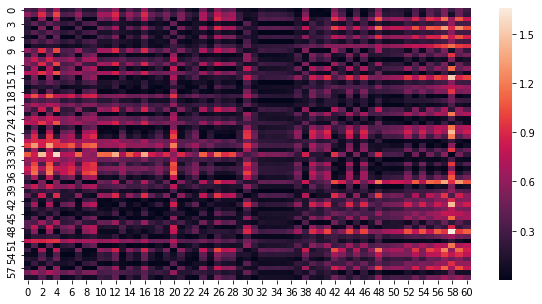

Time step: 27
dist 0.003675741919765718
B
D


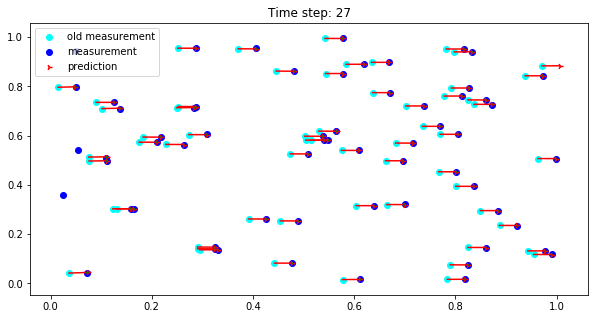

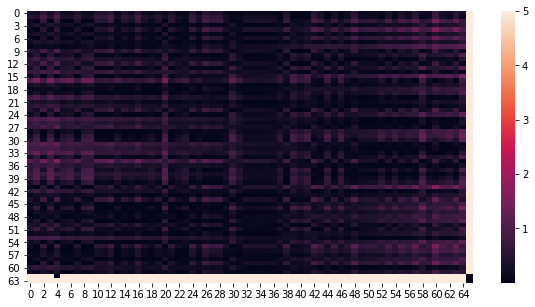

Time step: 28
dist 0.031224230477407078
dist 0.010401183336170572
dist 0.005391704261678232
dist 0.022779402086285927
B
B
B
B
D
D
D
D


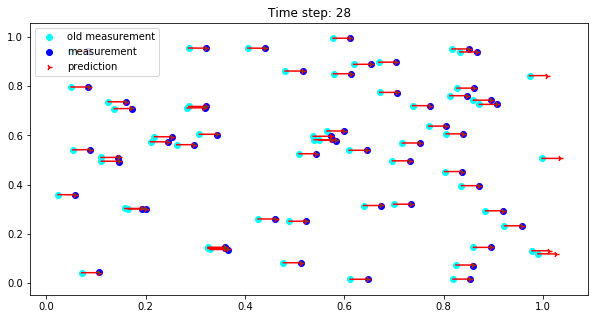

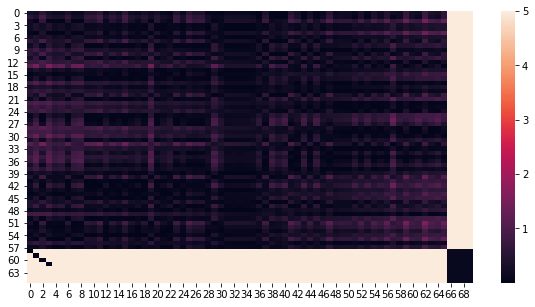

Time step: 29


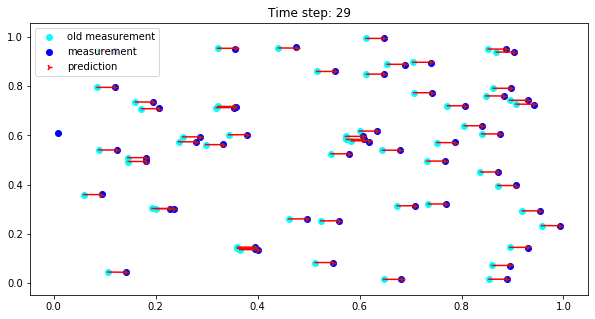

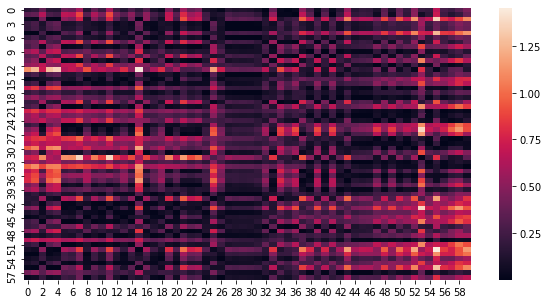

Time step: 30
dist 0.02523651957267581
B
D


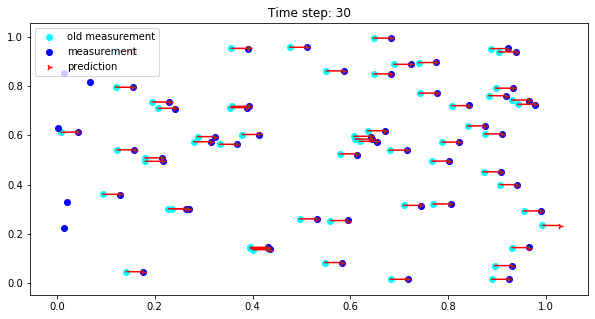

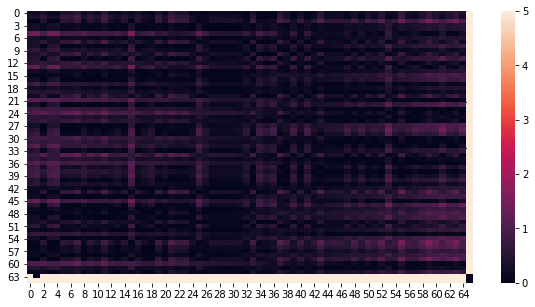

Time step: 31
dist 0.02214385106718475
dist 0.009489326751263905
dist 0.0024228740655185543
B
B
B
D
D
D


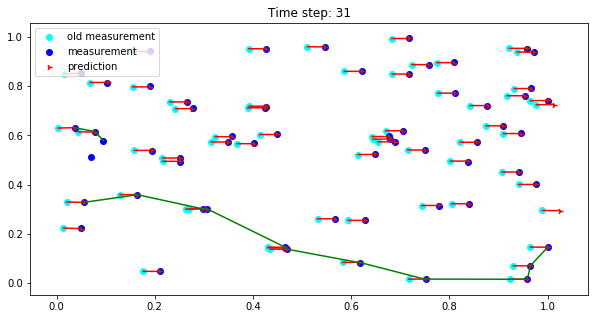

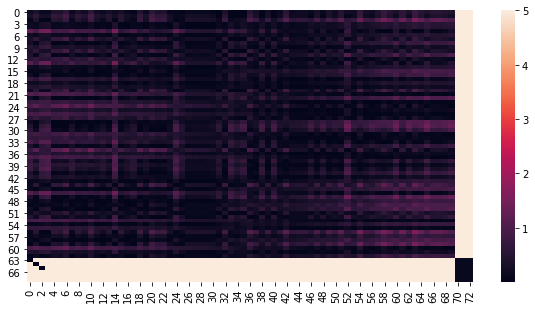

Time step: 32
dist 0.02473411720669394
dist 0.00031703344708011727
dist 0.032454515657422744
dist 0.005547429640119672
dist 0.008700413092305848
dist 0.001334355361801709
B
B
B
B
B
B
D
D
D
D
D
D


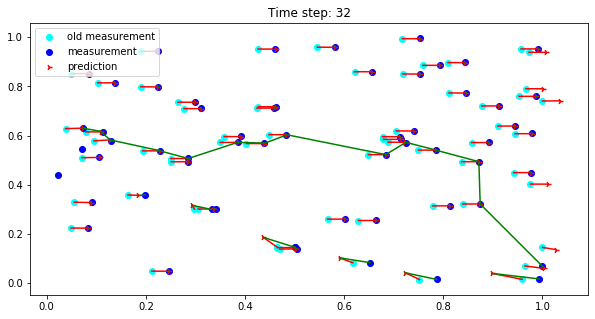

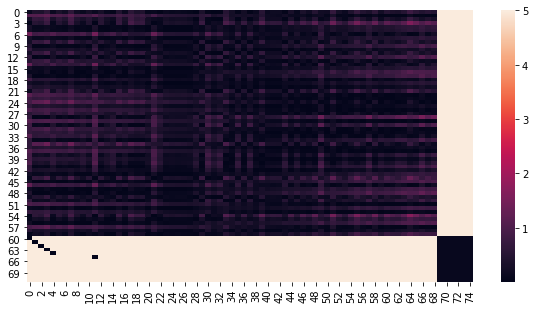

Time step: 33
dist 0.02067543898104951
dist 0.012582932664963797
dist 0.024407650871261843
dist 0.009474034706914658
B
B
B
B
D
D
D
D


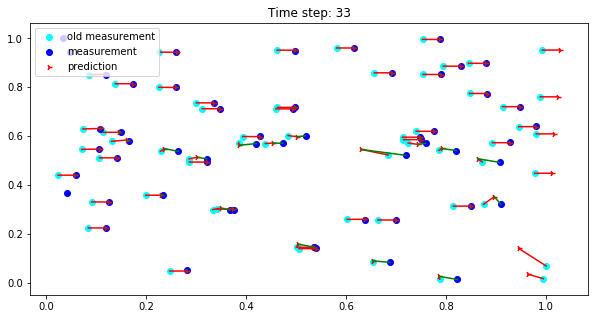

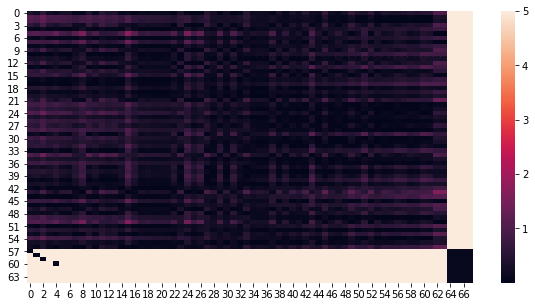

Time step: 34
dist 0.012539672712982286
dist 0.0011112740389520592
B
B
D
D


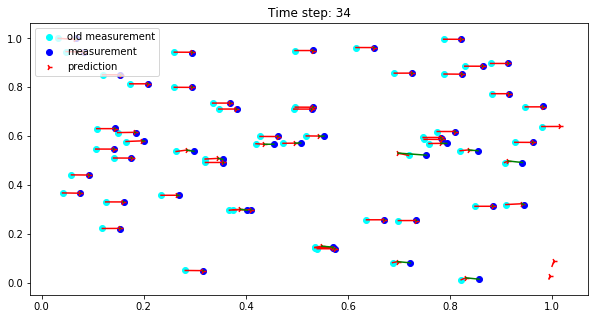

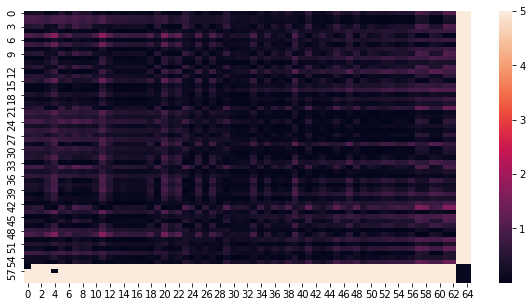

Time step: 35
dist 0.015275272428155295
dist 0.016734444054918862
B
B
D
D


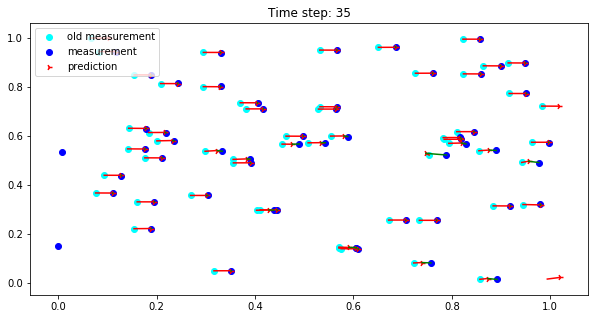

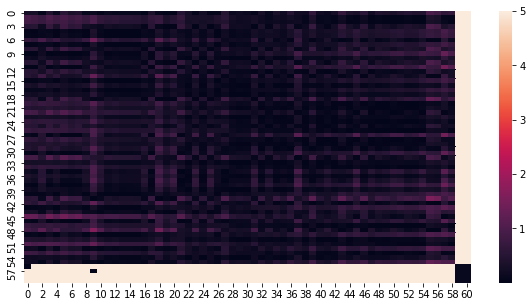

Time step: 36
dist 0.014341403216627802
dist 0.029433072732053533
B
B
D
D


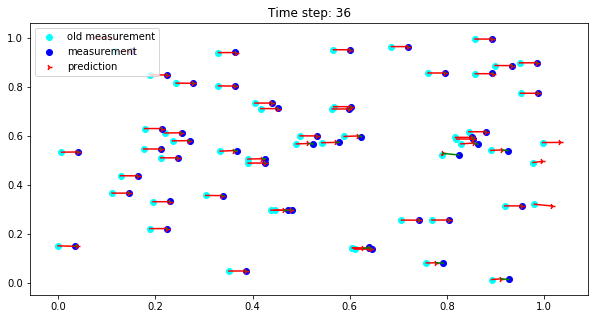

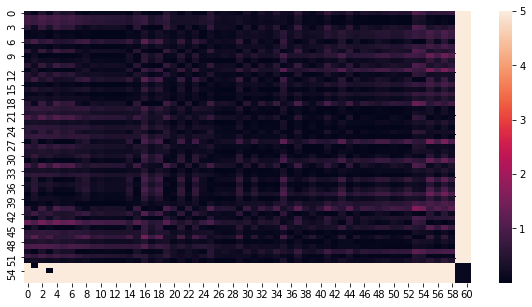

Time step: 37
dist 0.019195318143534923
dist 0.01702759776365914
dist 0.0129320559532633
B
B
B
D
D
D


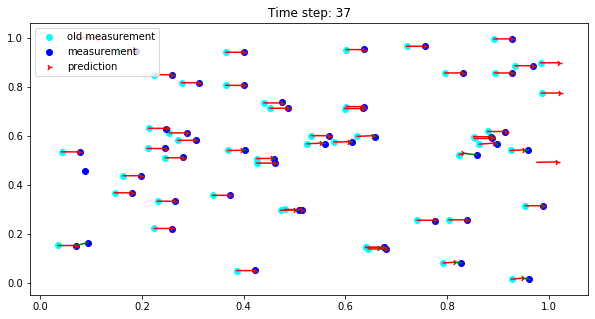

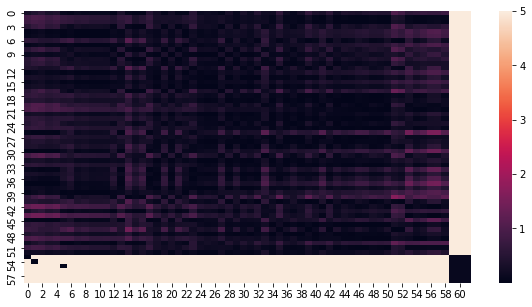

Time step: 38
dist 0.0014576947040159105
dist 0.021482451412286885
B
B
D
D


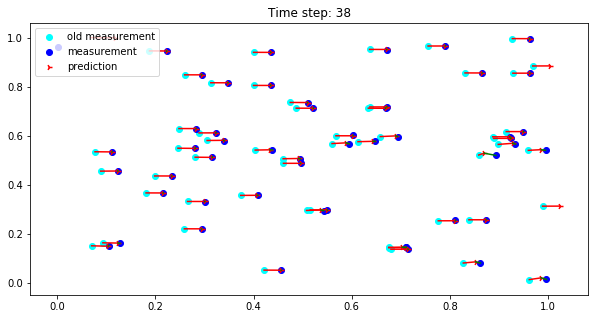

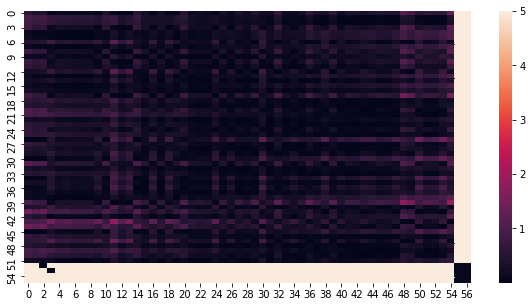

Time step: 39
dist 0.019837441445262227
dist 0.019302202207561514
B
B
D
D


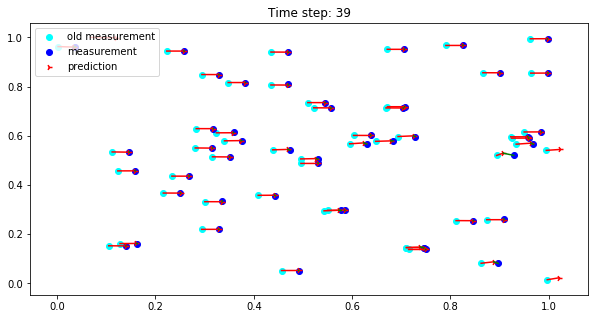

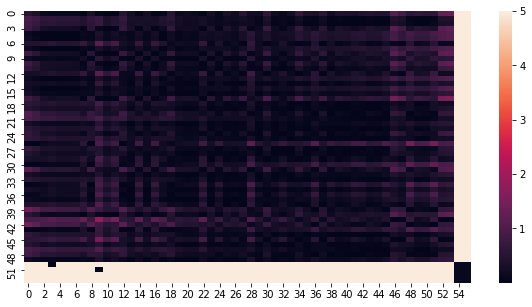

Time step: 40
dist 0.029928897198055138
dist 0.03118829436611925
dist 0.01756837918505938
B
B
B
D
D
D


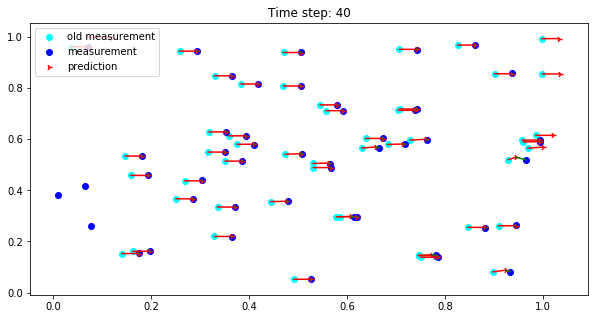

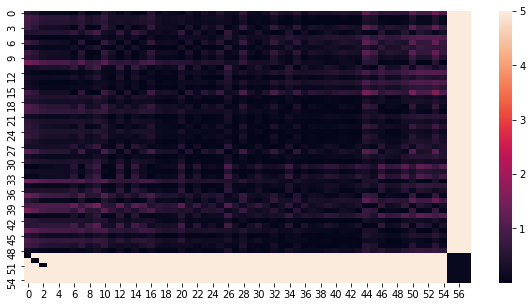

Time step: 41
dist 0.025048961635797173
dist 0.026842315853325083
dist 0.014432575323285457
B
B
B
D
D
D


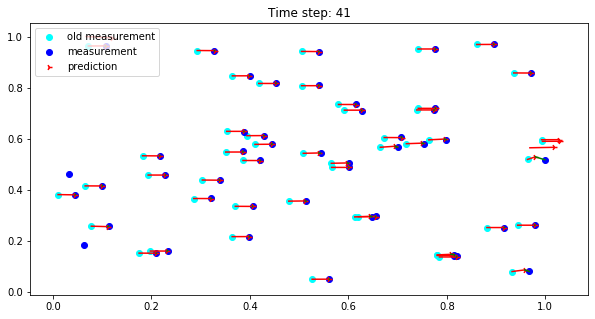

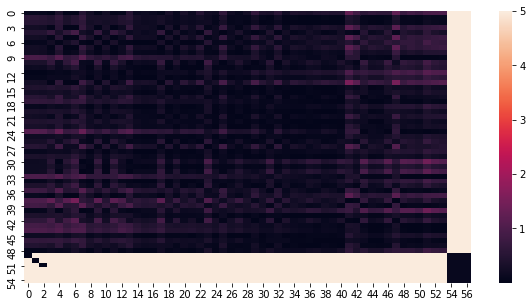

Time step: 42
dist 0.01147080167200798
dist 0.003507039028692649
dist 0.013039561252181642
B
B
B
D
D
D


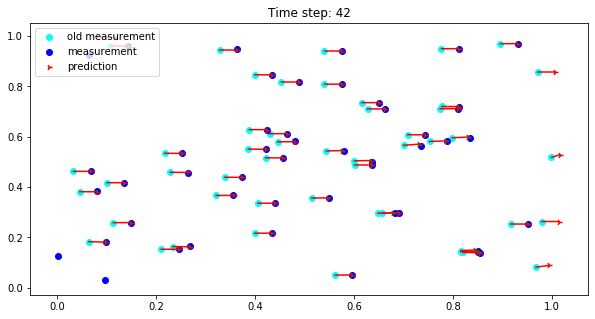

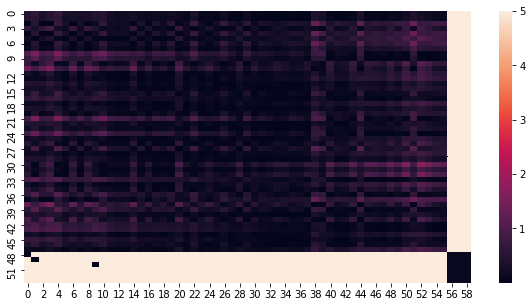

Time step: 43
dist 0.008744417800601978
B
D


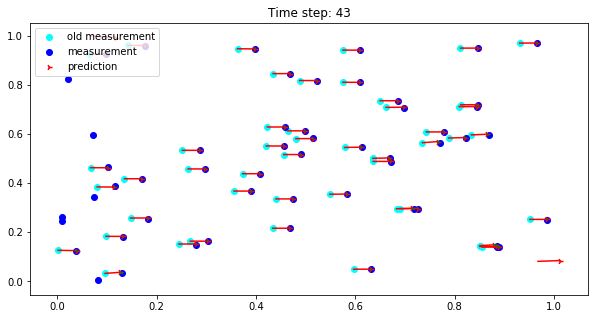

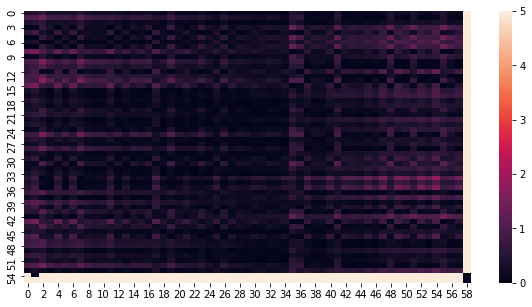

Time step: 44
dist 0.01904728097329289
dist 0.002307797363965358
B
B
D
D


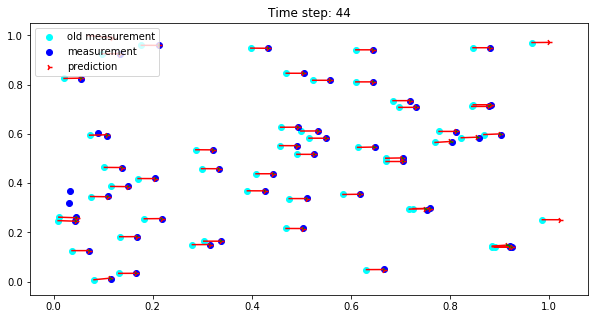

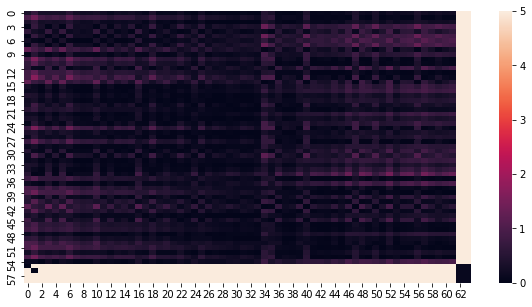

Time step: 45


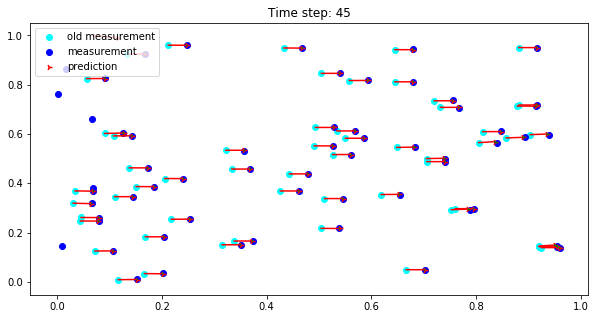

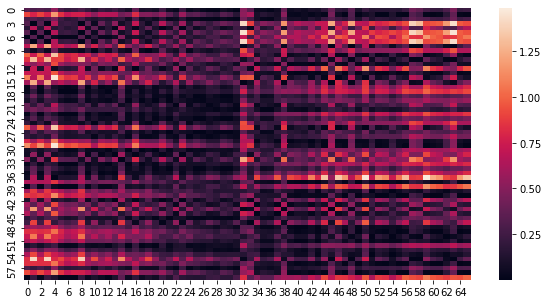

Time step: 46


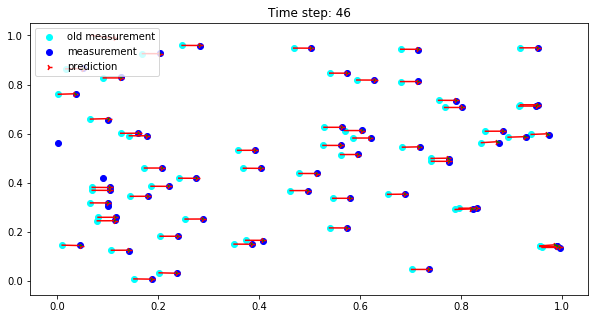

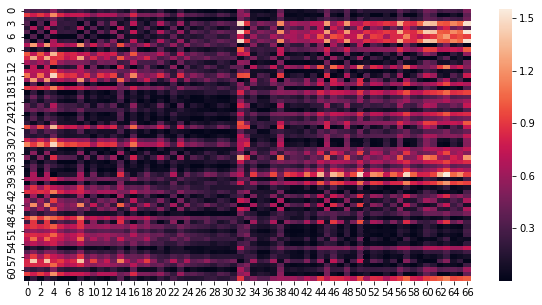

Time step: 47
dist 0.02723248132445888
dist 0.023029341209232612
dist 0.0029597489511568043
dist 0.017487040568413992
B
B
B
B
D
D
D
D


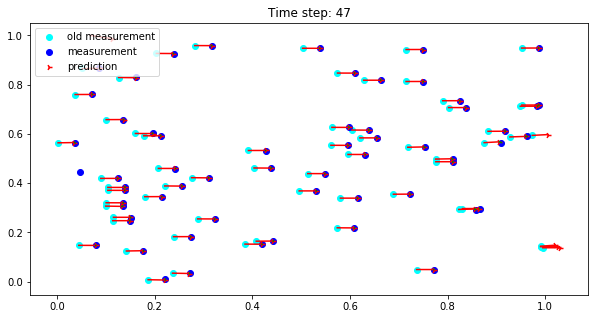

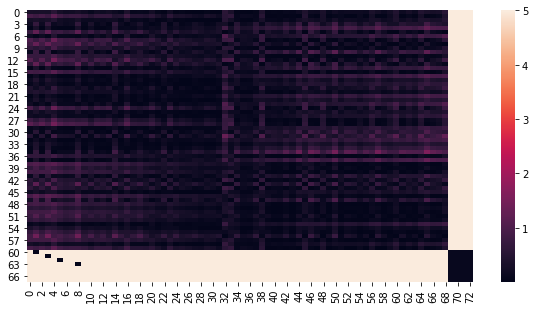

Time step: 48
dist 0.01957805777582844
dist 0.01660470082741461
dist 0.018970100436123793
B
B
B
D
D
D


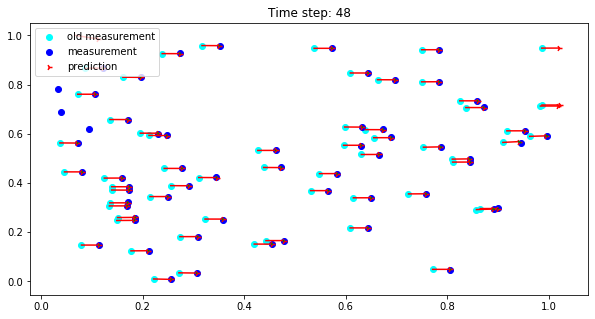

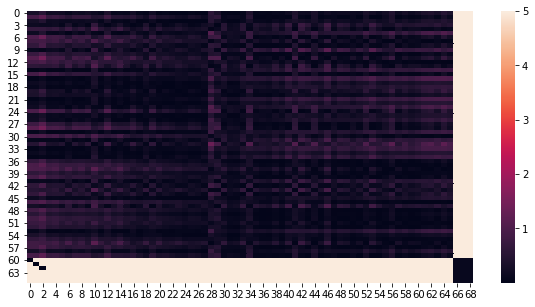

Time step: 49
dist 0.027918946606812156
B
D


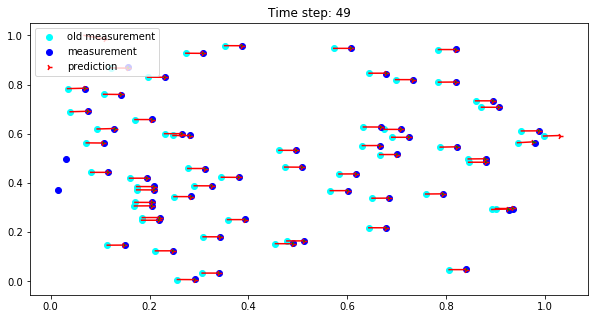

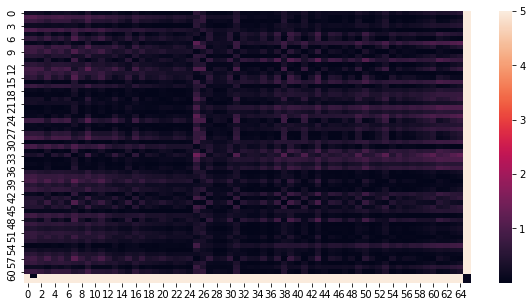

Time step: 50
dist 0.020461702685056427
dist 0.008841519272645204
B
B
D
D


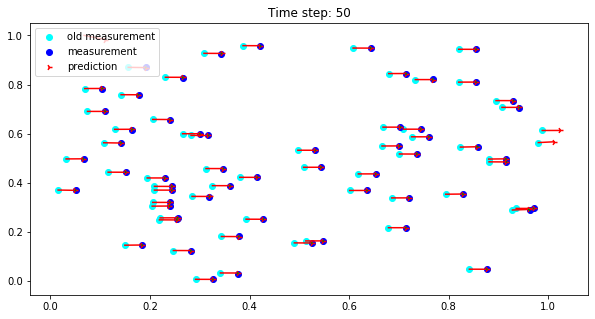

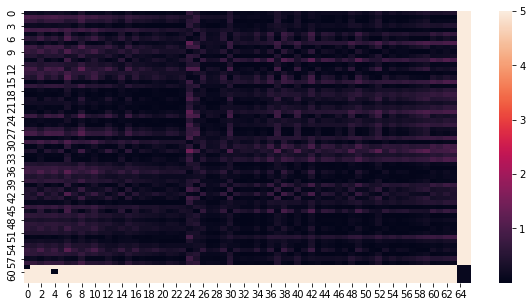

Time step: 51
dist 0.0029951466113471437
B
D


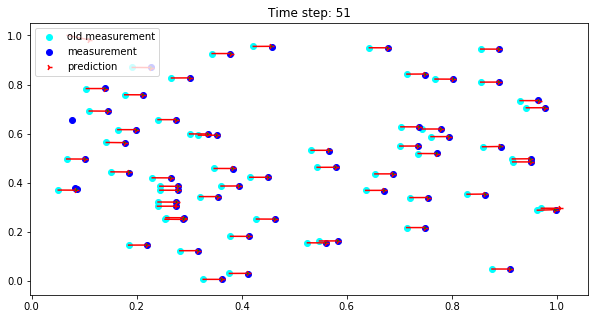

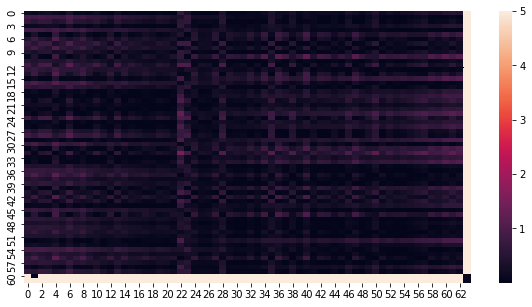

Time step: 52
dist 0.009561616515099347
dist 0.0023832916024550954
dist 0.02861514536530252
B
B
B
D
D
D


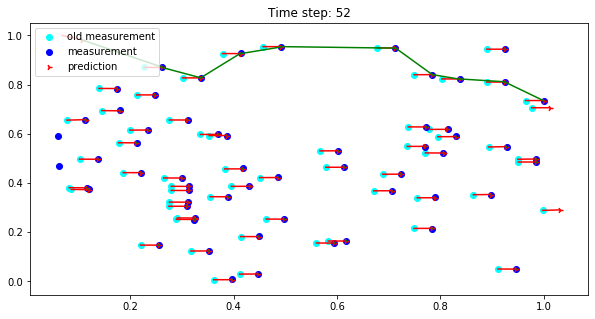

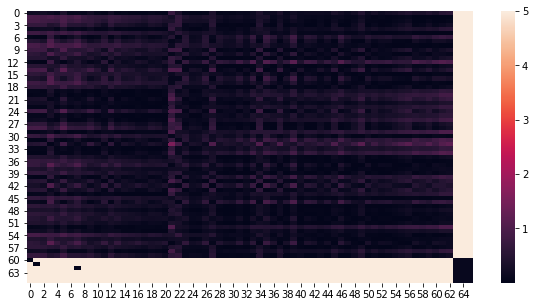

Time step: 53
dist 0.01844270417240601
dist 0.016959470131059806
B
B
D
D


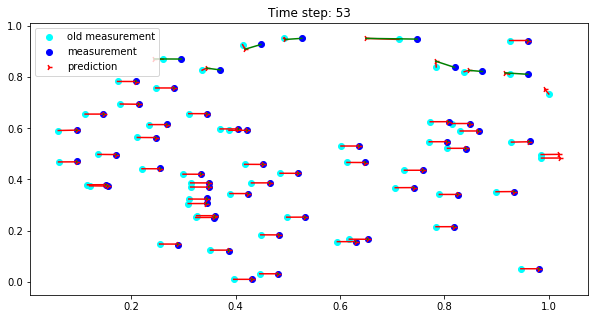

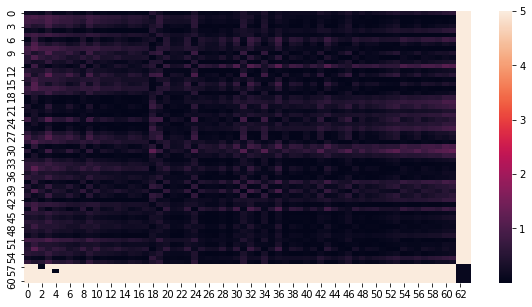

Time step: 54
dist 0.023073243341056537
dist 0.013706924879089533
B
B
D
D


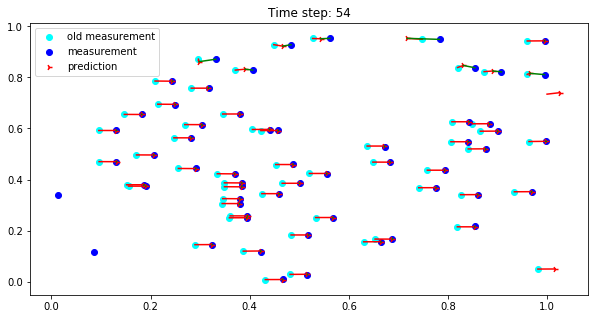

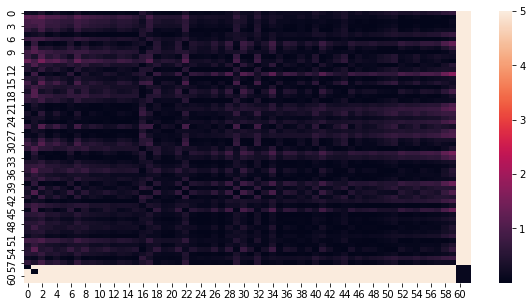

Time step: 55
dist 0.027481948842358328
dist 0.029793710521358818
dist 0.003646214664697167
dist 0.0011335130091811862
B
B
B
B
D
D
D
D


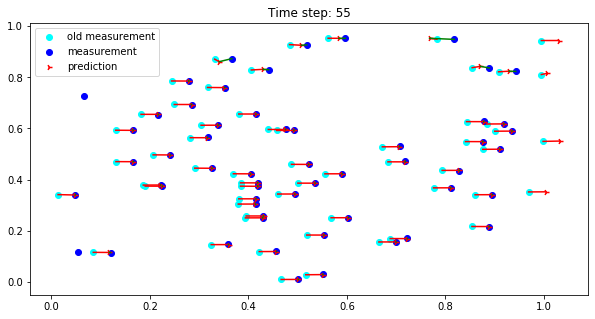

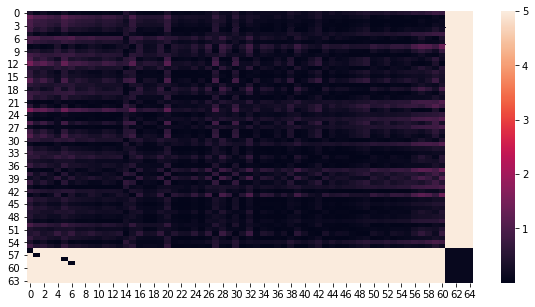

Time step: 56


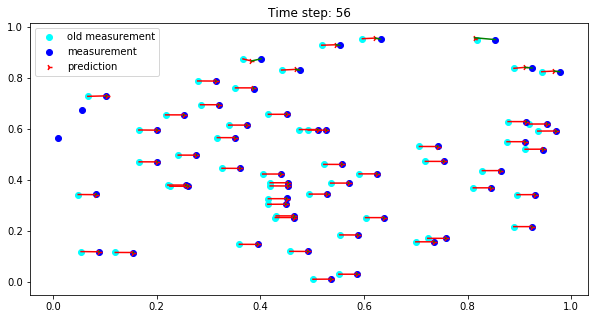

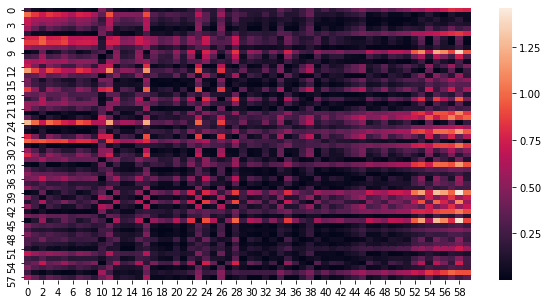

Time step: 57
dist 0.0009153733467210934
dist 0.0026413820982185143
B
B
D
D


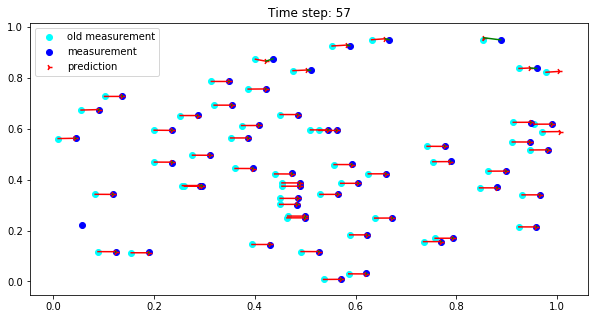

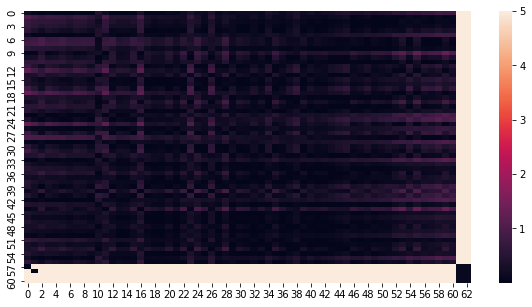

Time step: 58
dist 0.02143820082796477
dist 0.013506581680412744
dist 0.001965533152743504
B
B
B
D
D
D


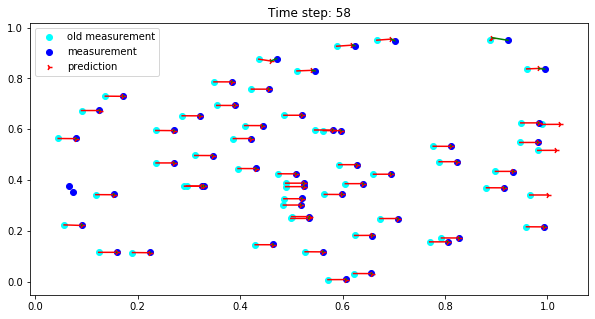

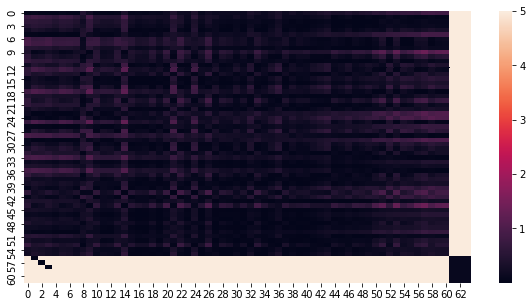

Time step: 59
dist 0.026655178344501484
dist 0.015540769398896037
dist 0.013627681026156635
dist 0.01627396827993355
B
B
B
B
D
D
D
D


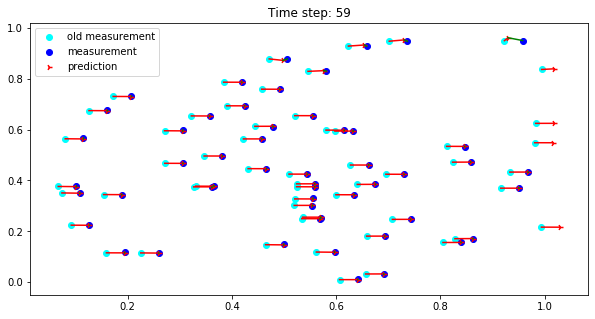

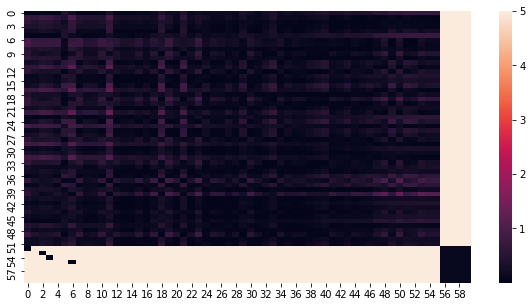

Time step: 60
dist 0.0009931458294381024
B
D


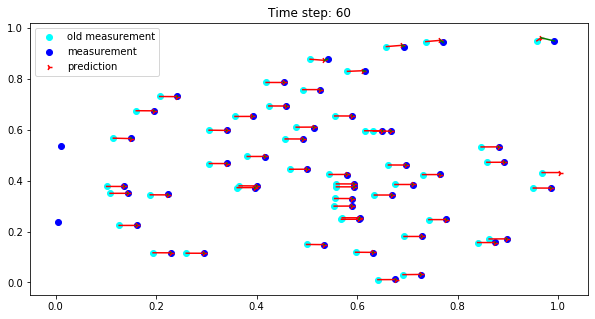

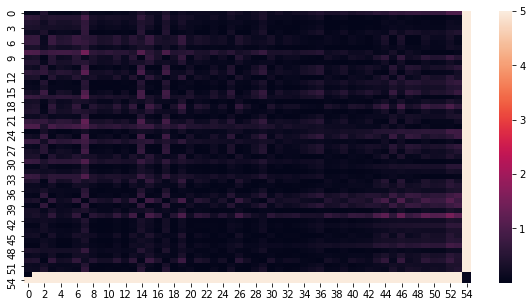

Time step: 61
dist 0.018697154472350874
dist 0.00036531880284940144
B
B
D
D


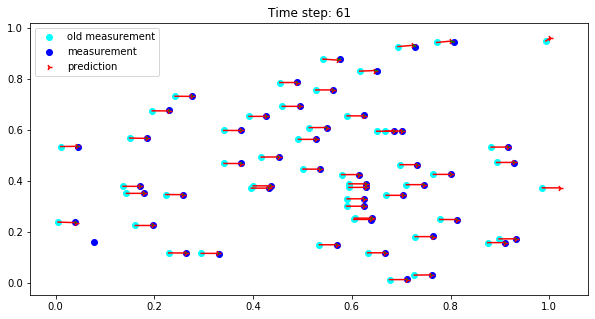

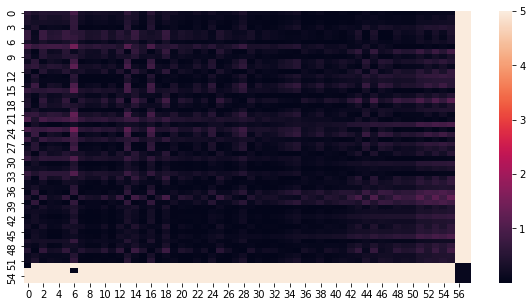

Time step: 62


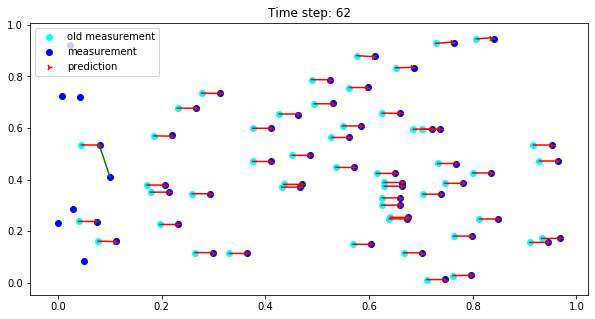

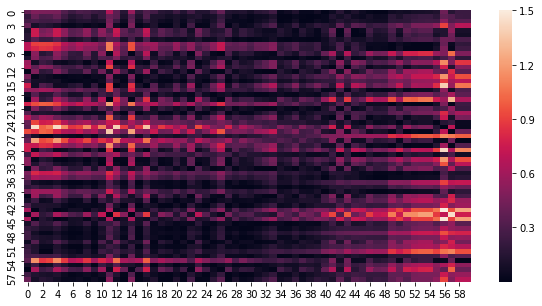

Time step: 63
dist 0.00028828122996049643
B
D


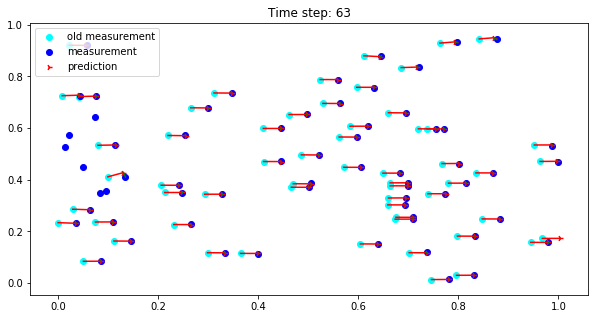

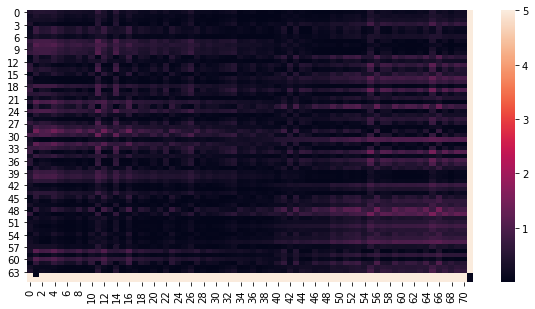

Time step: 64
dist 0.019382477704923184
dist 0.030925139831859072
dist 0.012428379604626949
B
B
B
D
D
D


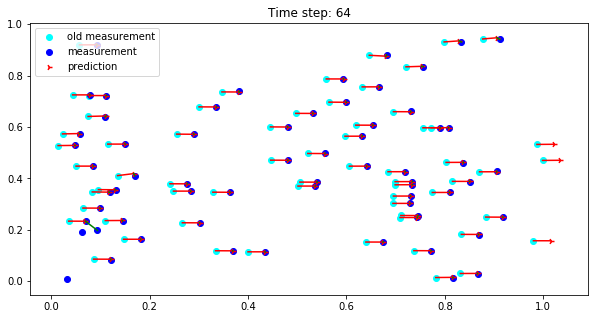

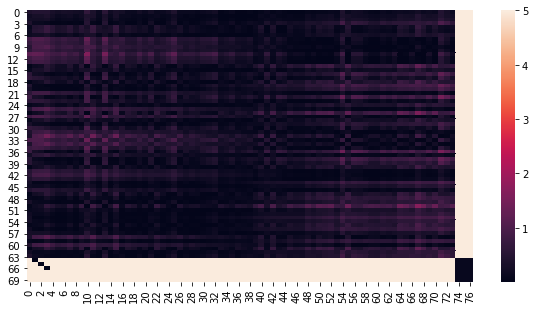

Time step: 65


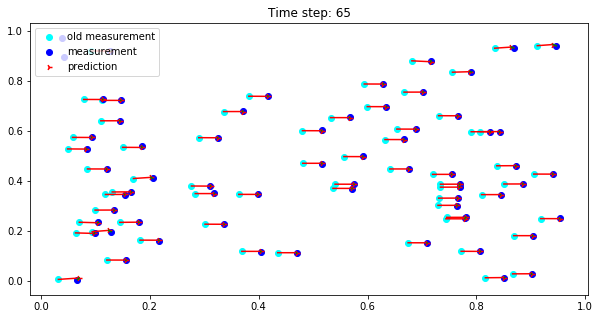

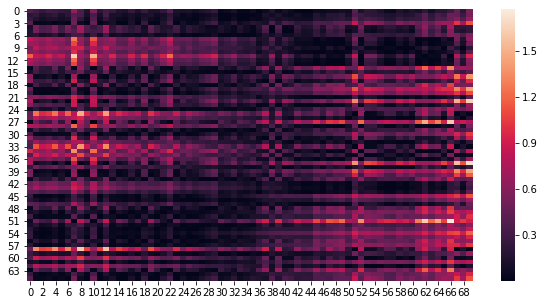

Time step: 66


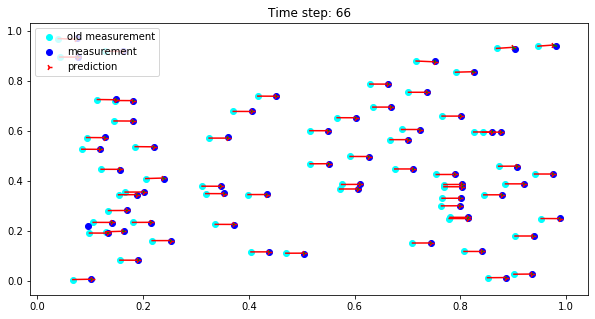

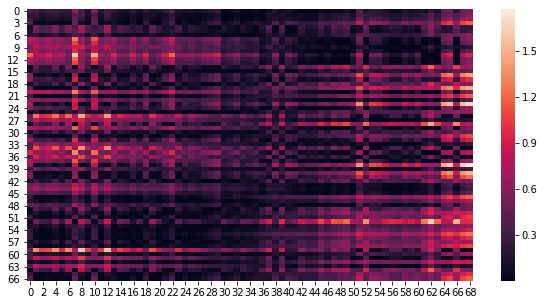

Time step: 67
dist 0.020590339379850775
dist 0.007994889404819183
dist 0.008651259242033582
B
B
B
D
D
D


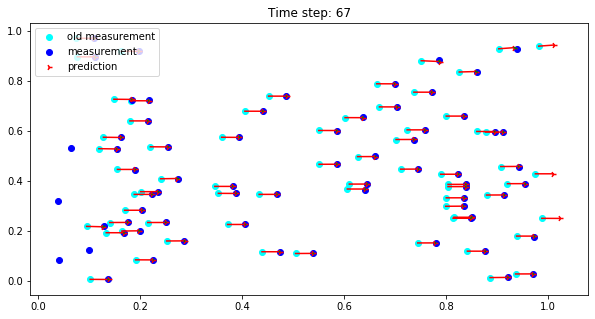

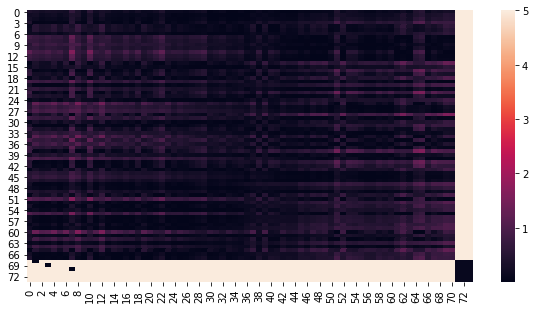

Time step: 68
dist 0.005729568357442538
dist 0.0036913416599417825
B
B
D
D


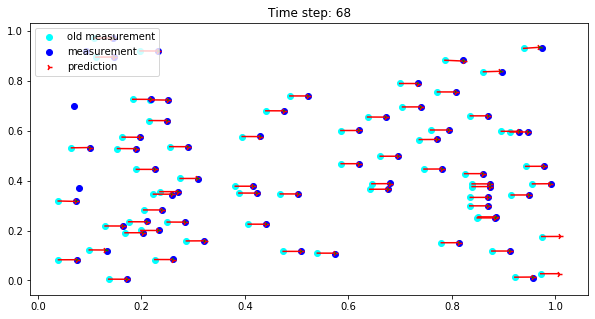

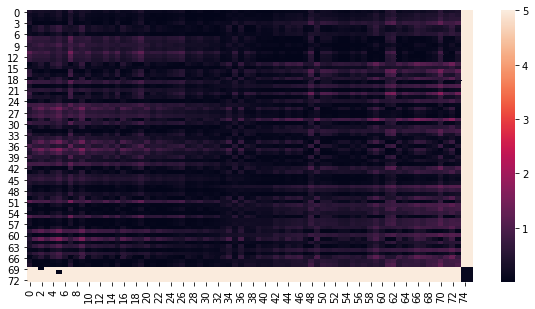

Time step: 69
dist 0.02312276185031026
dist 0.010162812017243894
dist 0.001306120739286376
B
B
B
D
D
D


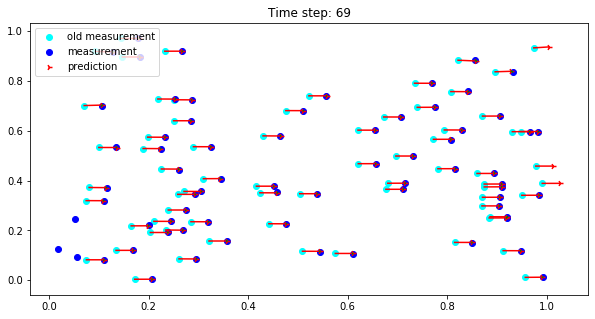

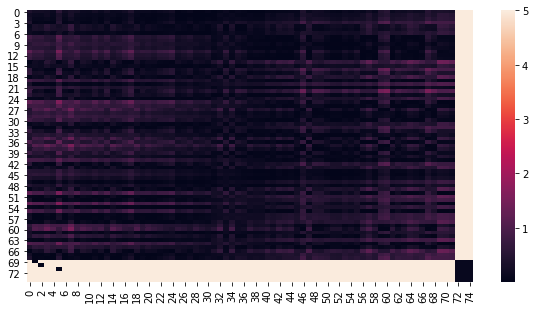

Time step: 70
dist 0.01713876339966225
dist 0.023694692213834134
dist 0.015009630789805328
dist 0.0021373103027675366
B
B
B
B
D
D
D
D


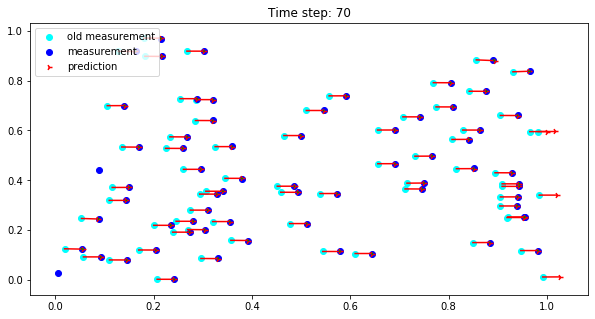

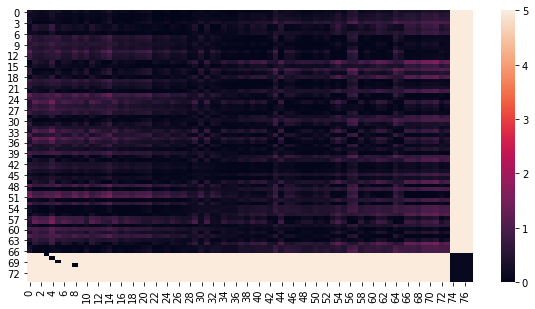

Time step: 71
dist 0.014162896730074648
B
D


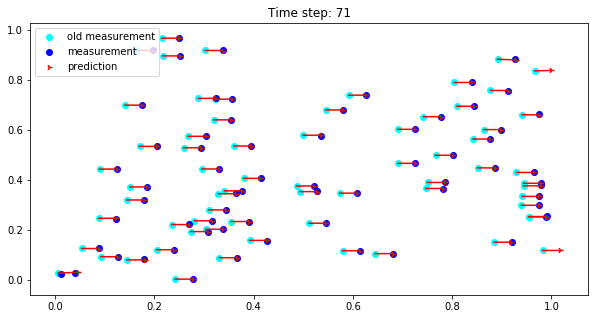

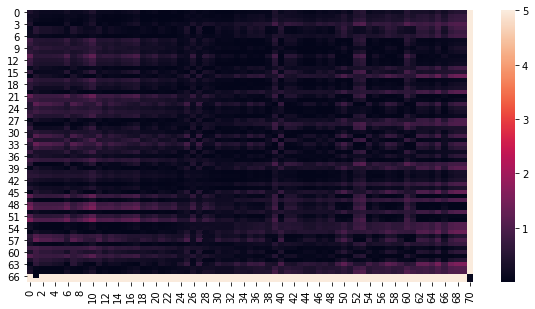

Time step: 72
dist 0.023100264870903997
dist 0.02139576347027705
dist 0.008078673082870358
dist 0.011684190066546085
dist 0.011759117215097703
dist 0.008169626817527309
dist 0.0142763502062484
dist 0.007099767575049709
B
B
B
B
B
B
B
B
D
D
D
D
D
D
D
D


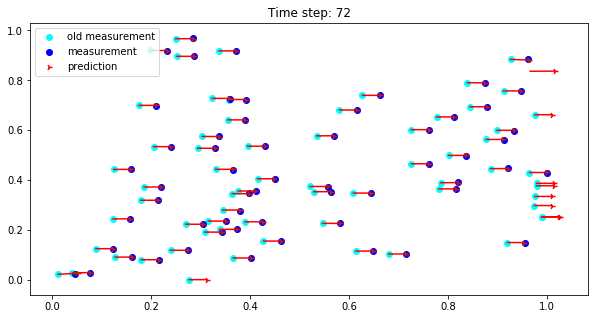

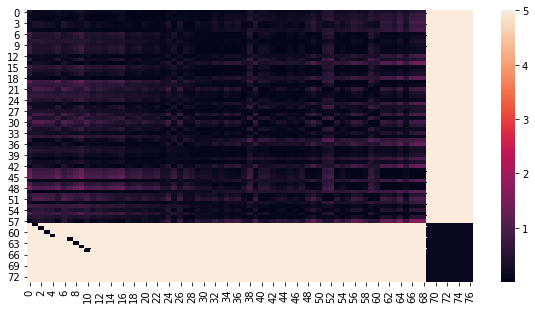

Time step: 73
dist 0.03201955169462889
B
D


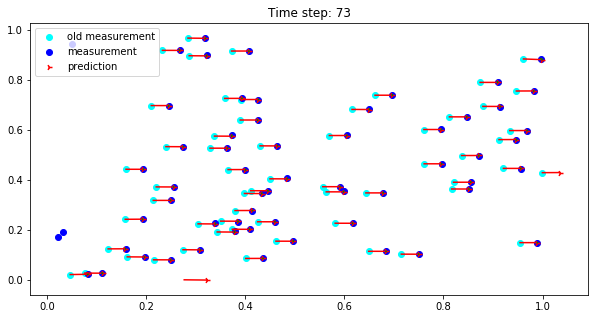

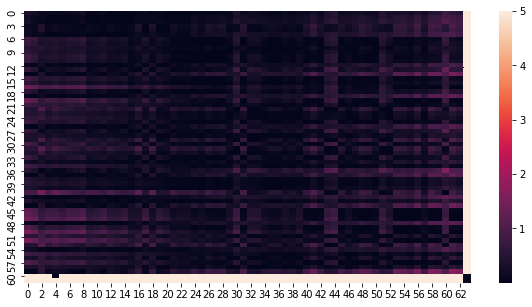

Time step: 74
dist 0.03192473704108023
dist 0.014643101803084146
dist 0.021881307854344723
dist 0.0013110158133238237
B
B
B
B
D
D
D
D


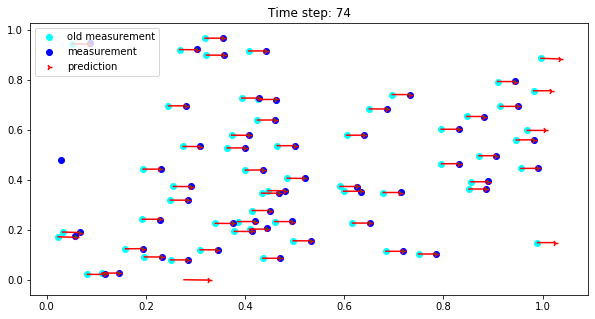

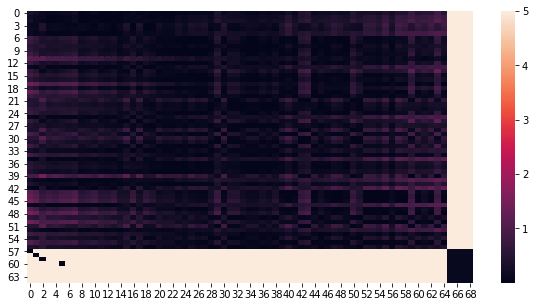

Time step: 75
dist 0.014527269715939761
dist 0.023604587817231515
B
B
D
D


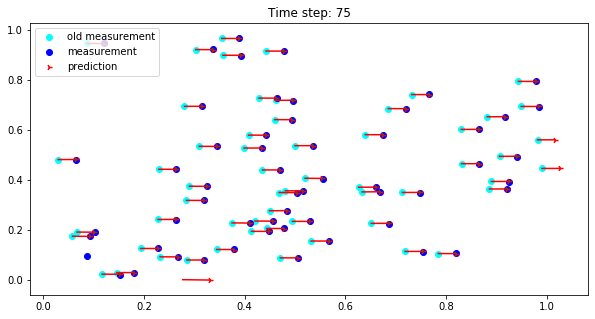

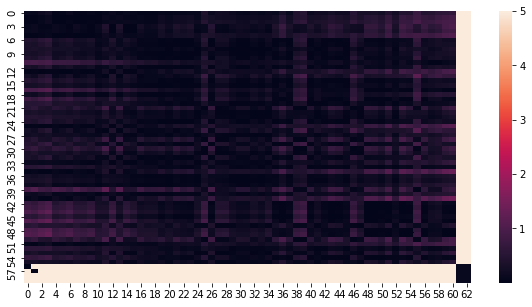

Time step: 76
dist 0.01707329277101355
dist 0.0116468055553125
B
B
D
D


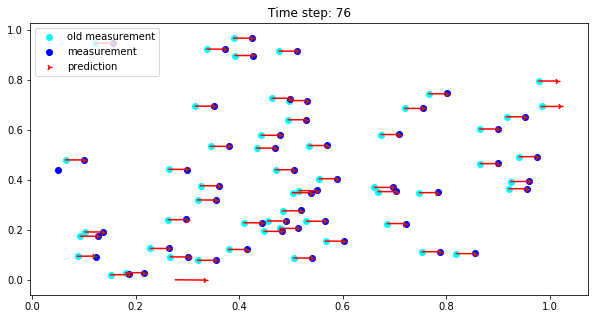

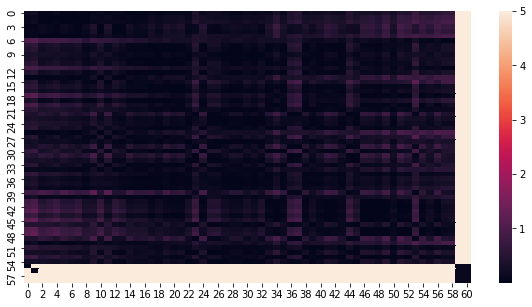

Time step: 77
dist 0.009011702011496592
B
D


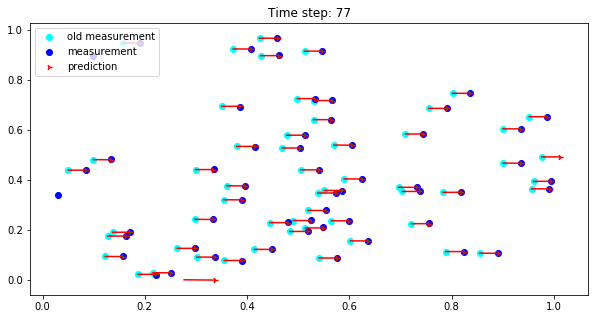

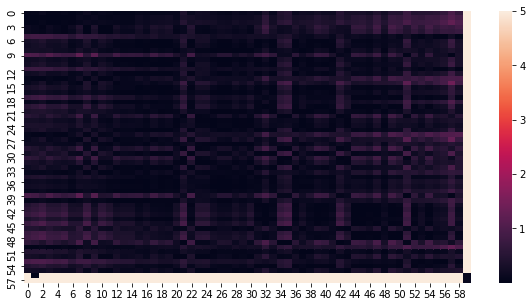

Time step: 78
dist 0.027825083572447395
dist 0.01954518808738559
dist 0.024110250763524688
B
B
B
D
D
D


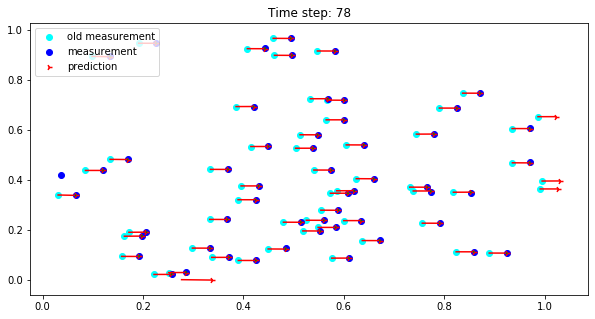

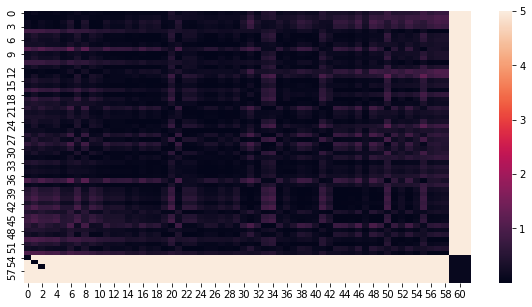

Time step: 79
dist 0.003771242830928001
dist 0.0030970219699819612
B
B
D
D


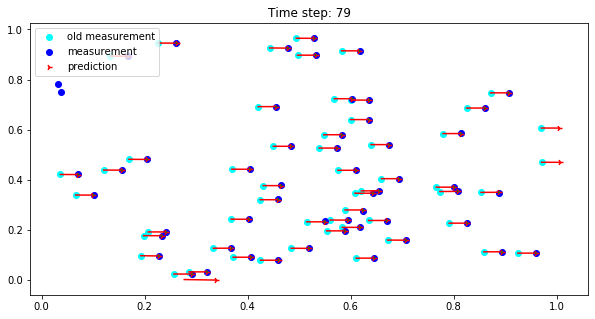

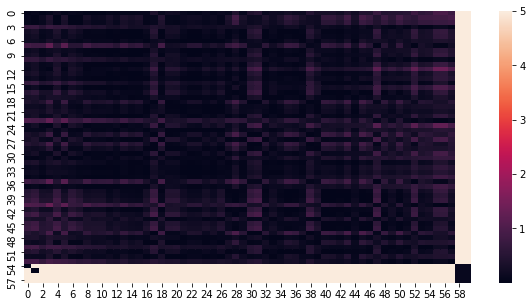

Time step: 80


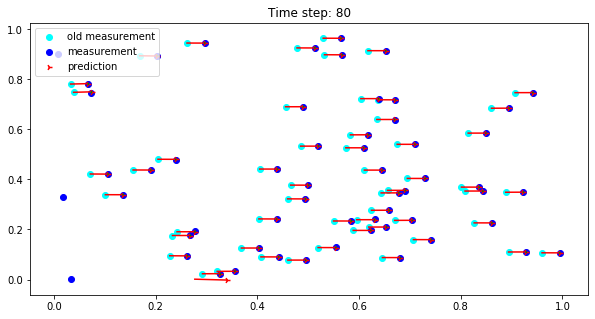

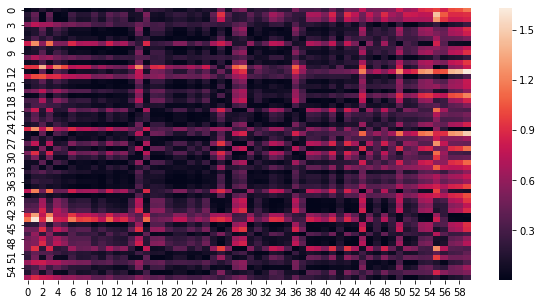

Time step: 81
dist 0.02731118069542915
B
D


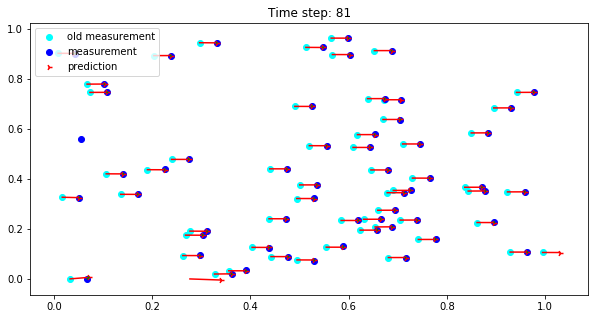

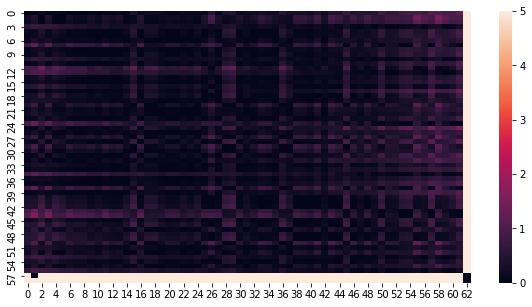

Time step: 82
dist 0.00941854319221247
B
D


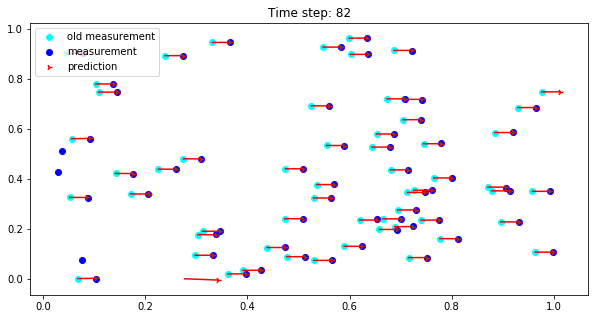

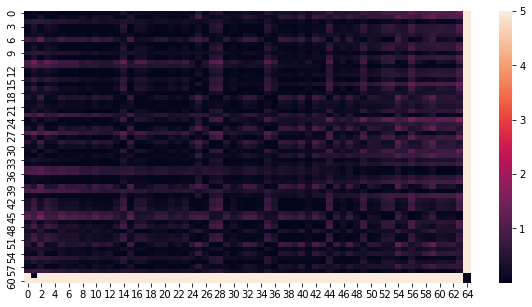

Time step: 83
dist 0.025945022778006033
dist 0.031490313135357884
dist 0.0019647089196179746
B
B
B
D
D
D


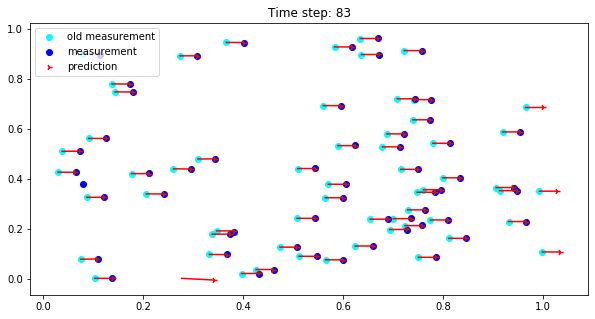

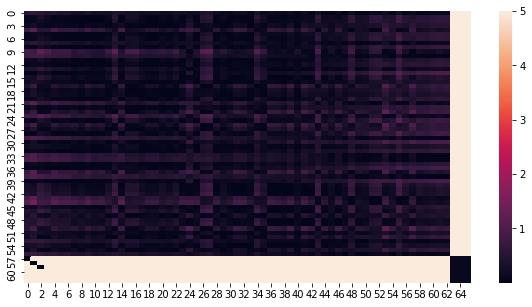

Time step: 84
dist 0.001007770972704325
B
D


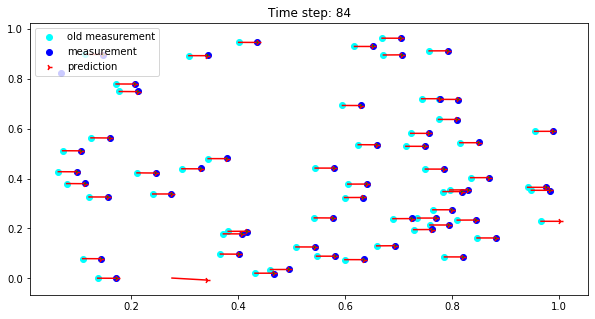

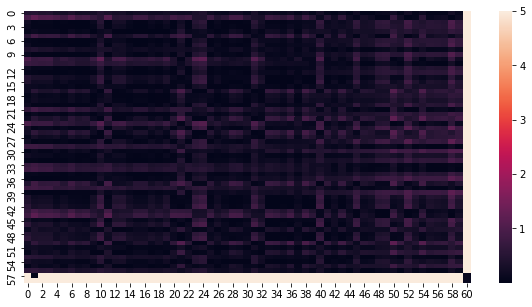

Time step: 85
dist 0.02210161258796317
dist 0.00928635372277653
dist 0.016080687704116192
B
B
B
D
D
D


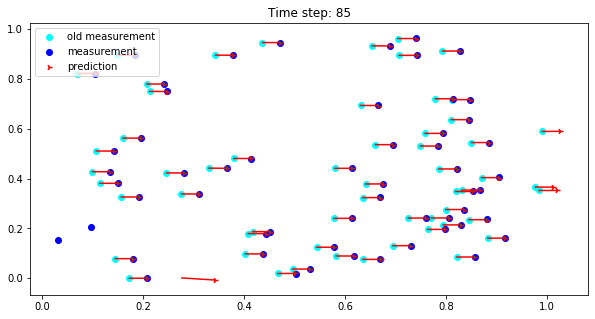

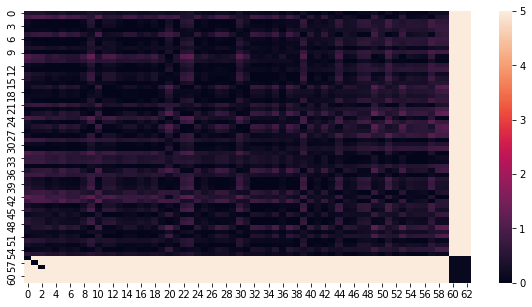

Time step: 86


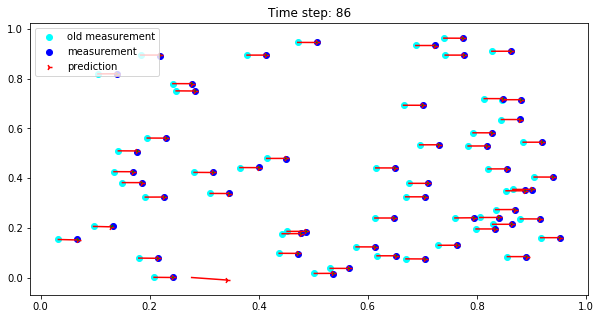

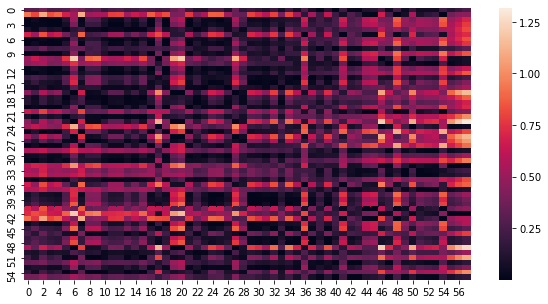

Time step: 87


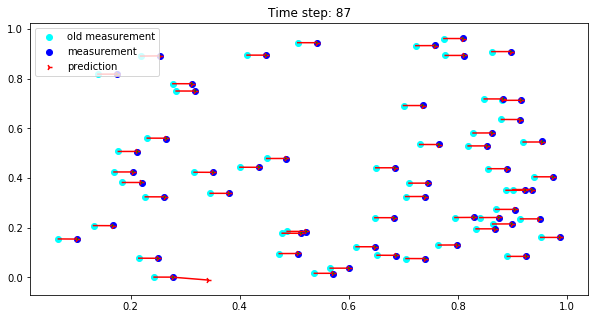

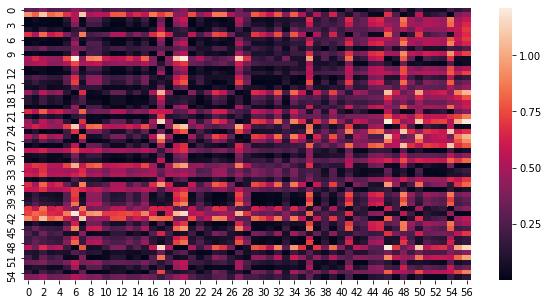

Time step: 88
dist 0.00742982020541838
dist 0.01939572002373935
B
B
D
D


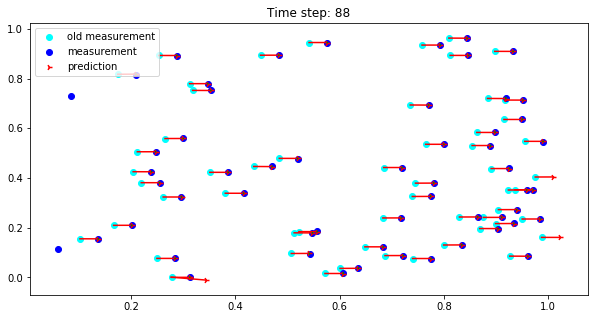

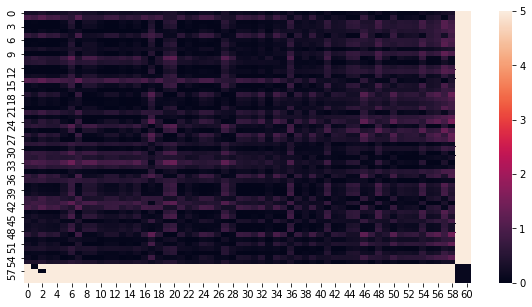

Time step: 89
dist 0.017435328455171595
dist 0.022478219375630326
dist 0.003521751735617862
B
B
B
D
D
D


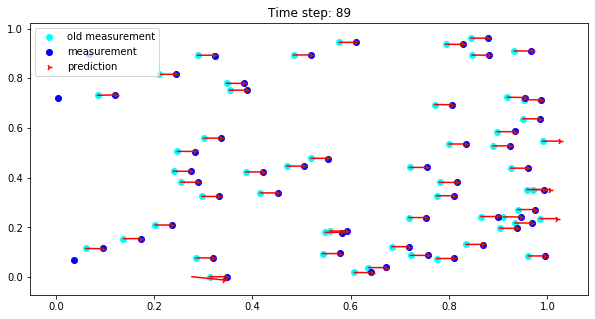

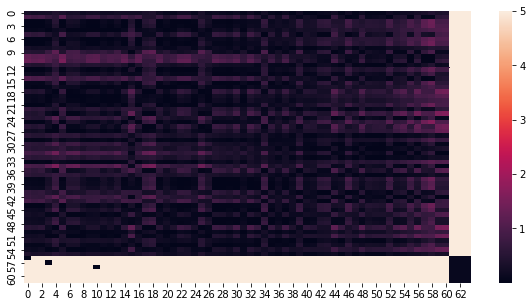

Time step: 90
dist 0.0070857025677961705
dist 0.0011974099505500657
dist 1.984074752336973e-05
dist 0.028378159854201
dist 0.019167929951676932
dist 0.026088480198258157
dist 0.01758853605458599
B
B
B
B
B
B
B
D
D
D
D
D
D
D


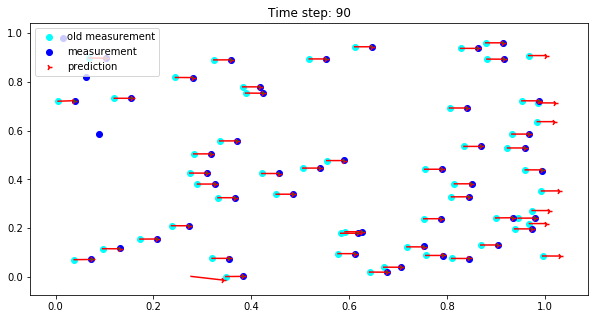

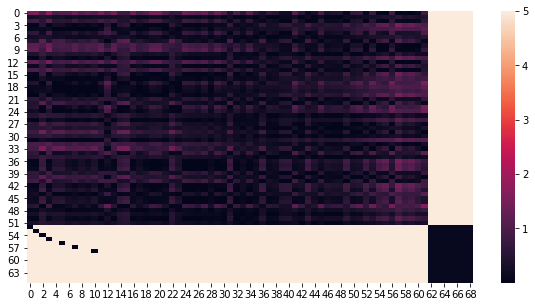

Time step: 91
dist 0.021102389806621158
dist 0.0005253599581525048
dist 0.027863716298311525
dist 0.006080558288341642
dist 0.013229419956968469
B
B
B
B
B
D
D
D
D
D


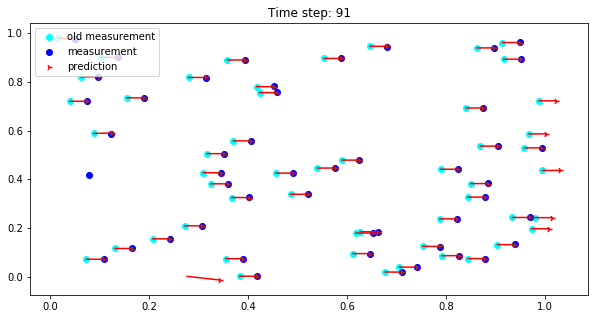

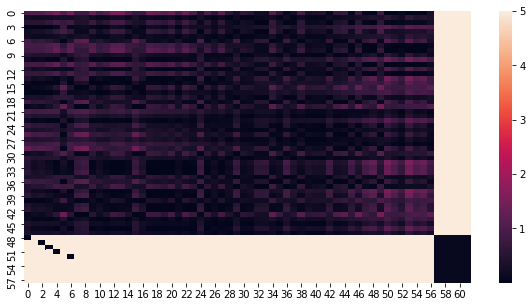

Time step: 92
dist 0.02643813049404553
dist 0.0022909682741025783
B
B
D
D


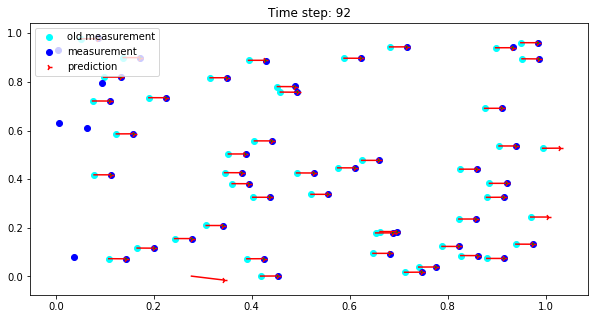

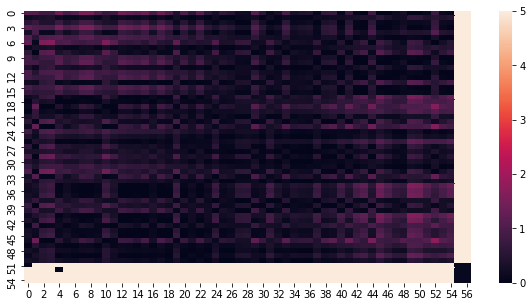

Time step: 93
dist 0.019473758017481524
dist 0.01696673172864971
dist 0.00690485743709468
B
B
B
D
D
D


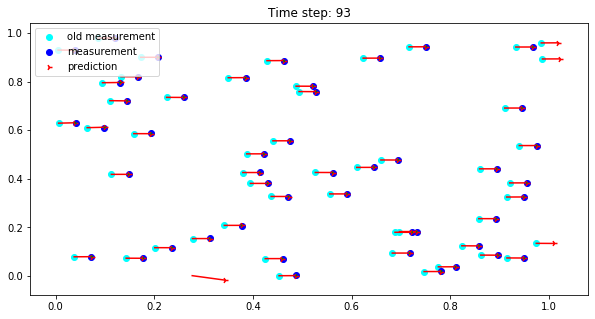

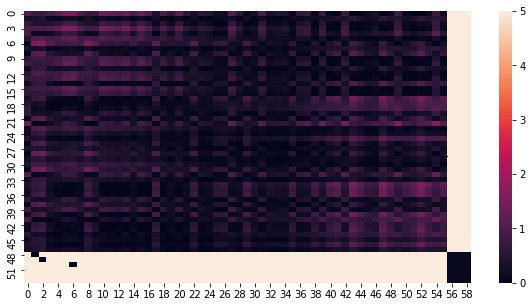

Time step: 94
dist 0.007527662597113682
dist 6.675394974275939e-05
B
B
D
D


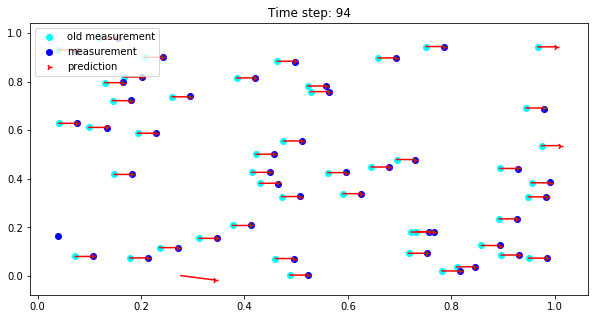

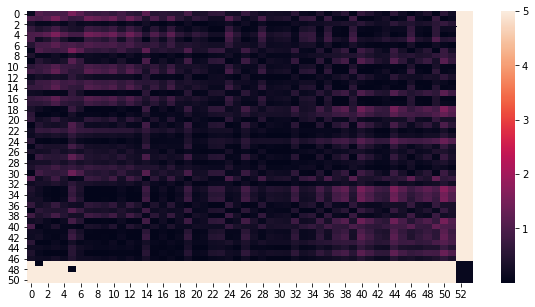

Time step: 95
dist 0.01716533056342029
dist 0.017459515164029327
dist 0.0232714495072166
dist 0.012853712196481348
B
B
B
B
D
D
D
D


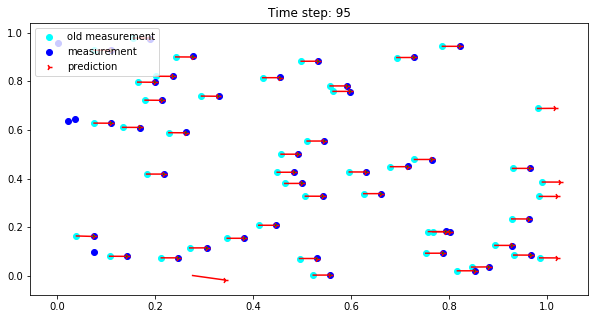

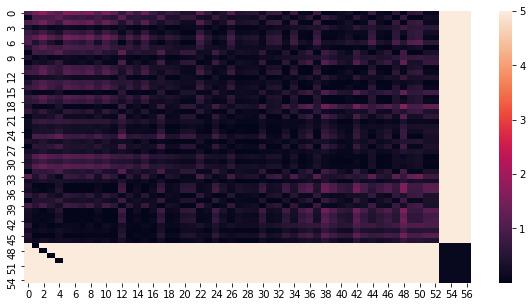

Time step: 96
dist 0.00043252993951847785
B
D


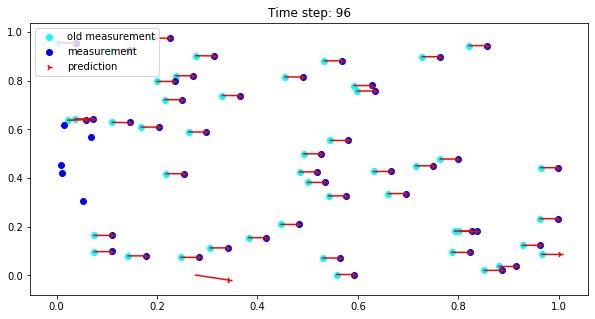

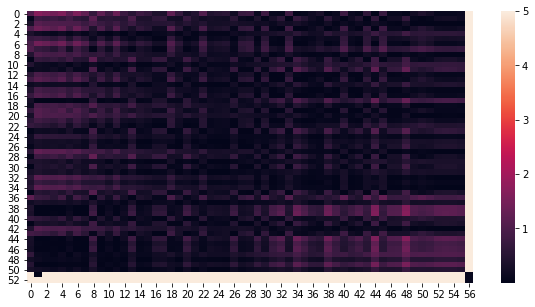

Time step: 97
dist 0.03068799878544204
dist 0.03216614350815994
B
B
D
D


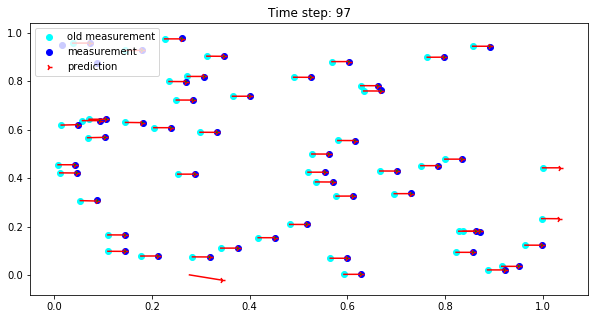

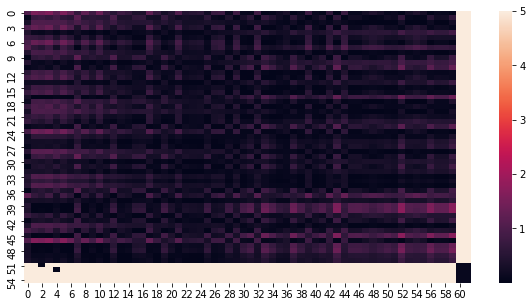

Time step: 98
dist 0.030804679457849593
B
D


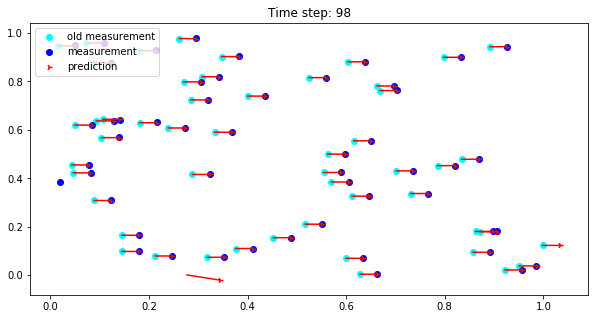

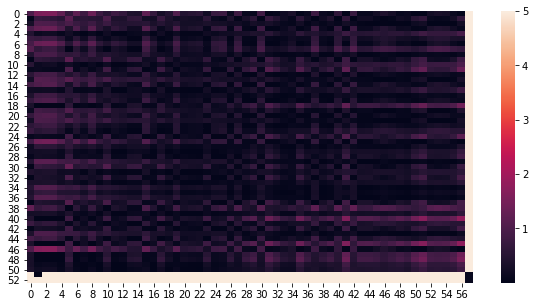

Time step: 99
dist 0.018421850396600714
B
D


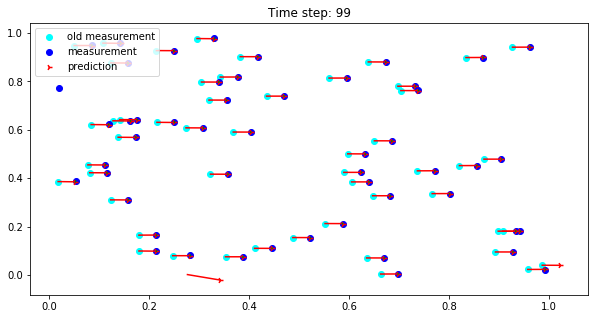

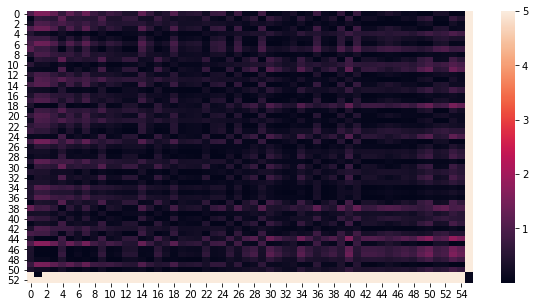

Time step: 100
dist 0.02389693314812069
B
D


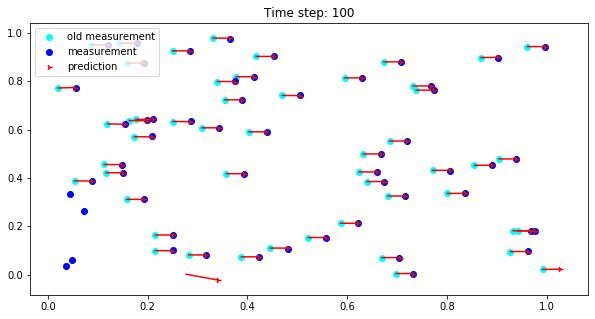

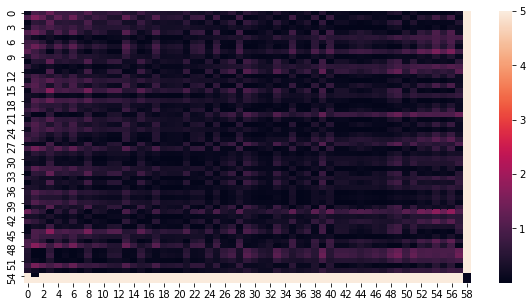

Time step: 101
dist 0.00959128182802993
dist 0.028877130940348827
dist 0.000525863444421848
B
B
B
D
D
D


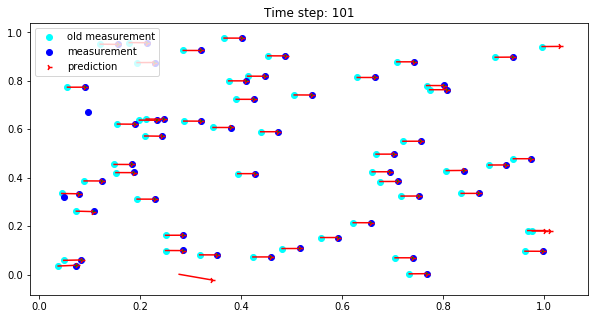

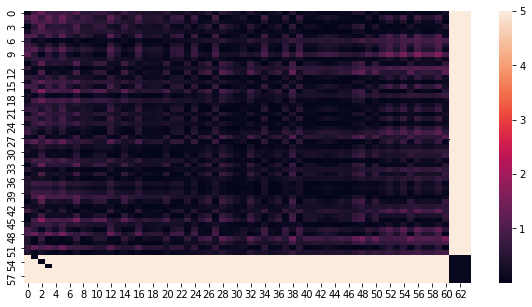

Time step: 102
dist 0.007022192178210318
dist 0.029762471234569876
B
B
D
D


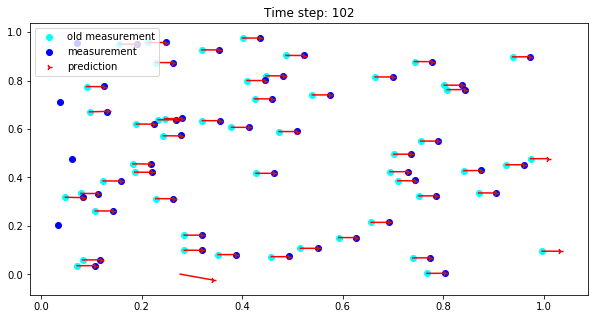

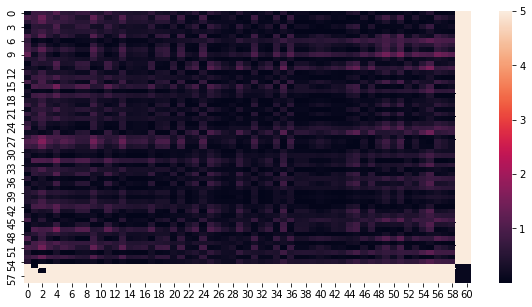

Time step: 103
dist 0.005608771353129649
B
D


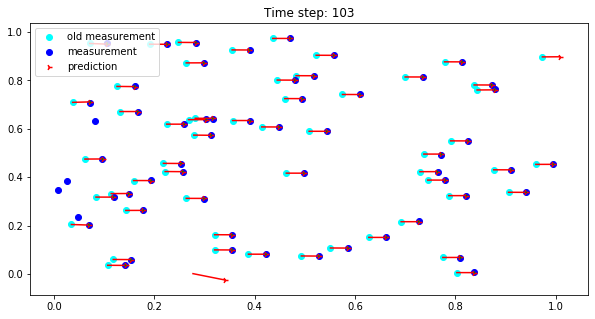

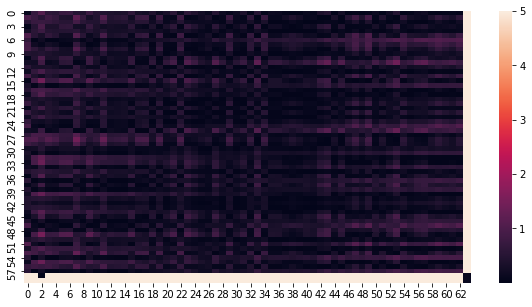

Time step: 104
dist 0.028065791934797746
B
D


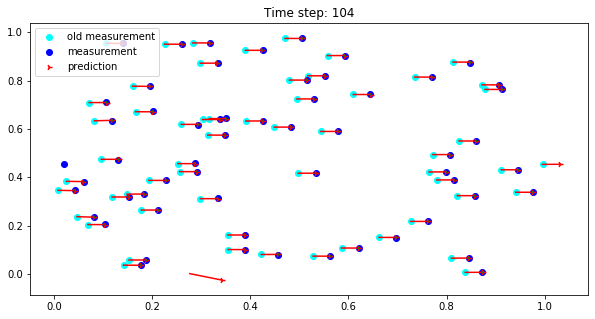

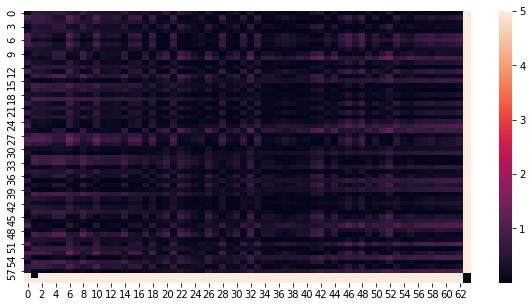

Time step: 105
dist 0.008758353319998857
B
D


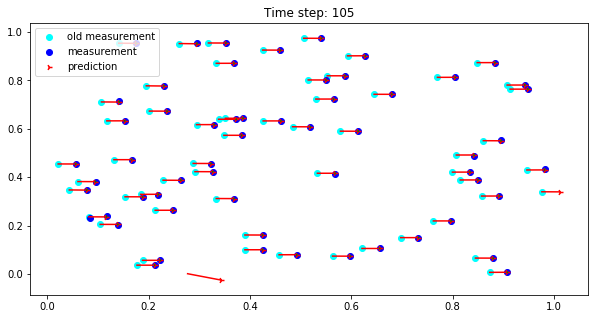

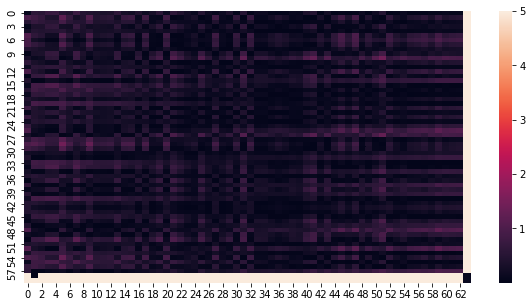

Time step: 106
dist 0.014191307977729606
B
D


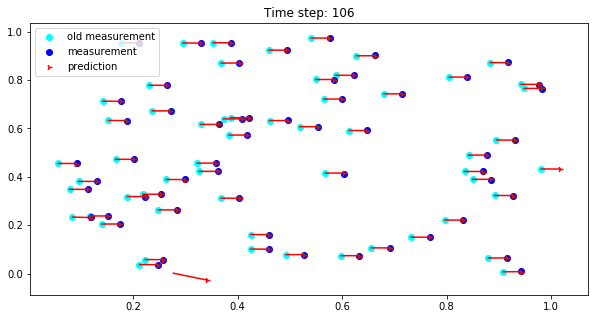

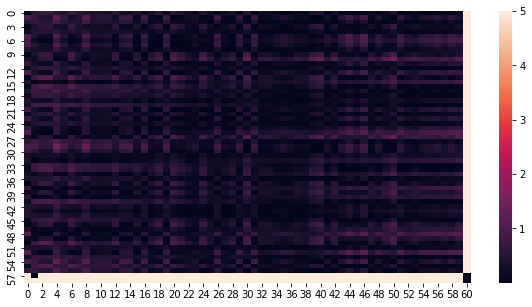

Time step: 107
dist 0.015895117253600155
dist 0.01009799917207288
B
B
D
D


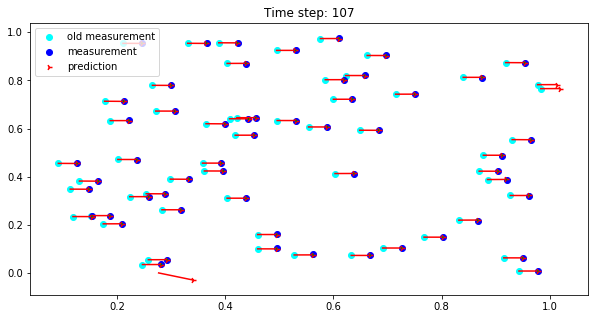

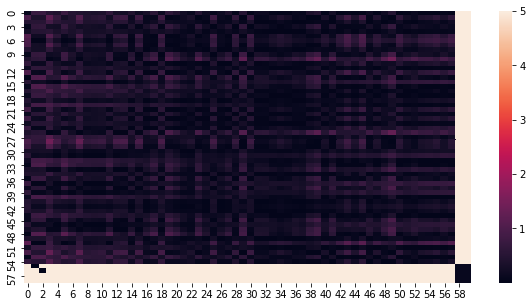

Time step: 108
dist 0.010316782616604625
dist 0.001979070155346818
B
B
D
D


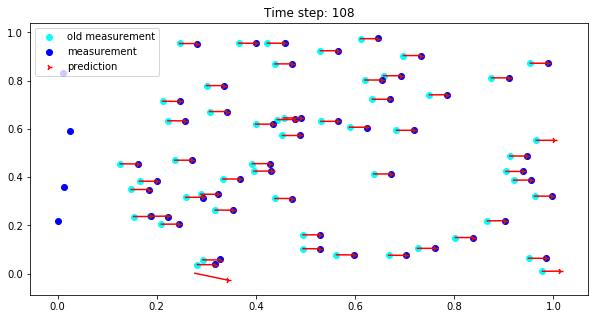

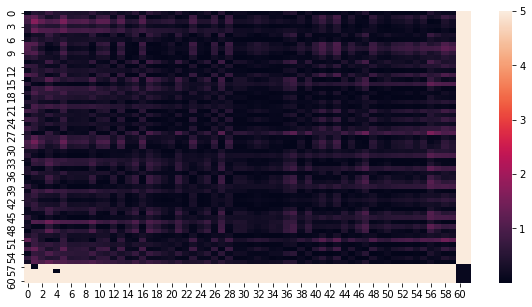

Time step: 109
dist 0.029571812840312406
dist 0.02117698833931647
dist 0.017335609068965363
B
B
B
D
D
D


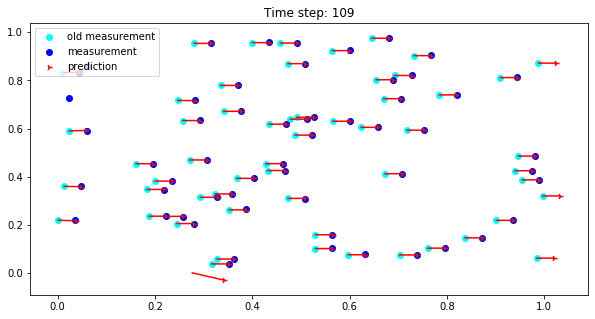

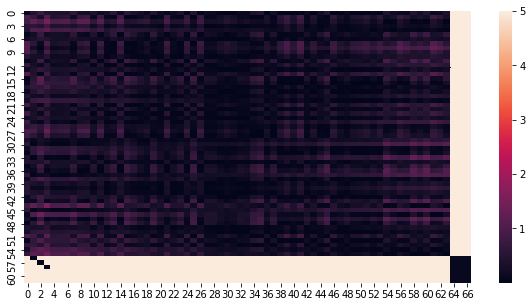

Time step: 110
dist 0.014899633577819538
dist 0.007012236692020668
dist 0.022664474796275202
B
B
B
D
D
D


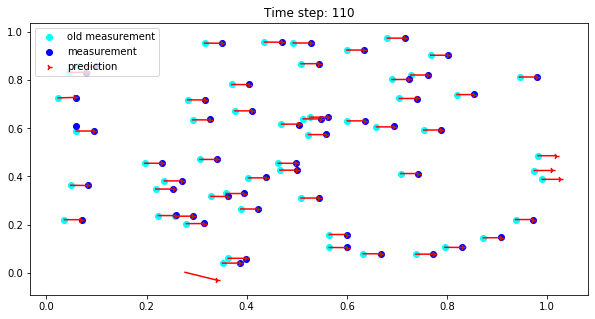

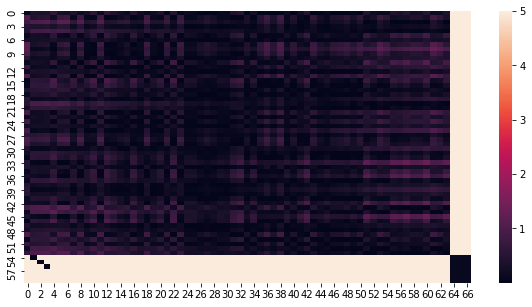

Time step: 111
dist 0.01246749641707523
dist 0.004209623789600103
B
B
D
D


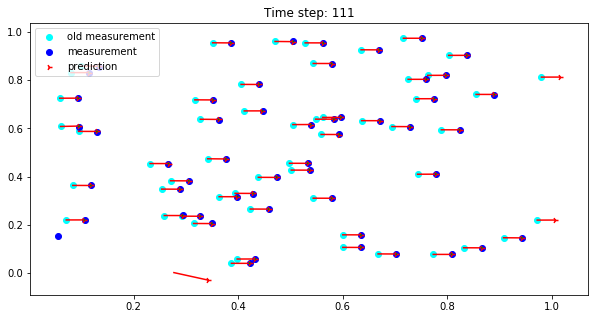

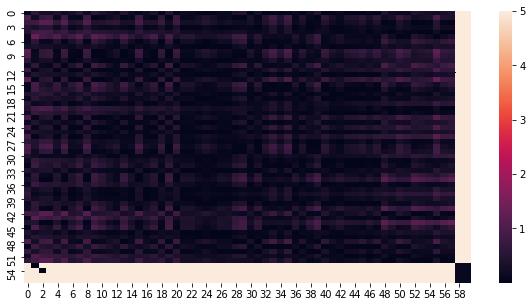

Time step: 112


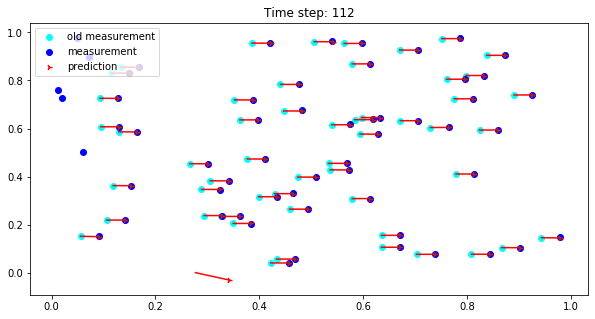

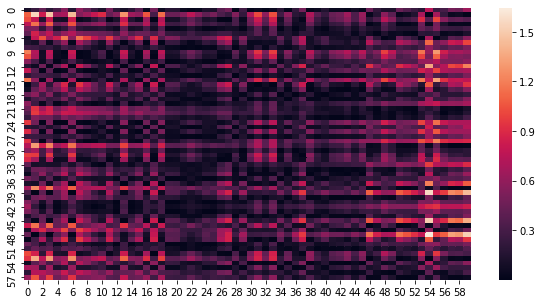

Time step: 113
dist 0.010306815495084276
B
D


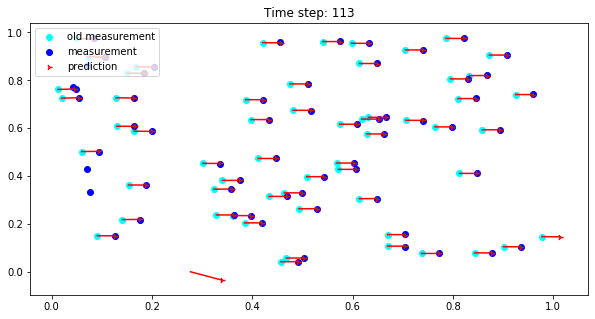

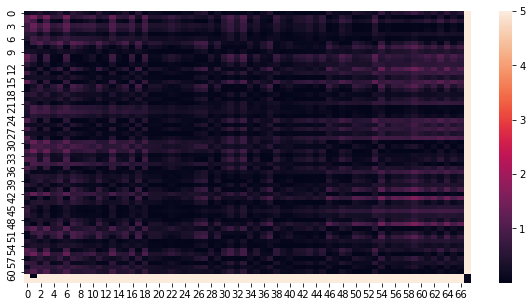

Time step: 114


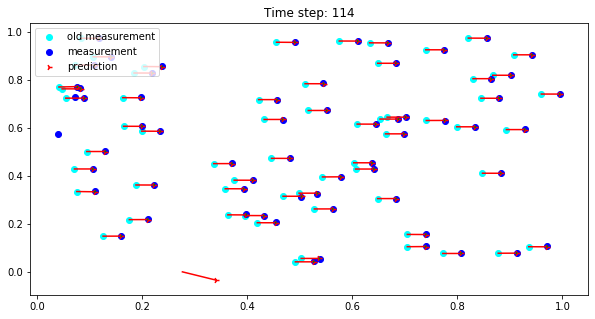

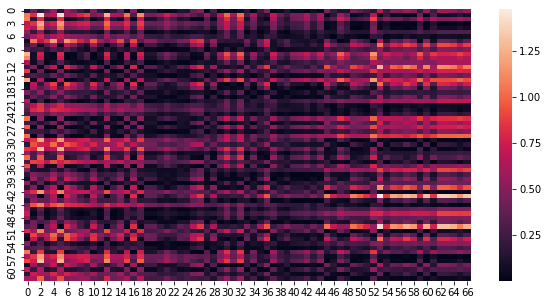

Time step: 115
dist 0.0274500781978686
dist 0.0036649207709733567
B
B
D
D


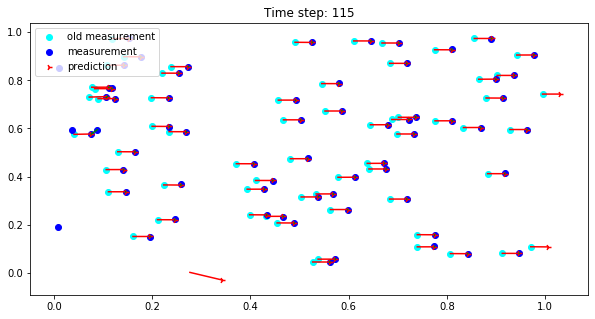

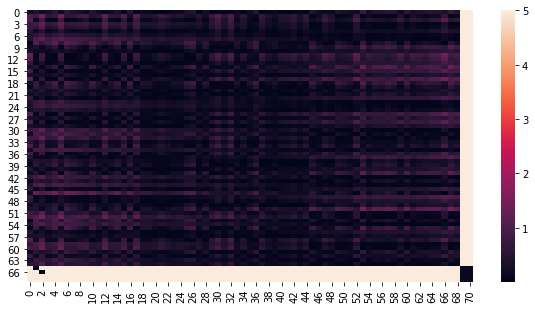

Time step: 116
dist 0.009904483098562844
B
D


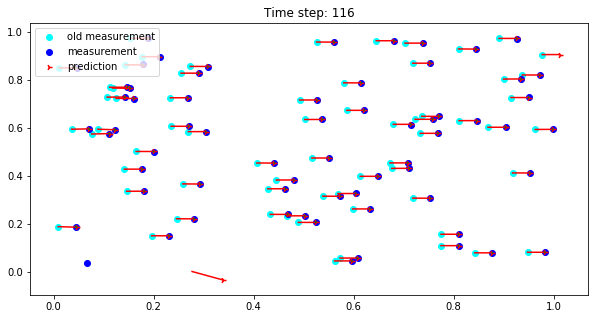

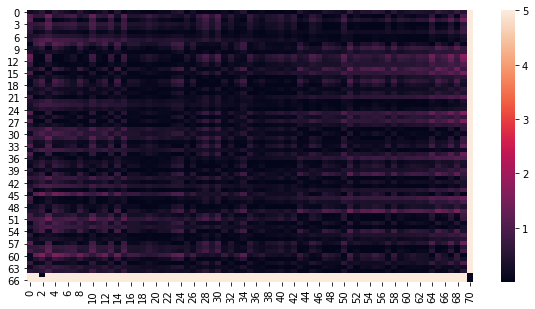

Time step: 117
dist 0.01519608738826661
dist 0.004983147633290663
dist 0.03104333147429017
B
B
B
D
D
D


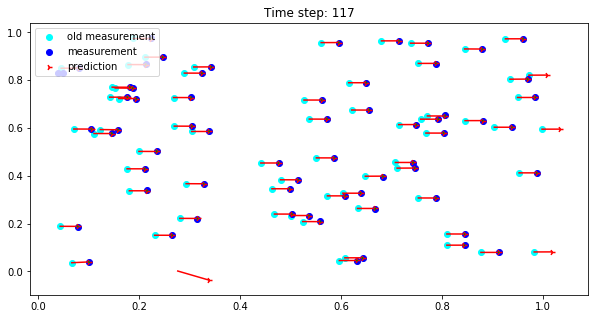

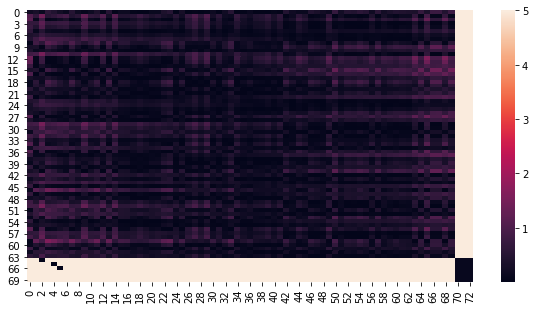

Time step: 118
dist 0.017666223087891453
dist 0.020632260577261752
dist 0.0022191157534150463
B
B
B
D
D
D


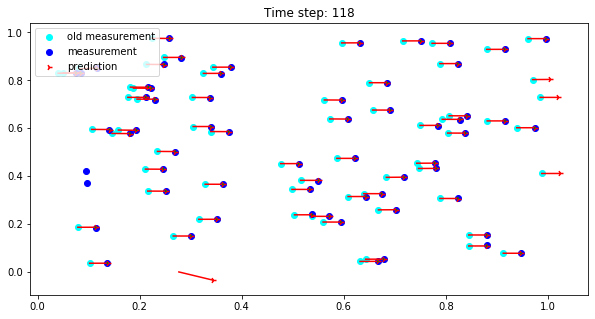

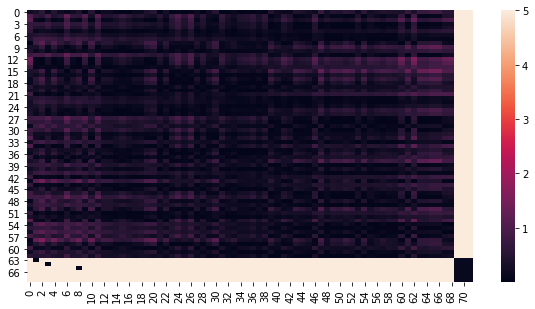

Time step: 119
dist 0.028548044912809267
dist 0.006450606884218502
B
B
D
D


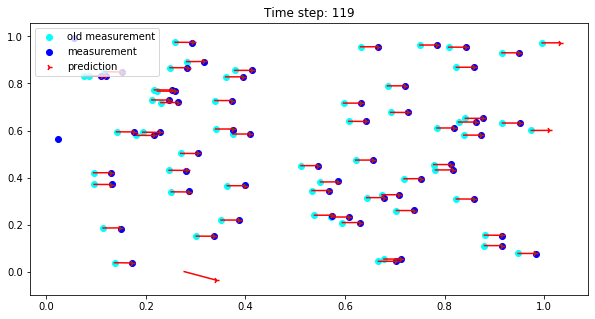

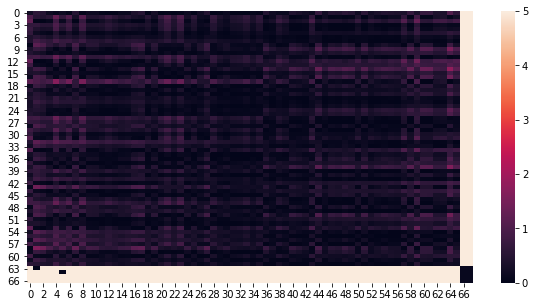

Time step: 120
dist 0.01467150850190424
B
D


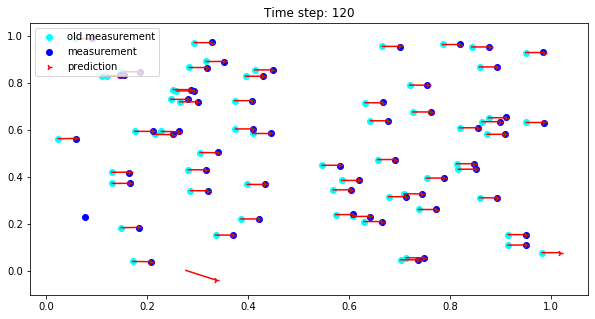

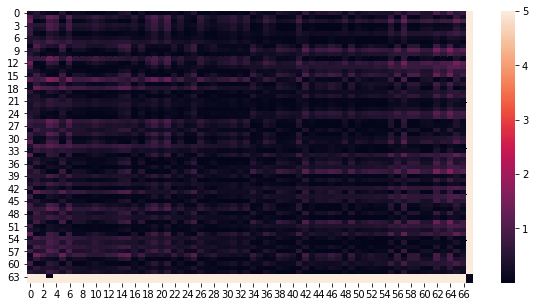

Time step: 121
dist 0.0177469735252771
dist 0.01854591265392669
B
B
D
D


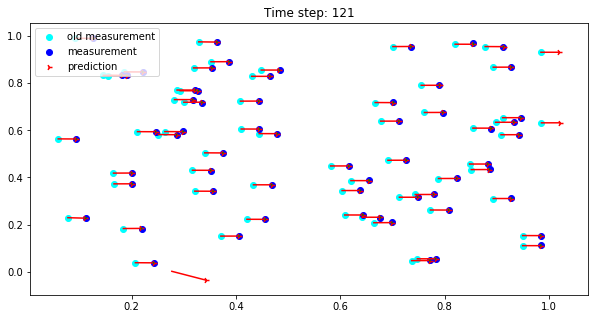

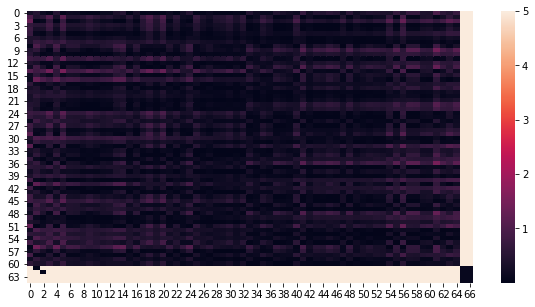

Time step: 122
dist 0.01748664906323749
dist 0.017560436577628957
B
B
D
D


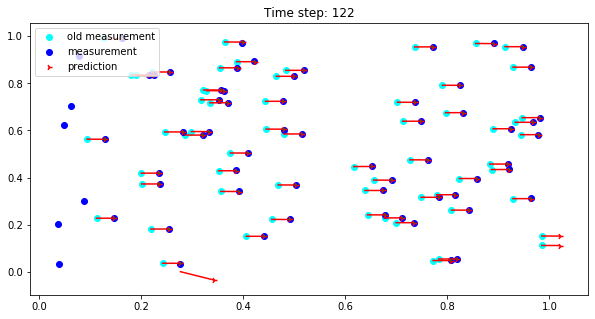

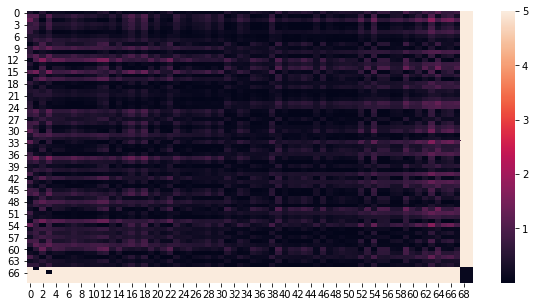

Time step: 123
dist 0.014073264914647554
dist 0.0006353098343245822
dist 0.010859320643276327
B
B
B
D
D
D


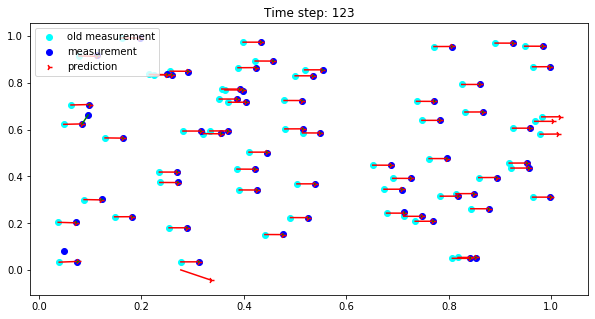

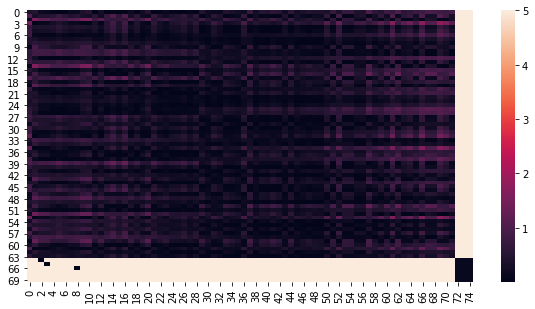

Time step: 124
dist 0.015635074733463705
dist 0.031163210074893533
dist 0.0307844822149419
B
B
B
D
D
D


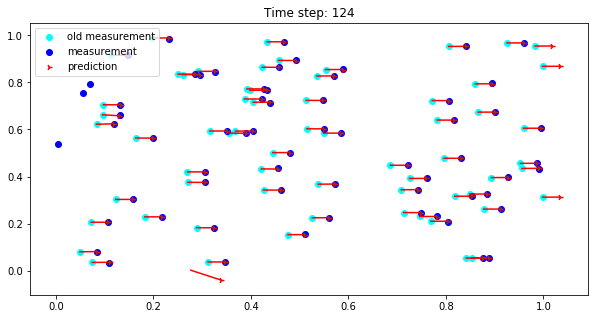

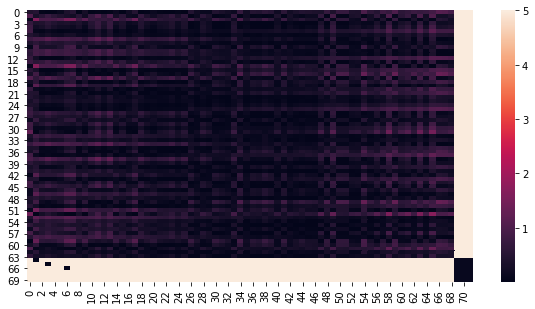

Time step: 125
dist 0.020525283510741676
dist 0.02381335688200603
dist 0.027135474725017206
B
B
B
D
D
D


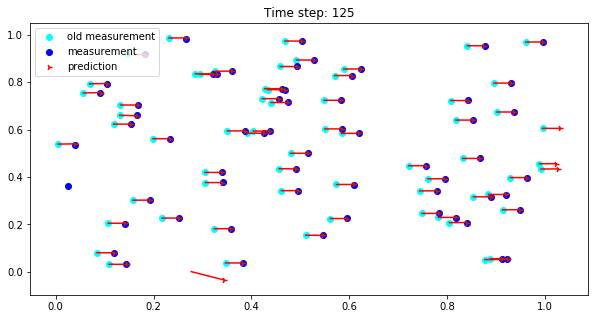

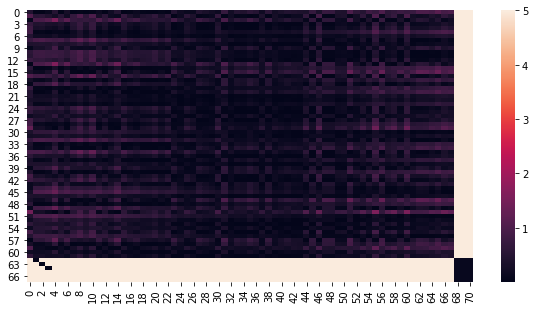

Time step: 126
dist 0.02790424931926805
B
D


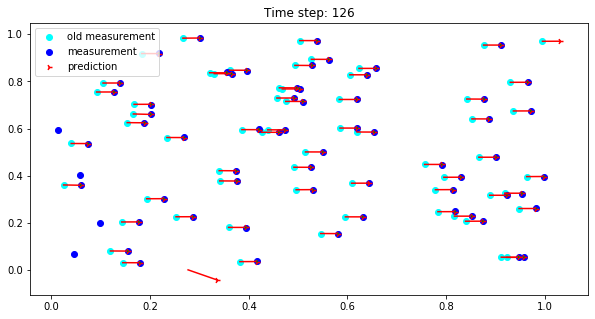

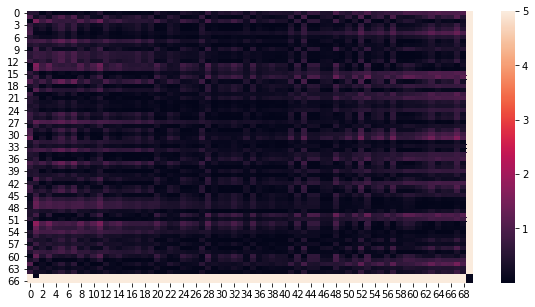

Time step: 127
dist 0.030904420986990866
dist 0.0020930234612572818
dist 0.015628389286563626
dist 0.003997888610036249
B
B
B
B
D
D
D
D


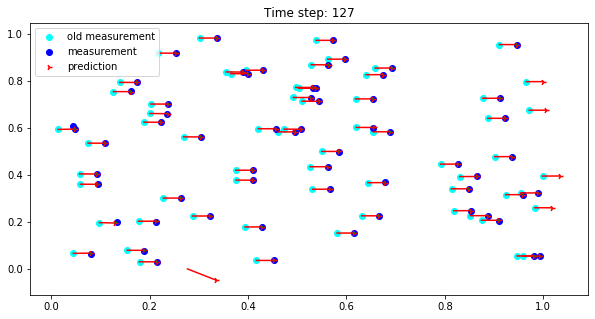

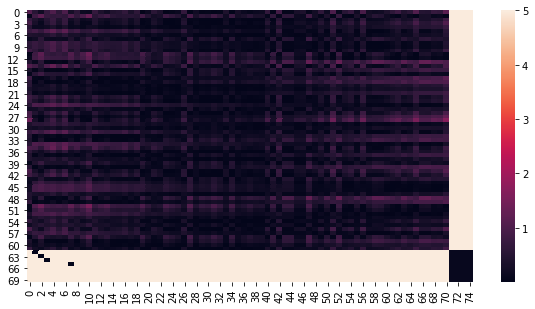

Time step: 128
dist 0.02505743483138989
dist 0.02154523269696318
dist 0.014085754725068123
B
B
B
D
D
D


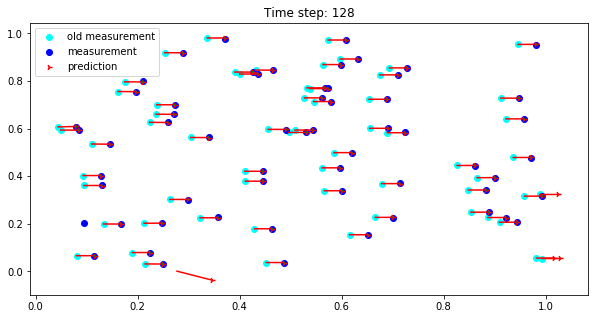

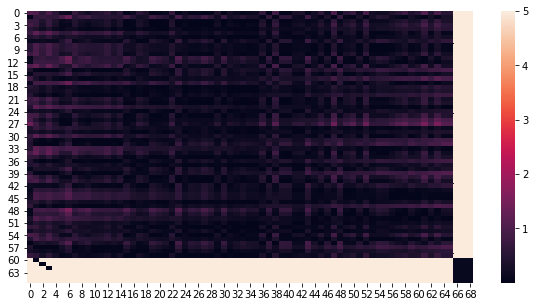

Time step: 129
dist 0.02619973905745754
dist 0.013210476091712664
dist 0.003976370713294708
B
B
B
D
D
D


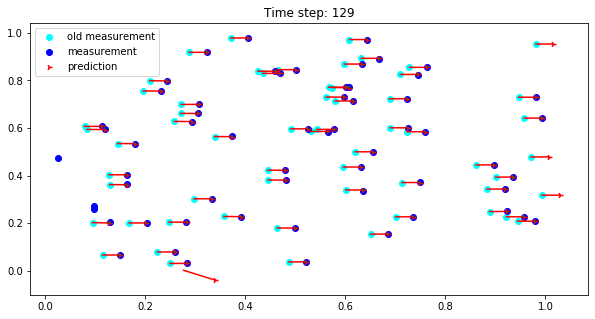

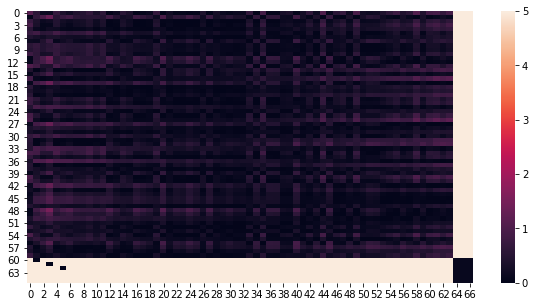

Time step: 130
dist 0.014618999097382845
dist 0.012127878605967535
dist 0.025066580462141275
B
B
B
D
D
D


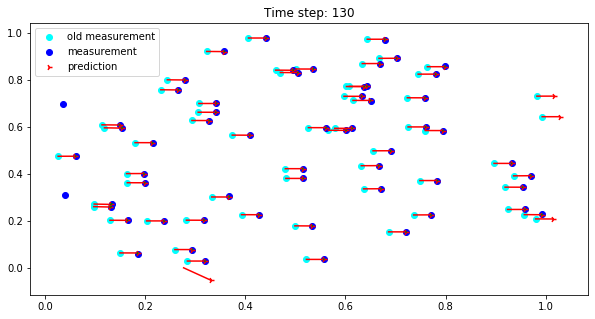

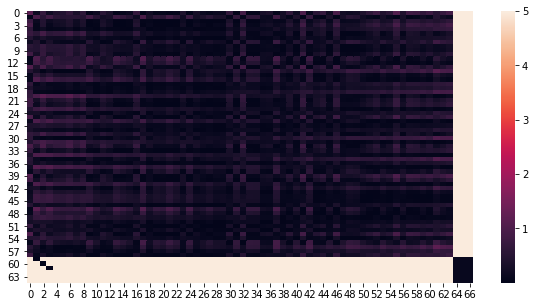

Time step: 131
dist 0.0029639591165624424
dist 0.02476954289733113
B
B
D
D


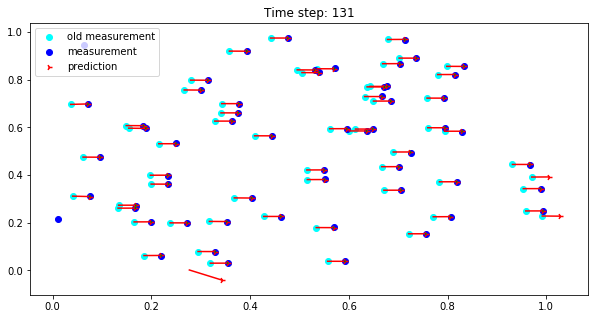

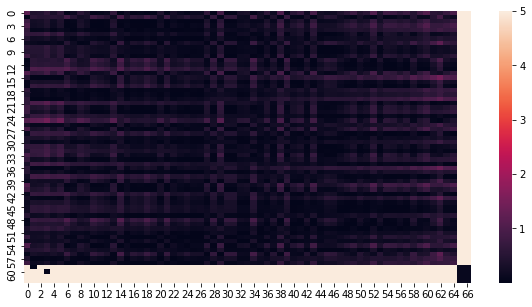

Time step: 132
dist 0.020981051946816986
dist 0.0009637655136376377
dist 0.025976354283040015
B
B
B
D
D
D


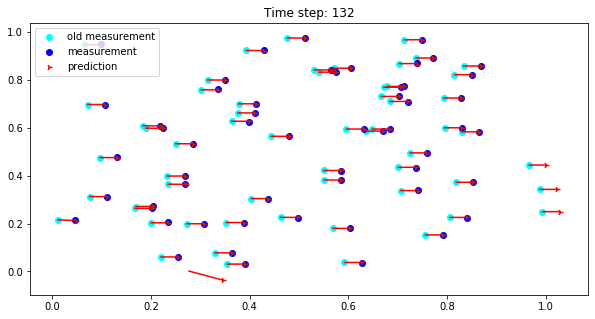

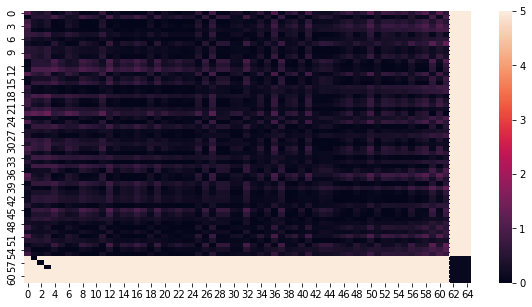

Time step: 133


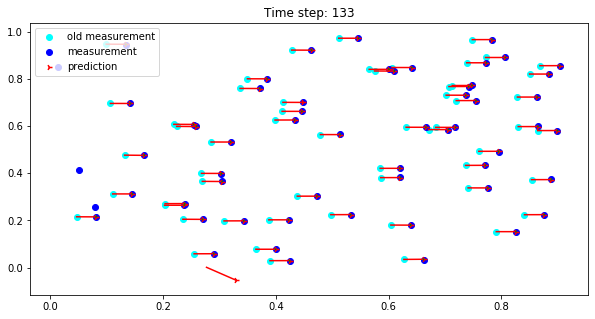

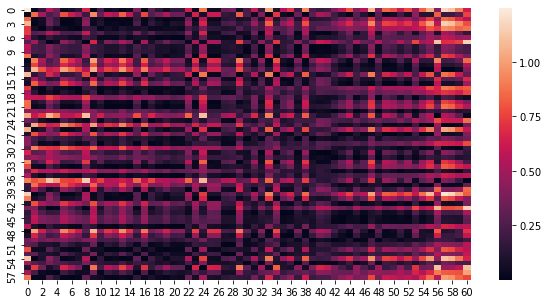

Time step: 134


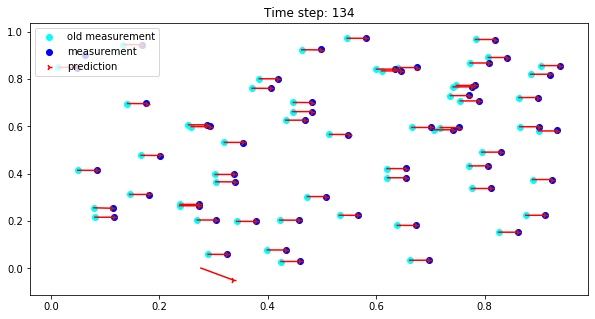

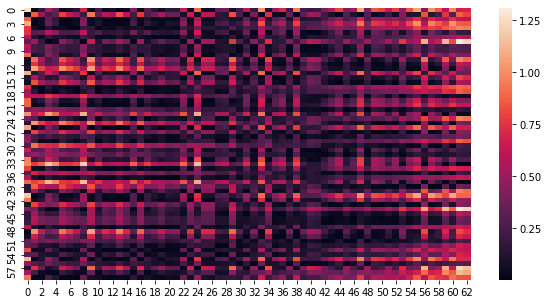

Time step: 135


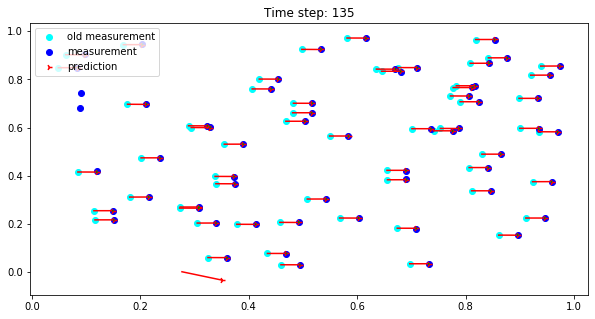

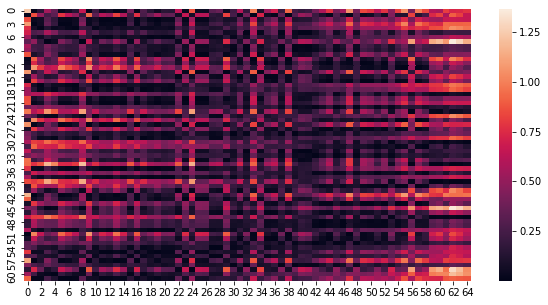

Time step: 136
dist 0.00605655629366586
dist 0.0019970918191649645
B
B
D
D


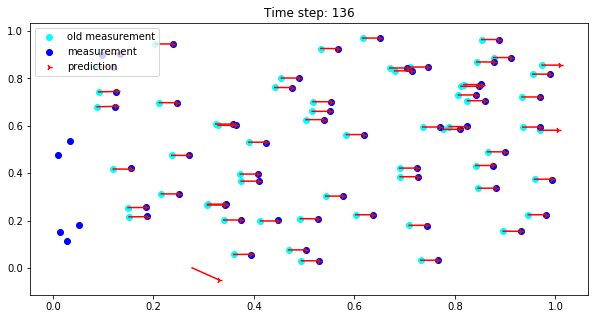

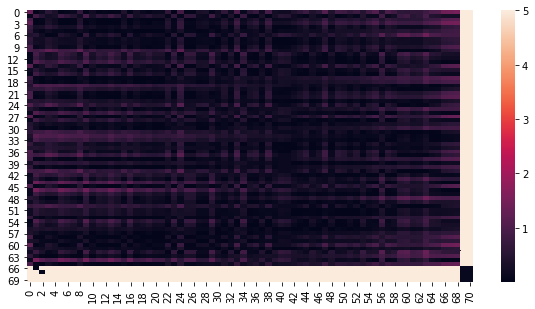

Time step: 137
dist 0.013432263572108694
dist 0.025780872694253665
dist 0.022737454940007673
dist 0.001156671209229021
dist 0.0024575077047852556
B
B
B
B
B
D
D
D
D
D


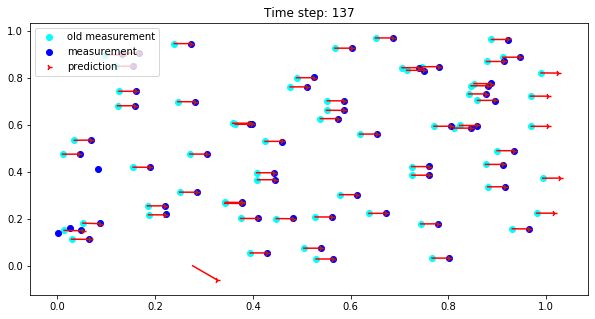

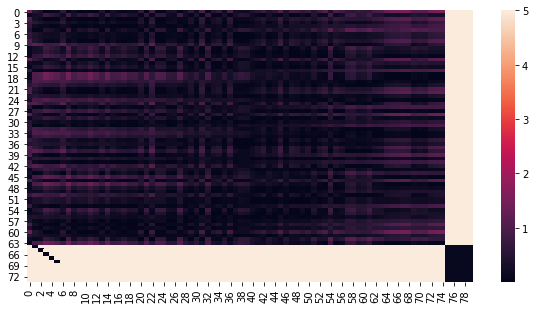

Time step: 138
dist 0.0015478298604763019
B
D


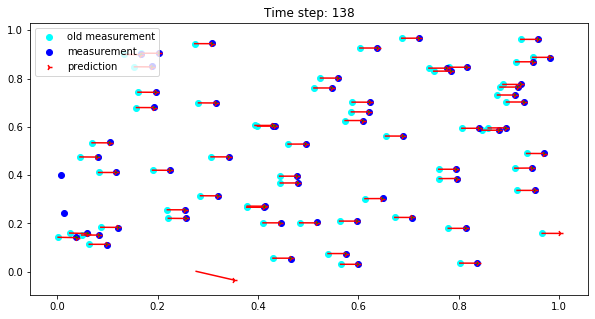

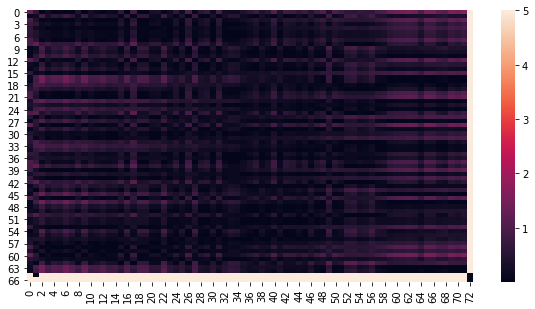

Time step: 139
dist 0.0026864270887696495
dist 0.014293768019320252
B
B
D
D


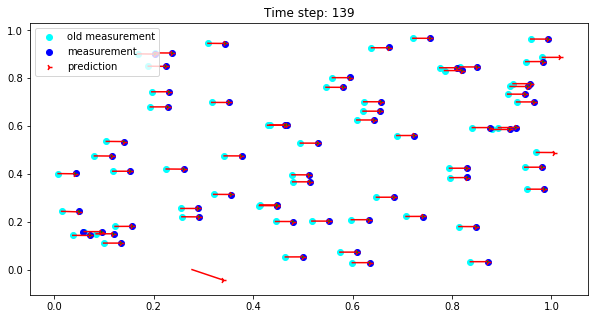

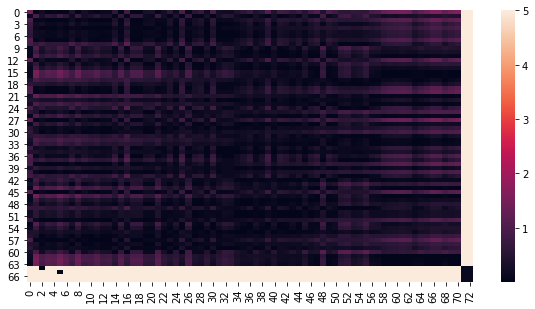

Time step: 140
dist 0.025891130364637194
dist 0.0024191699705724545
dist 0.018784741660580417
dist 0.01577816326014836
dist 0.014320193603682085
B
B
B
B
B
D
D
D
D
D


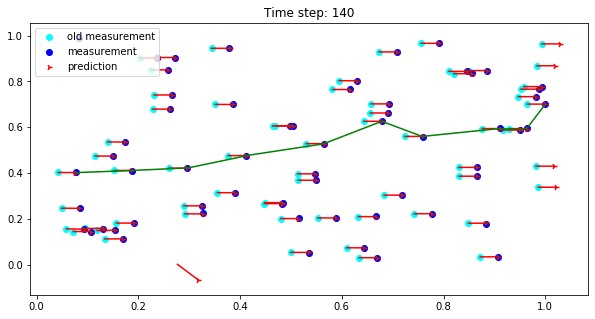

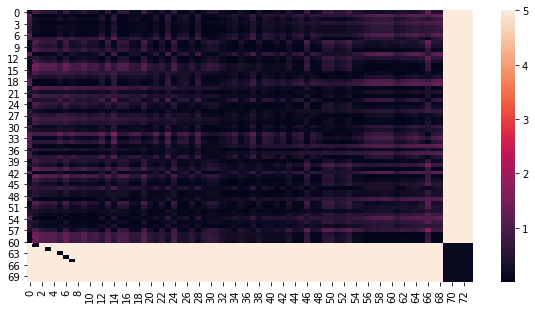

Time step: 141
dist 0.025460053616436884
dist 0.01963305158491413
dist 0.021004768851458522
dist 0.014546430076027184
B
B
B
B
D
D
D
D


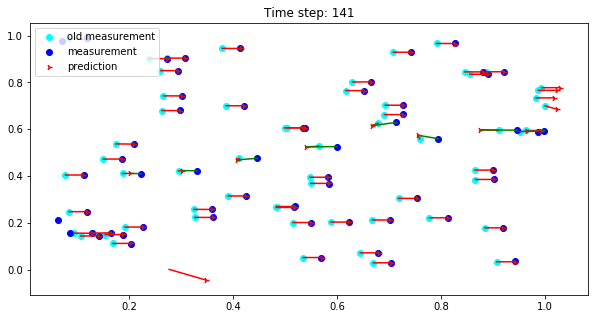

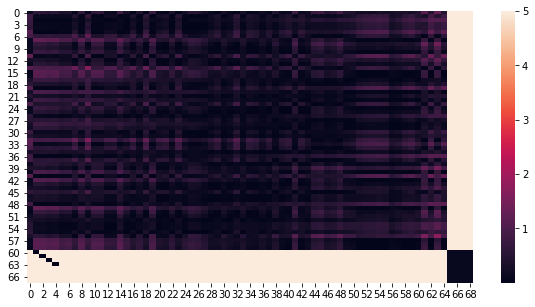

Time step: 142
dist 0.004981624769133219
dist 0.026818796886718177
B
B
D
D


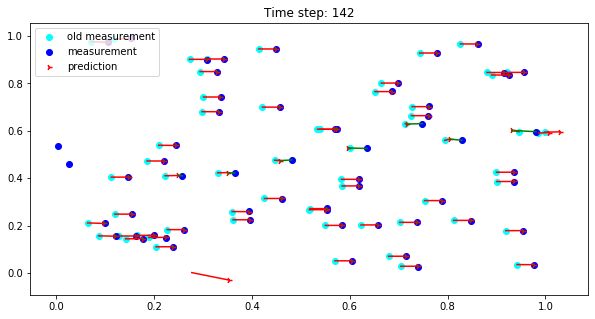

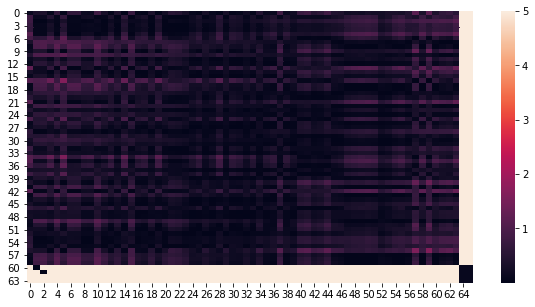

Time step: 143
dist 0.00917690043104935
B
D


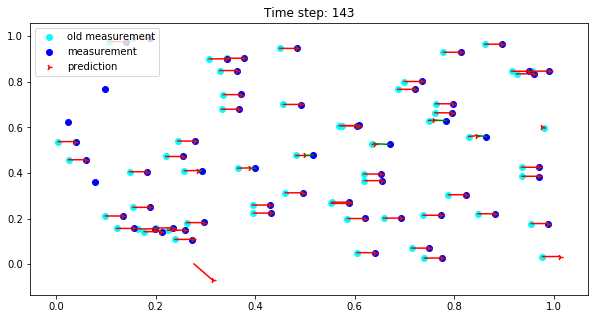

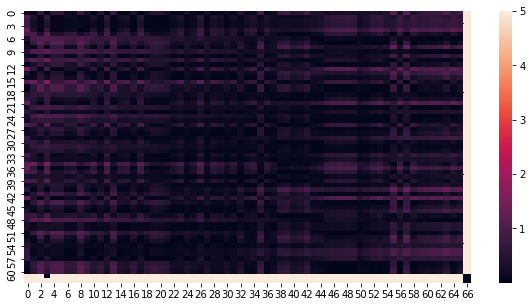

Time step: 144
dist 0.021300380969414112
dist 0.023742903961587514
dist 0.0025041260766605067
dist 0.003301507523876035
dist 0.000671625906546236
B
B
B
B
B
D
D
D
D
D


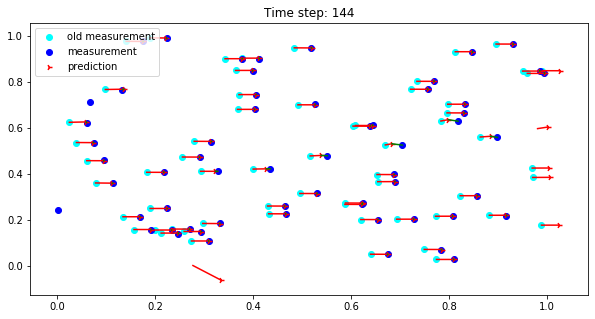

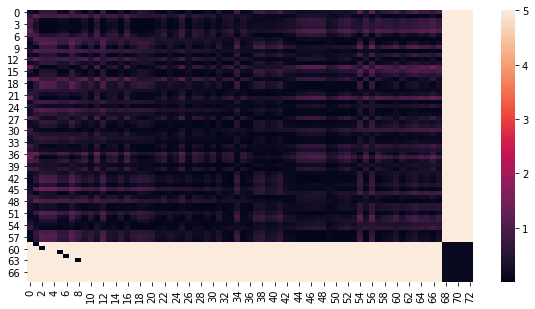

Time step: 145
dist 0.018071639241391324
dist 0.027719527554374013
B
B
D
D


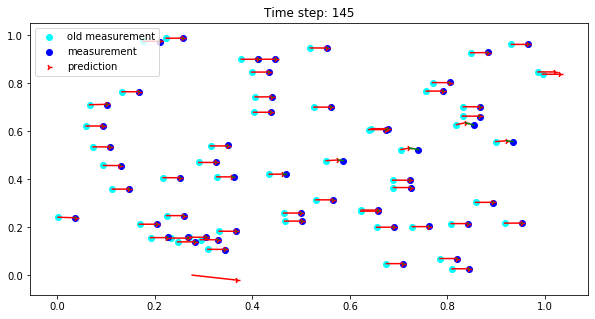

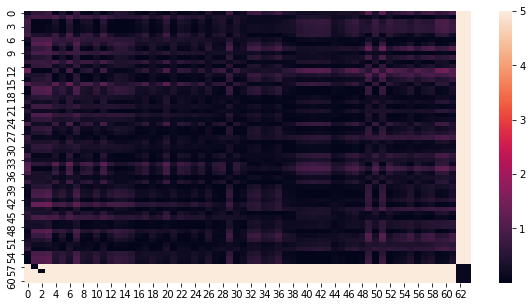

Time step: 146
dist 0.001251449346814093
B
D


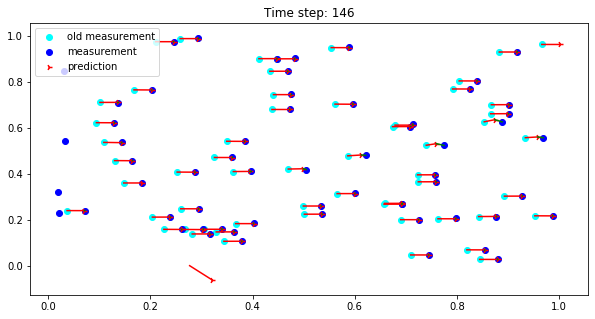

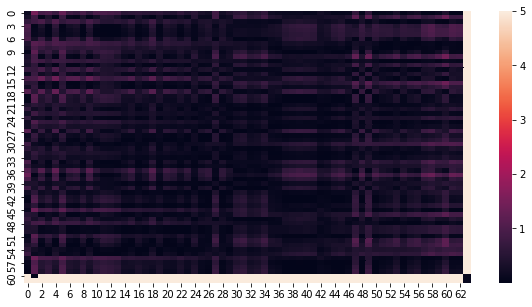

Time step: 147
dist 0.020281135038722864
B
D


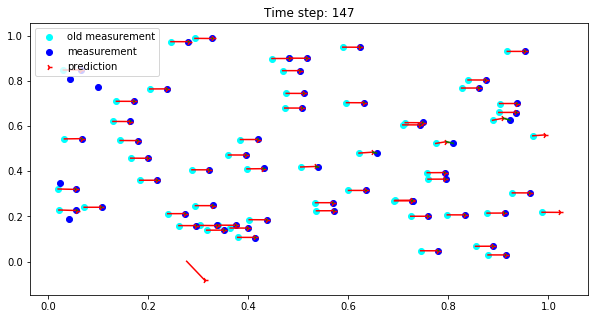

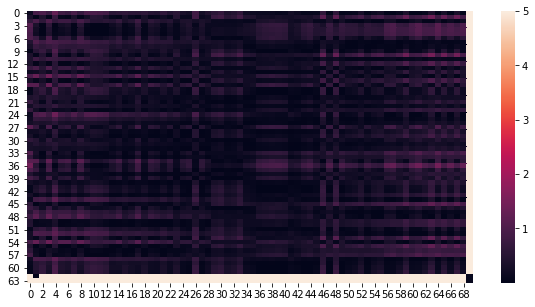

Time step: 148
dist 0.010283237568160963
B
D


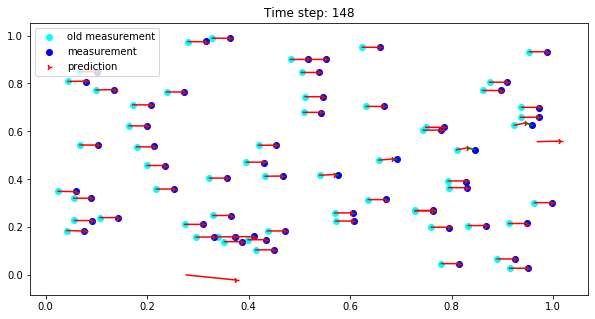

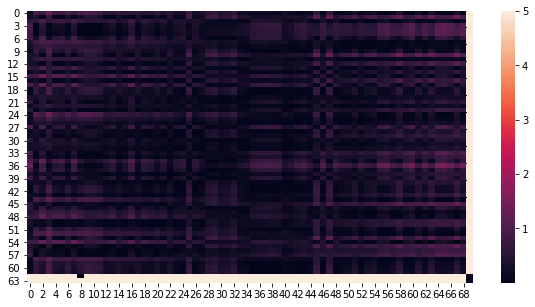

Time step: 149
dist 0.004896632487602304
dist 0.020073317091271692
dist 0.03062369911781726
dist 0.003453485826047098
B
B
B
B
D
D
D
D


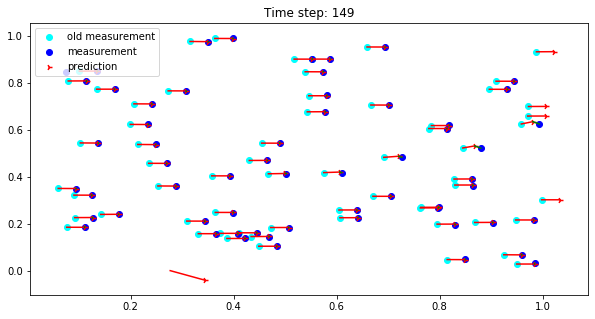

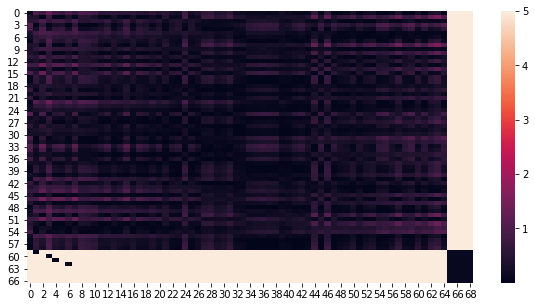

Time step: 150
dist 0.01713501170620524
dist 0.014931361449099123
dist 0.013932939533455535
B
B
B
D
D
D


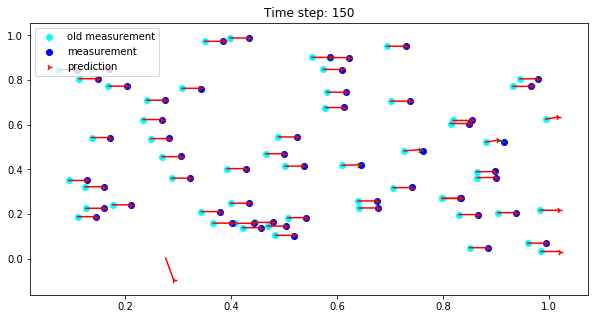

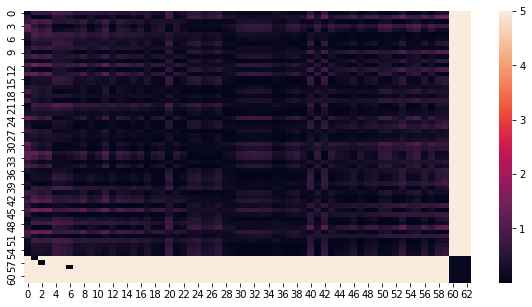

Time step: 151
dist 0.026804429631777538
dist 0.011843323146038198
dist 0.0009938524877193267
B
B
B
D
D
D


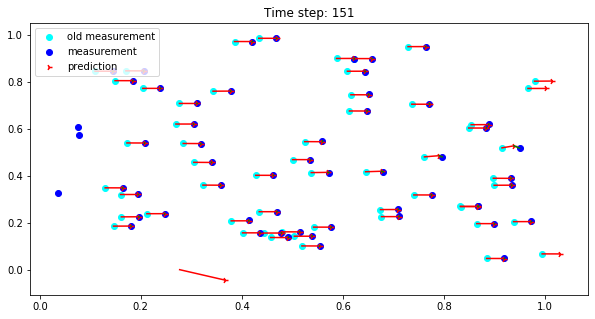

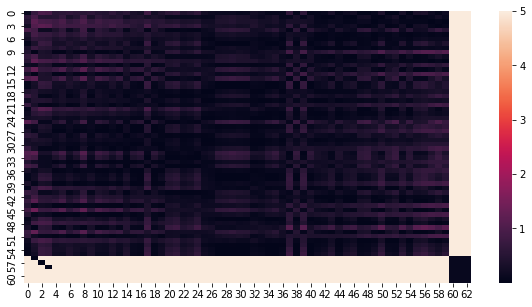

Time step: 152
dist 0.005509352335817841
B
D


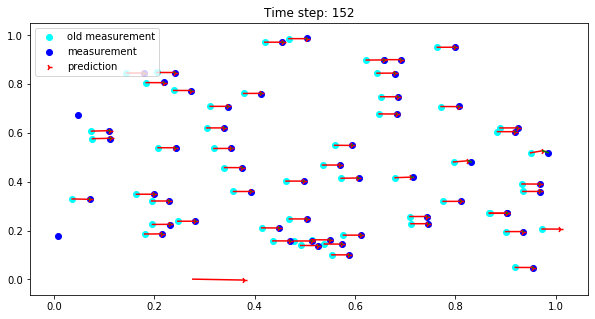

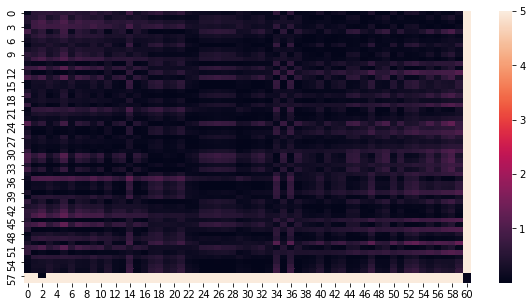

Time step: 153
dist 0.002068319360163162
dist 0.0005941017443862329
dist 0.007102021000626291
B
B
B
D
D
D


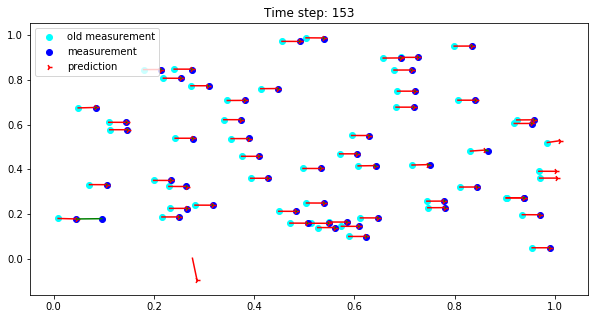

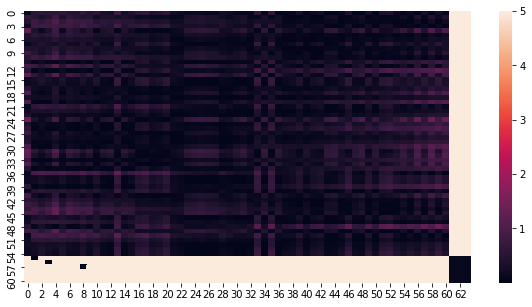

Time step: 154
dist 0.021946832380862924
dist 0.0026037242984562337
B
B
D
D


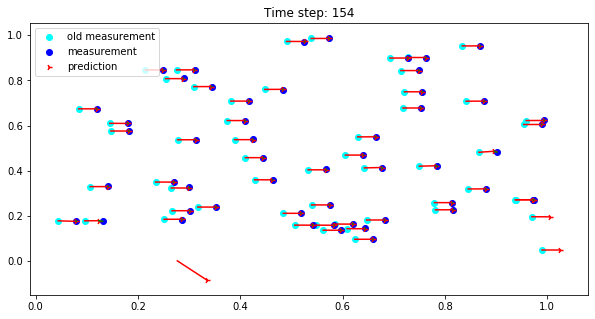

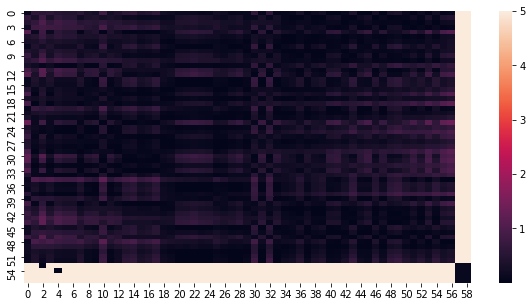

Time step: 155
dist 0.02649767366029465
dist 0.021626802557703106
dist 0.005017318828533179
dist 0.0057564618418217695
B
B
B
B
D
D
D
D


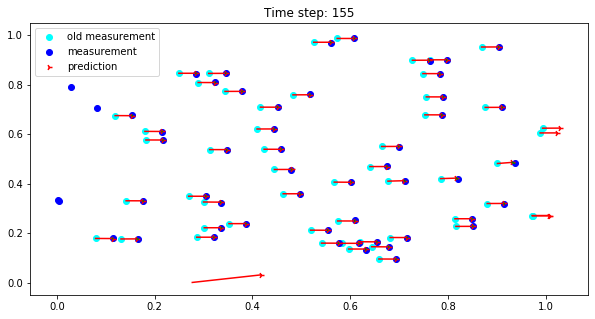

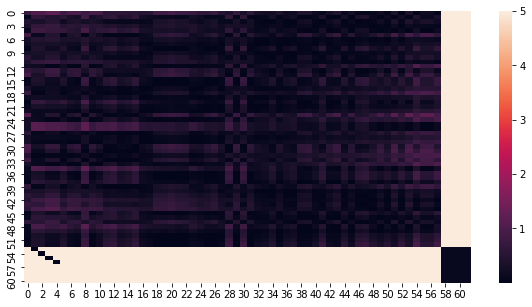

Time step: 156


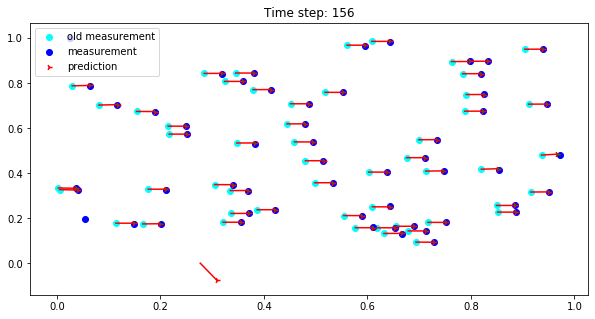

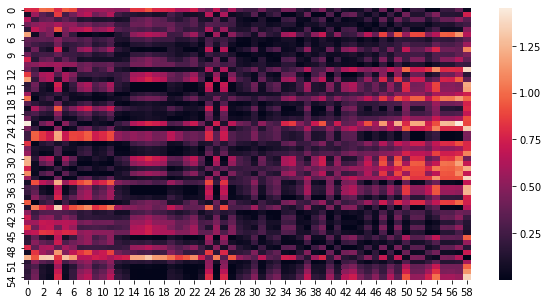

Time step: 157
dist 0.0003185451193810085
B
D


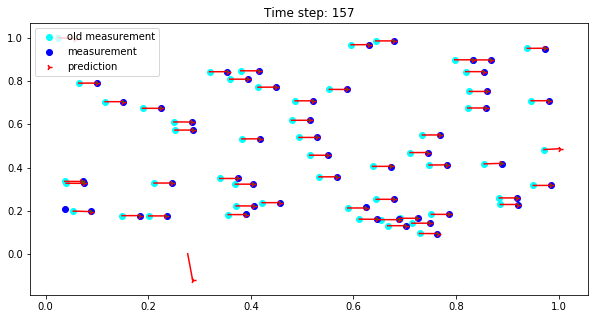

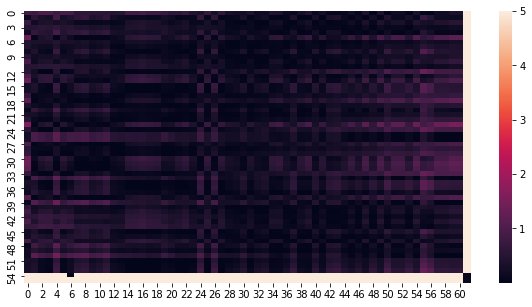

Time step: 158
dist 0.014102470523787991
dist 0.018099976950042063
dist 0.006231832711664831
B
B
B
D
D
D


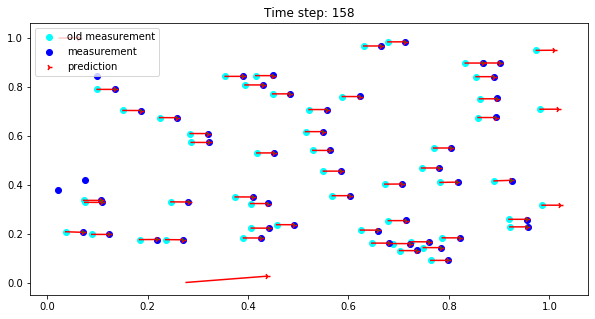

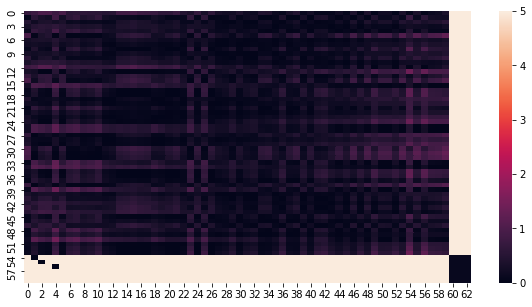

Time step: 159


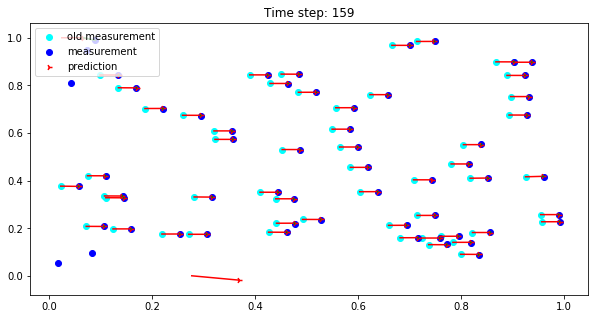

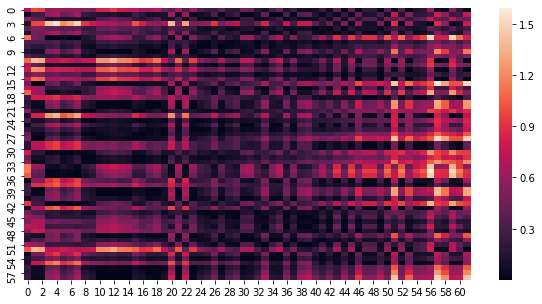

Time step: 160
dist 0.023984985637779843
dist 0.022120577036516043
B
B
D
D


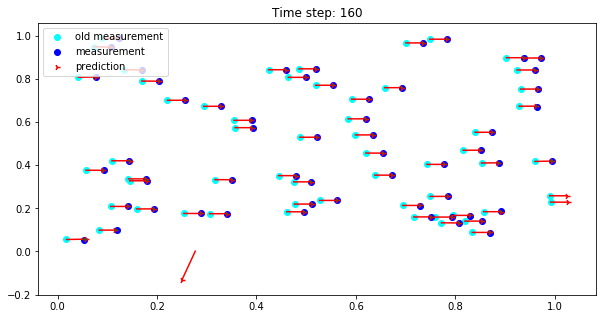

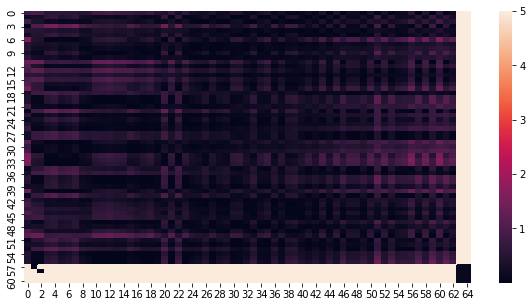

Time step: 161
dist 0.00491988290564116
dist 0.0016778261525414173
dist 0.025759019334406386
B
B
B
D
D
D


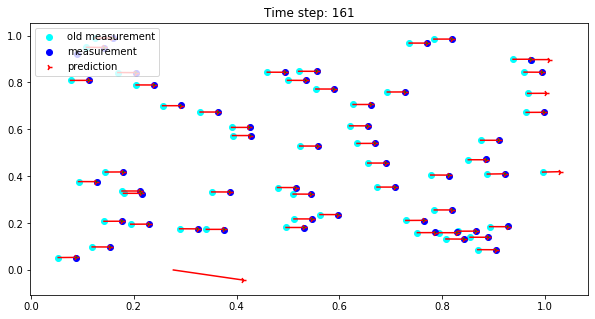

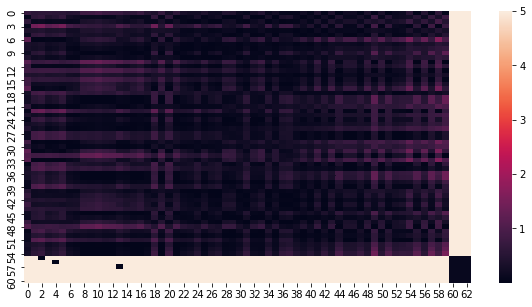

Time step: 162
dist 0.0267111765295025
dist 0.030527334602128864
dist 0.004573084865412191
B
B
B
D
D
D


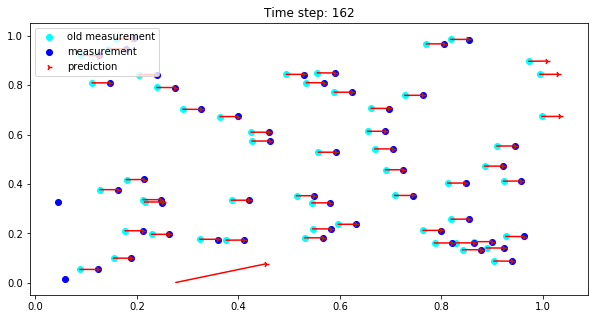

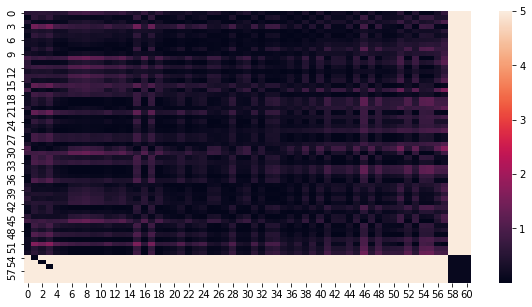

Time step: 163


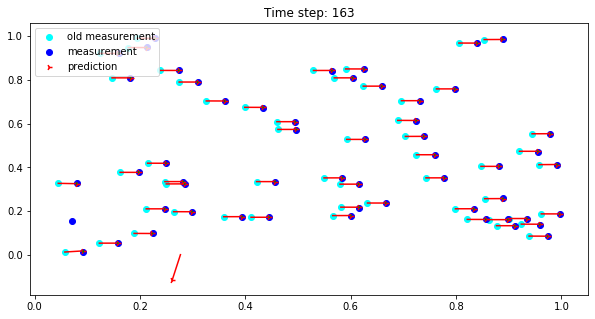

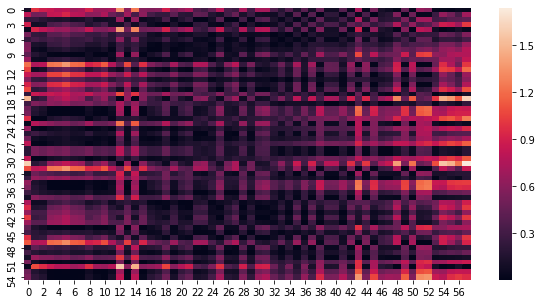

Time step: 164
dist 0.011936748785349005
dist 0.029364328349924307
dist 0.006273450522687352
dist 0.024246238845388124
B
B
B
B
D
D
D
D


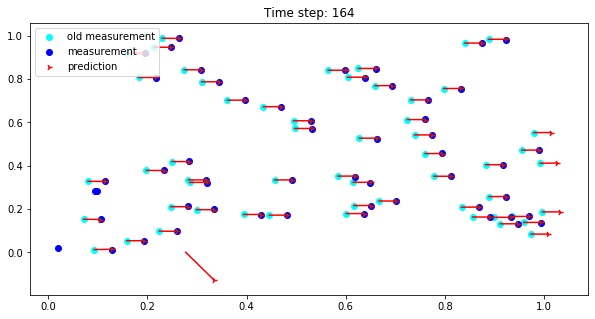

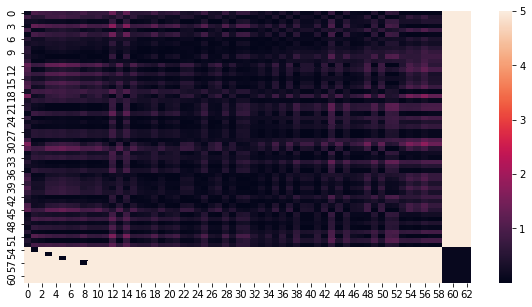

Time step: 165
dist 0.022983103809652183
dist 0.026280601523417157
dist 0.002555687104408122
B
B
B
D
D
D


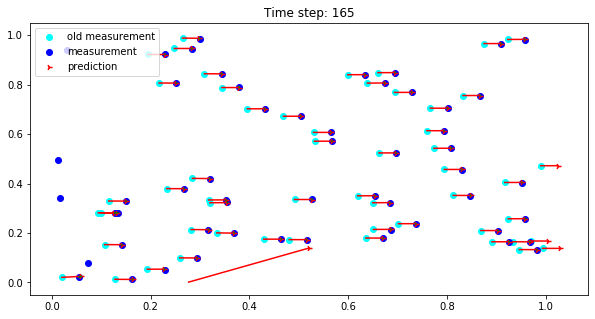

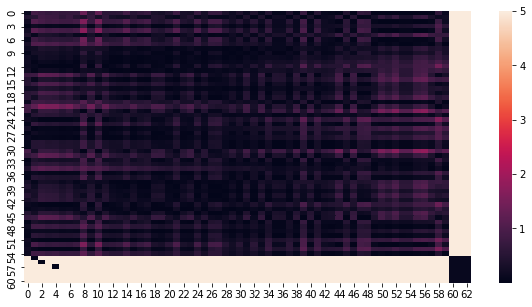

Time step: 166
dist 0.014170128836773932
dist 0.0008821423123461791
B
B
D
D


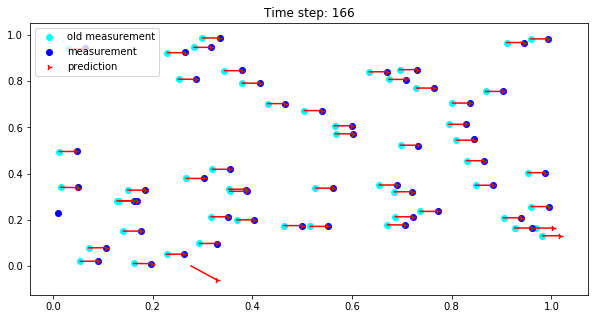

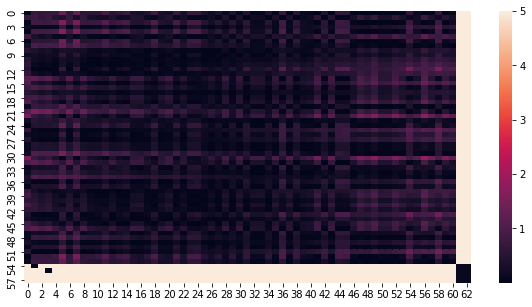

Time step: 167
dist 0.026831763380118723
dist 0.02013987351844171
dist 0.025573162825180074
B
B
B
D
D
D


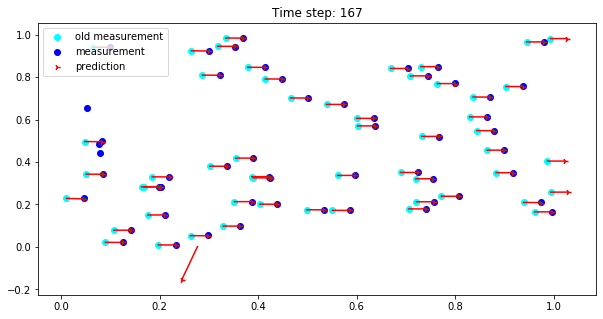

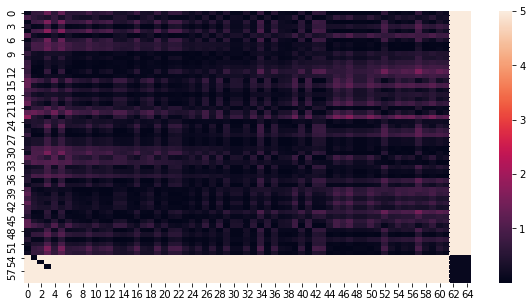

Time step: 168
dist 0.028943215449710014
dist 0.012786561133122598
dist 0.006576561276512738
B
B
B
D
D
D


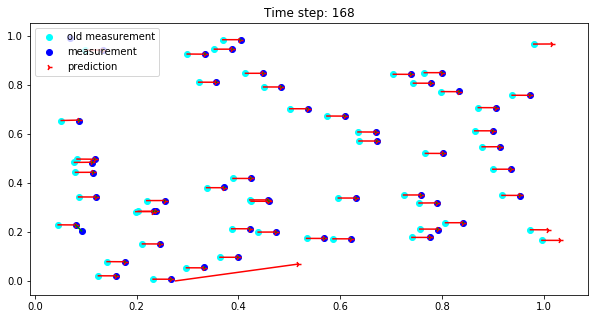

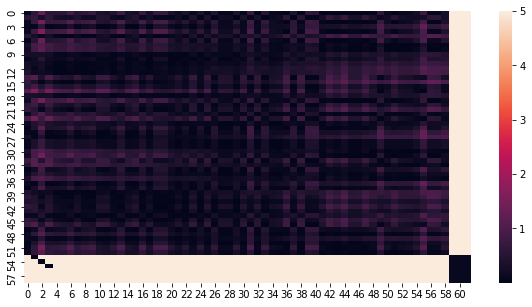

Time step: 169
dist 0.005419237990097248
B
D


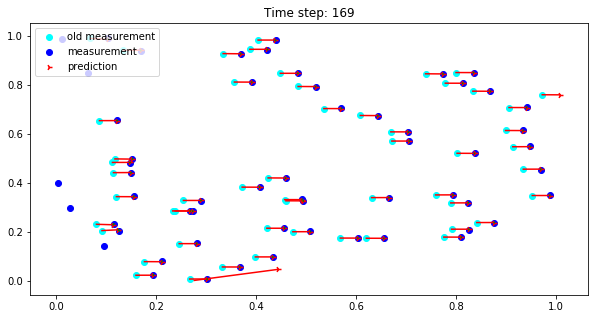

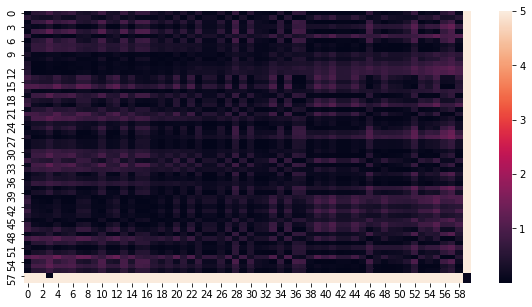

Time step: 170
dist 0.0024282861952271695
dist 0.020844436718755244
B
B
D
D


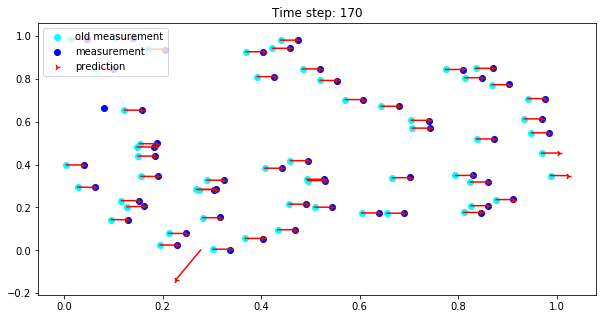

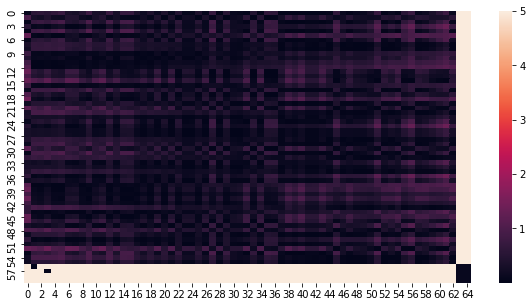

Time step: 171
dist 0.016455961643840444
dist 0.0020488936923865886
dist 0.008992568995619843
B
B
B
D
D
D


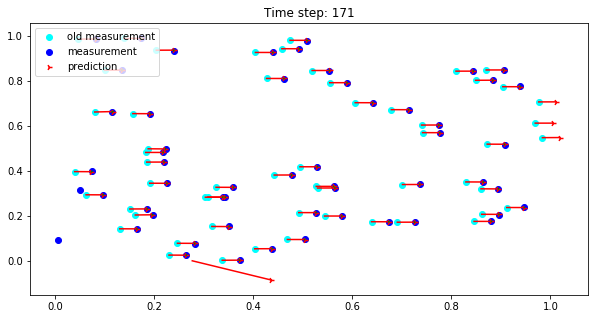

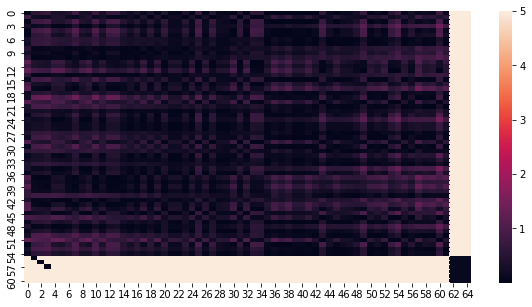

Time step: 172


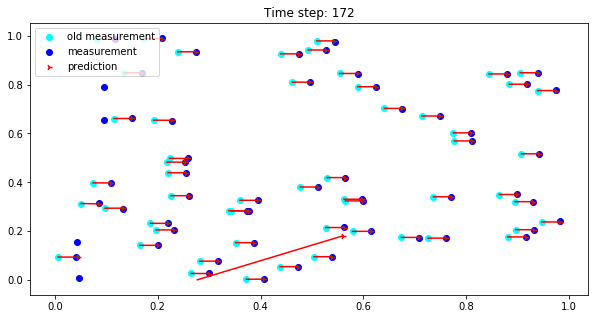

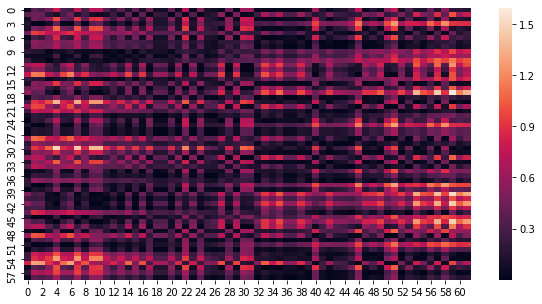

Time step: 173
dist 0.014796489355562326
dist 0.006454858003444253
B
B
D
D


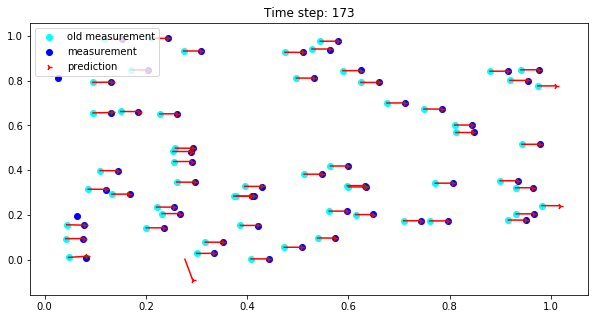

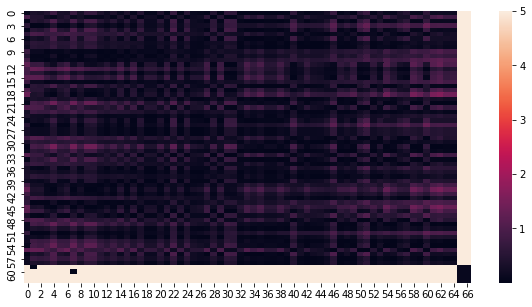

Time step: 174
dist 0.0011474514554257187
dist 0.0102634791345797
dist 0.007959576265513135
dist 0.002497534003339741
B
B
B
B
D
D
D
D


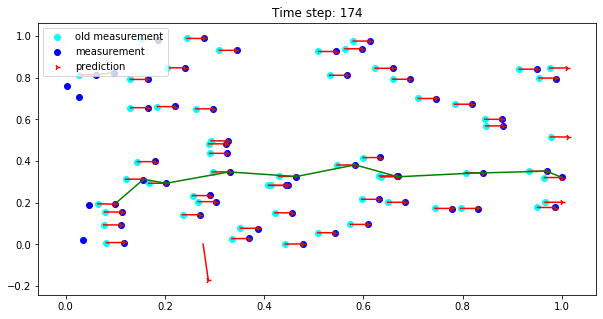

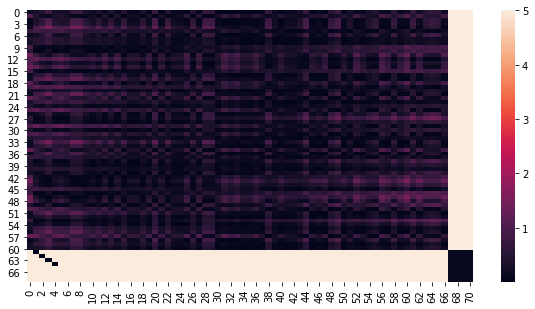

Time step: 175
dist 0.018709971086480648
dist 0.014431589372556619
dist 0.021429133475959317
B
B
B
D
D
D


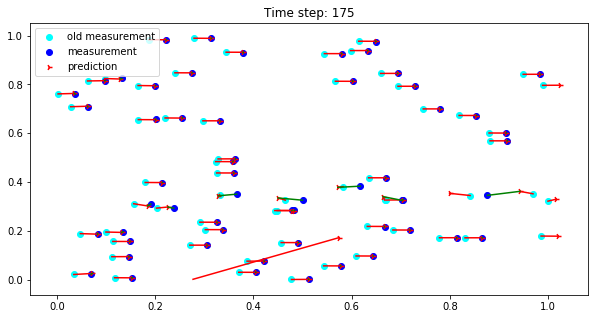

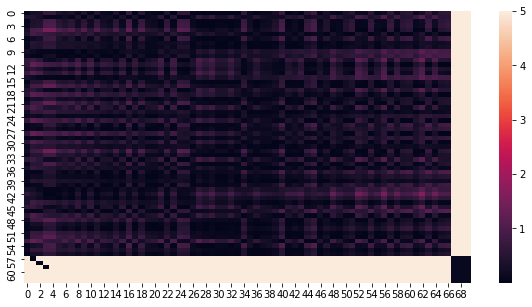

Time step: 176
dist 0.016976612276581537
B
D


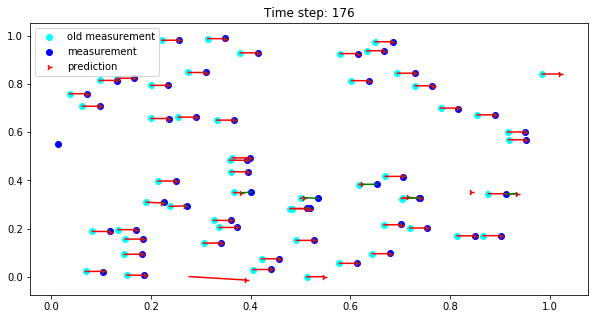

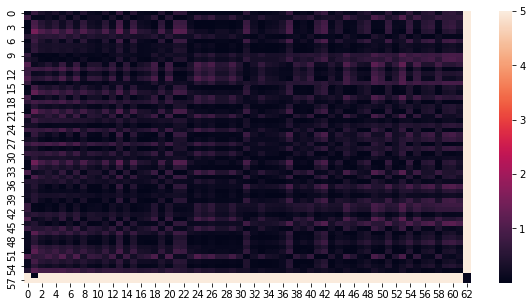

Time step: 177


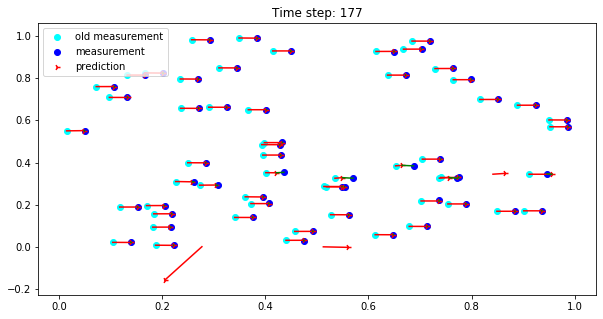

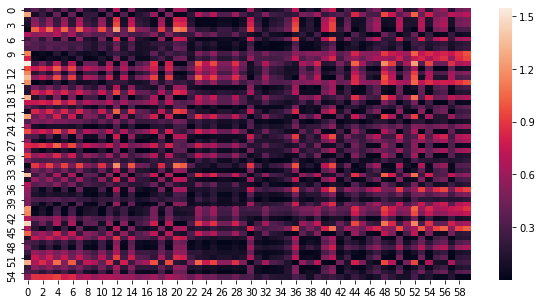

Time step: 178
dist 0.019557172467194572
dist 0.01754806906051054
B
B
D
D


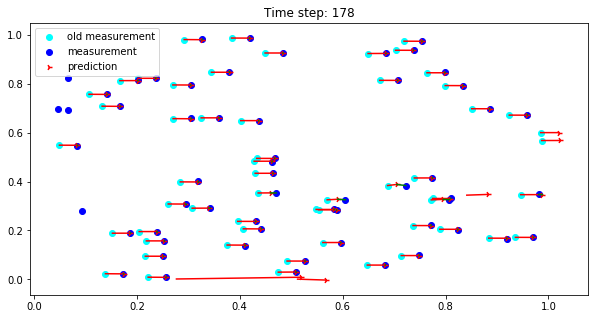

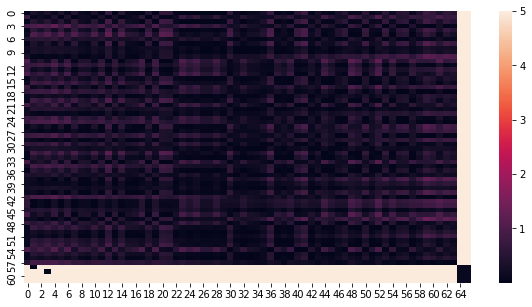

Time step: 179
dist 0.01833827114999731
dist 0.003340141004252839
B
B
D
D


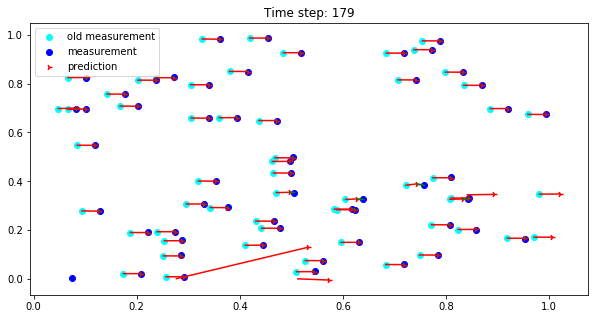

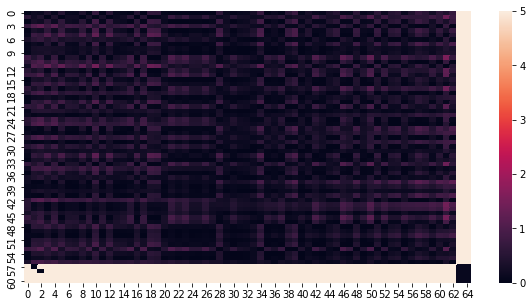

Time step: 180
dist 0.026650843119135903
B
D


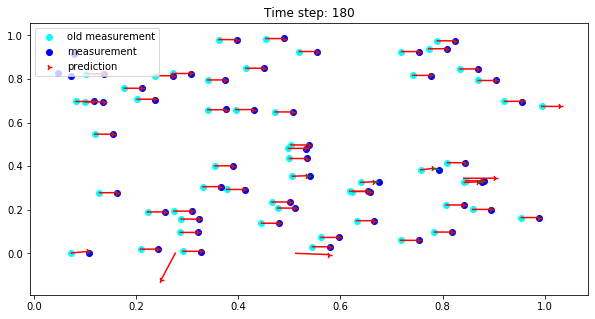

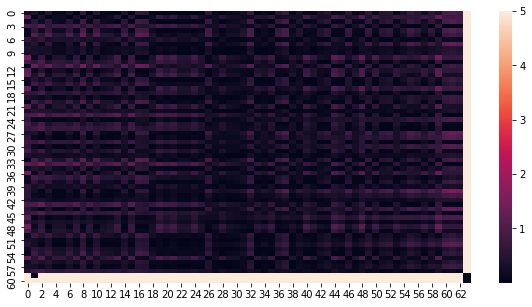

Time step: 181
dist 0.021421138306515486
B
D


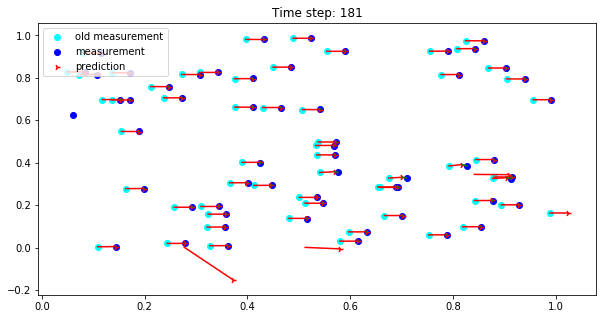

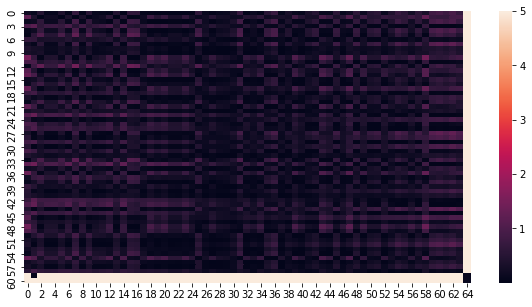

Time step: 182
dist 0.02343519103455849
B
D


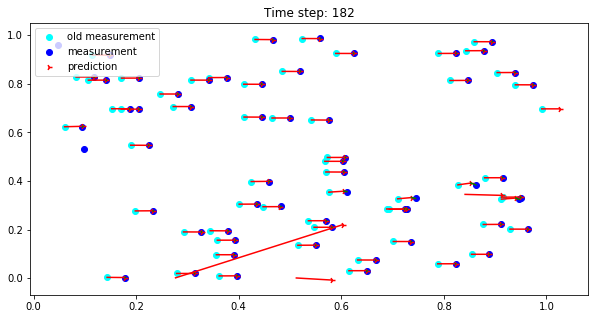

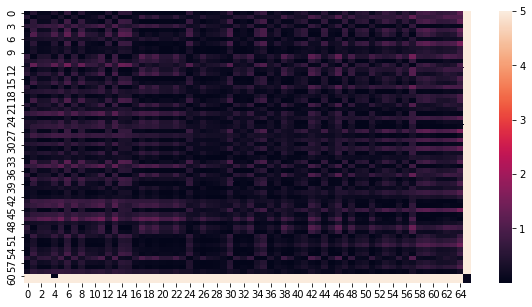

Time step: 183
dist 0.007079641943315895
B
D


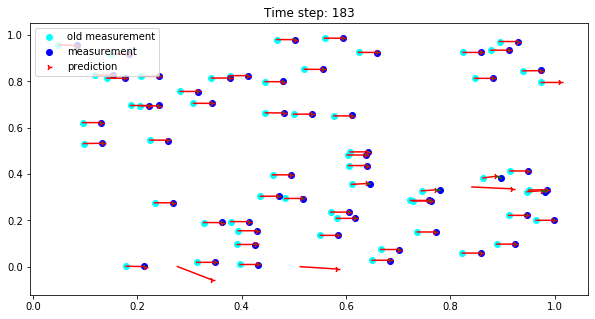

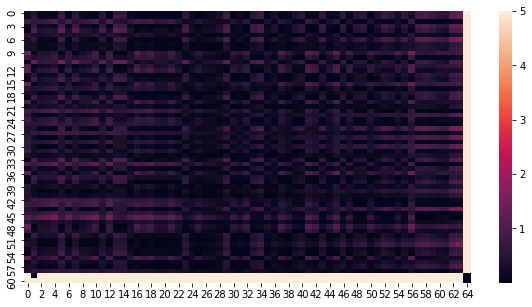

Time step: 184
dist 0.017069263376611188
dist 0.03164266929663295
dist 0.006275915933512843
dist 0.007949089266932718
B
B
B
B
D
D
D
D


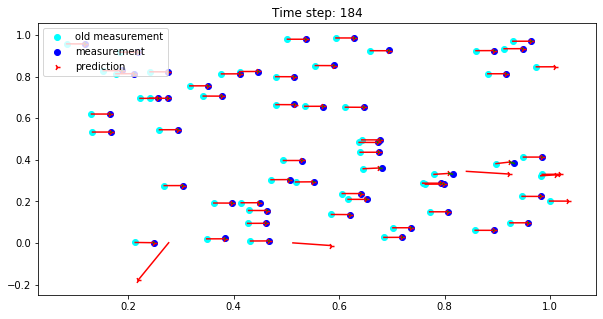

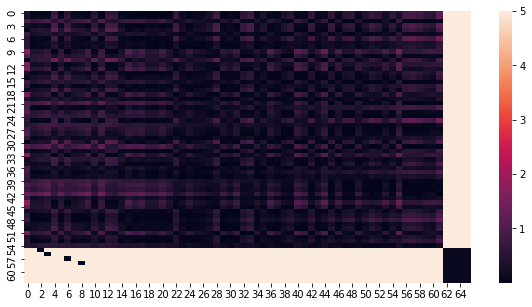

Time step: 185
dist 0.014519606310676059
dist 0.01715315296566633
B
B
D
D


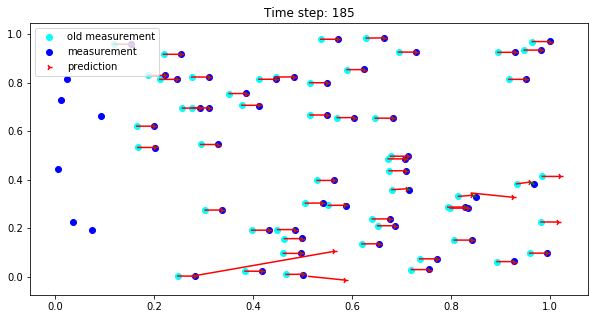

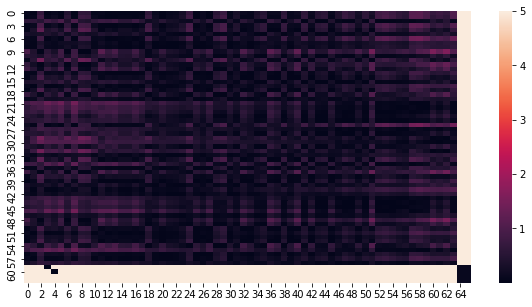

Time step: 186
dist 0.03220662108940986
dist 0.026640481036883656
dist 0.01512885519242646
B
B
B
D
D
D


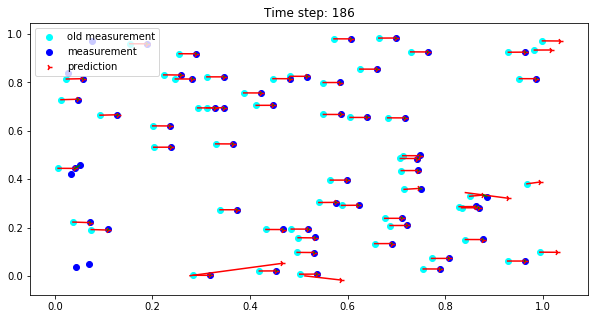

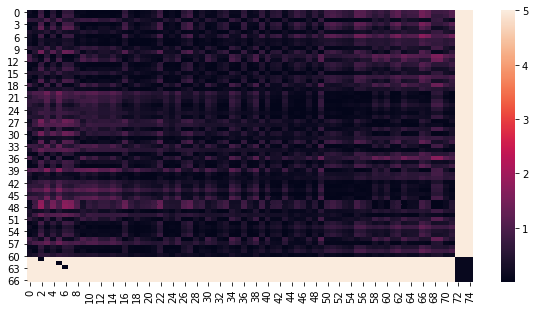

Time step: 187
dist 0.019467483291259358
dist 0.009923838006660857
B
B
D
D


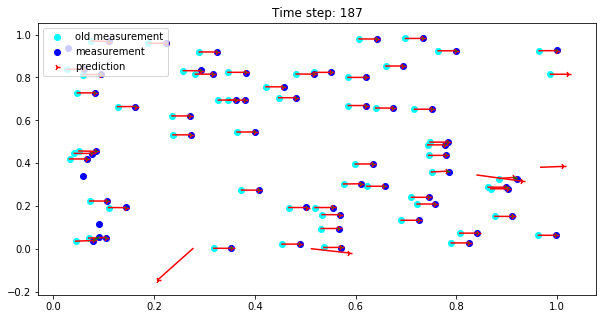

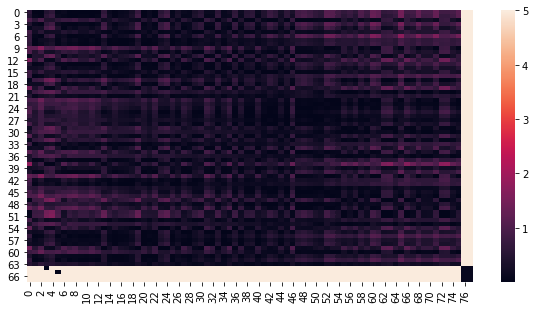

Time step: 188
dist 0.030271413178162287
dist 0.03168654100795498
B
B
D
D


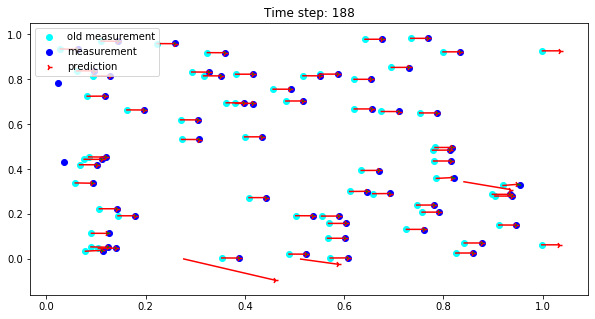

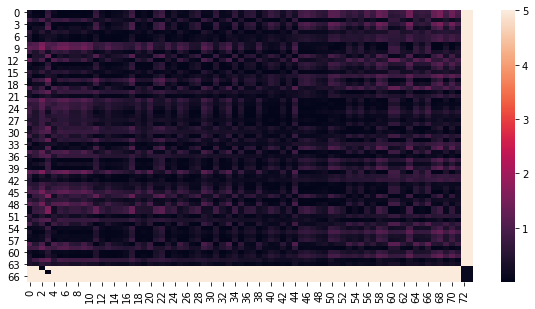

Time step: 189


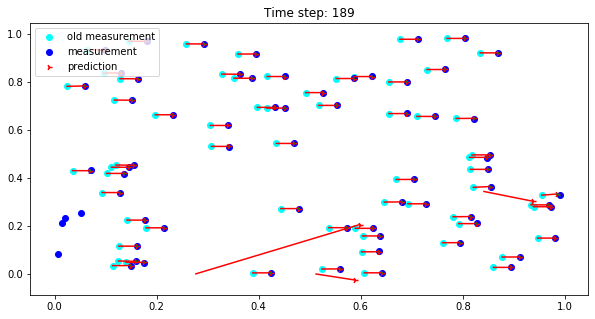

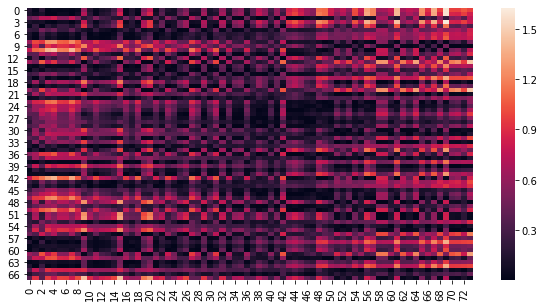

Time step: 190
dist 0.01402189158592515
dist 0.006040621948311342
dist 0.0009420852795123391
dist 0.016957732851758278
B
B
B
B
D
D
D
D


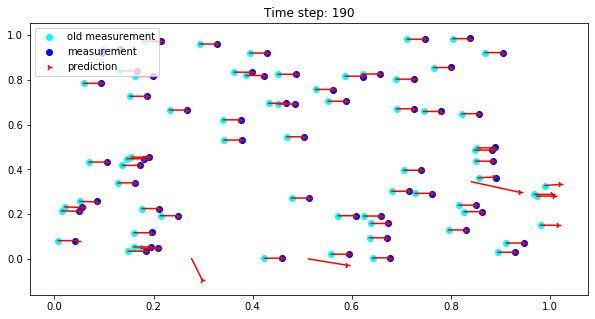

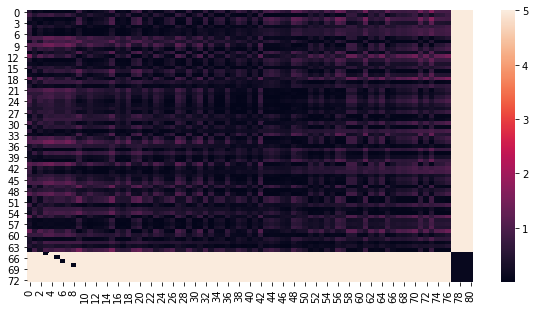

Time step: 191


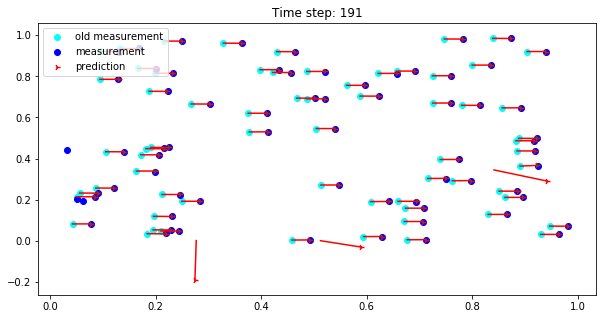

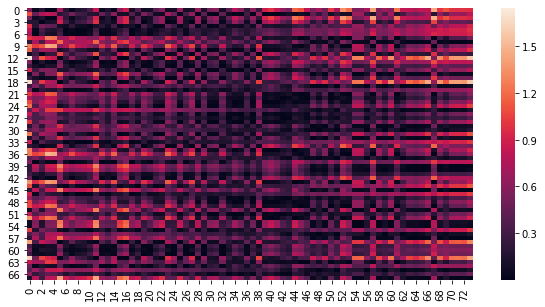

Time step: 192
dist 0.014359419415164831
B
D


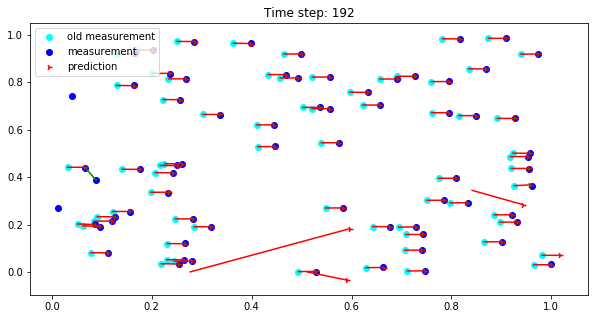

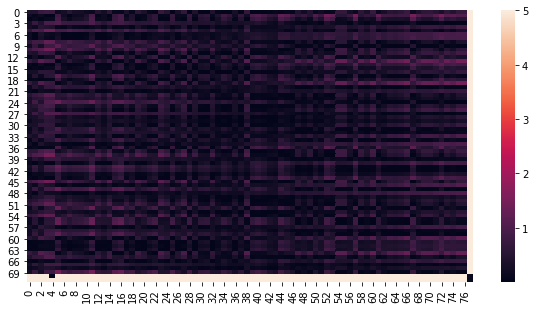

Time step: 193
dist 0.03232534208726756
dist 0.0067048283717892065
B
B
D
D


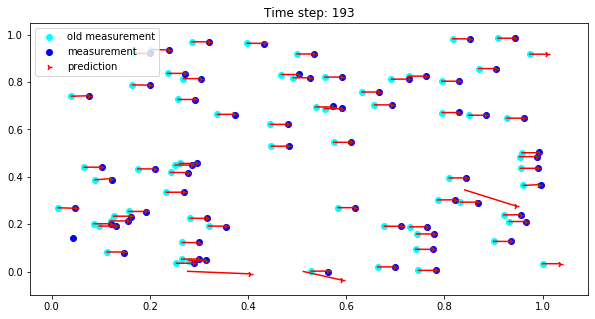

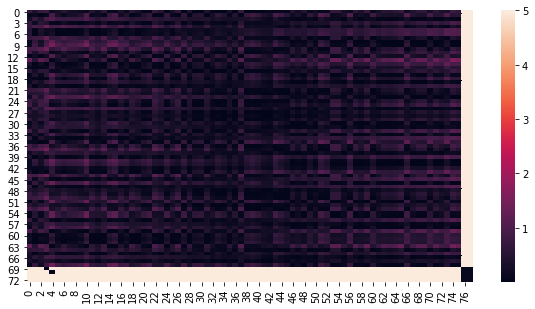

Time step: 194
dist 0.025605228957856108
dist 0.0007387701741567998
dist 0.02256071927167036
dist 0.02059842928722677
dist 0.025459953728592
B
B
B
B
B
D
D
D
D
D


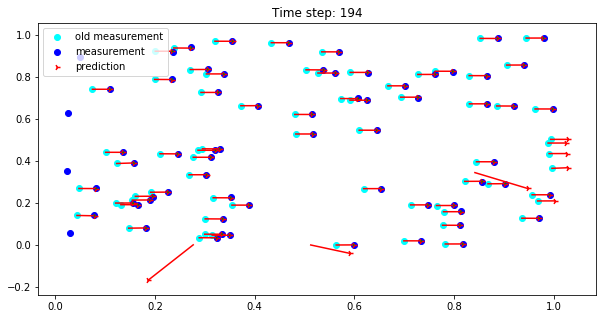

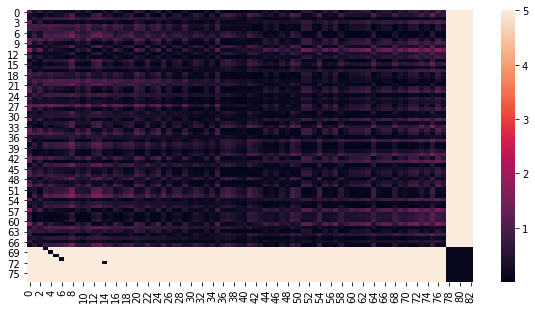

Time step: 195
dist 0.02946655416247701
dist 0.011216524761767932
dist 0.02360607084089783
dist 0.002890898695977917
B
B
B
B
D
D
D
D


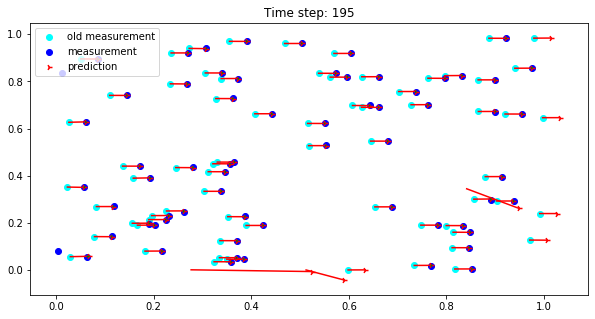

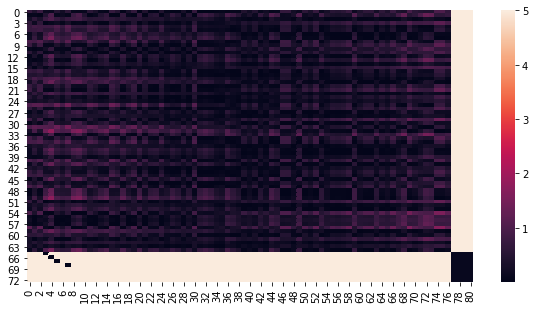

Time step: 196
dist 0.0075074463263908875
B
D


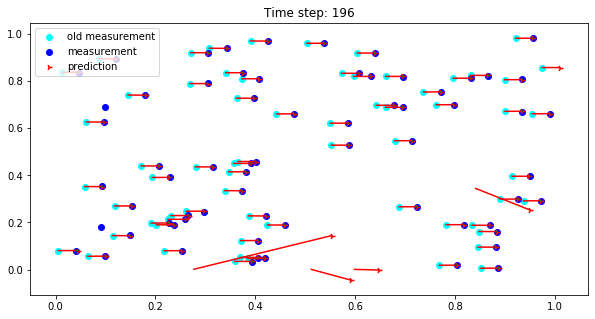

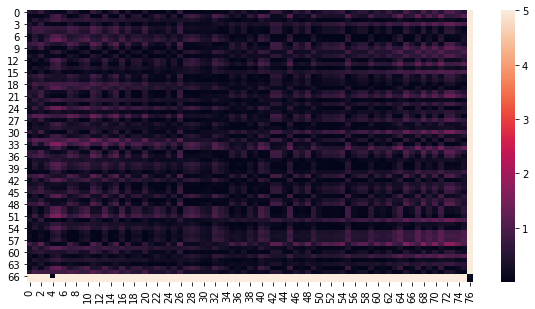

Time step: 197
dist 0.022511936034164126
dist 0.004665950494682436
B
B
D
D


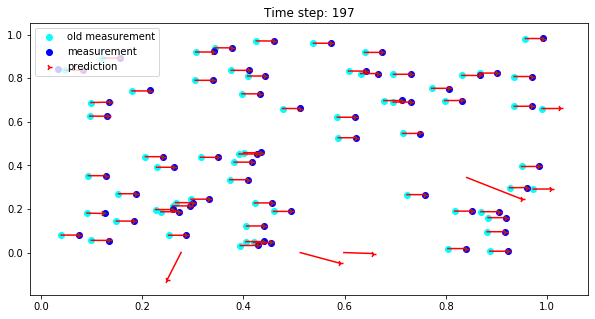

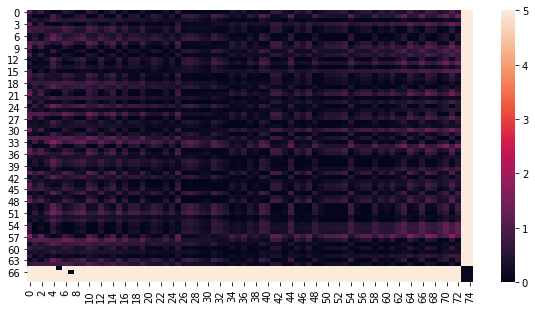

Time step: 198
dist 0.017111927412024386
dist 0.024649420630539876
dist 0.0026653761693915534
dist 0.002151510410886459
B
B
B
B
D
D
D
D


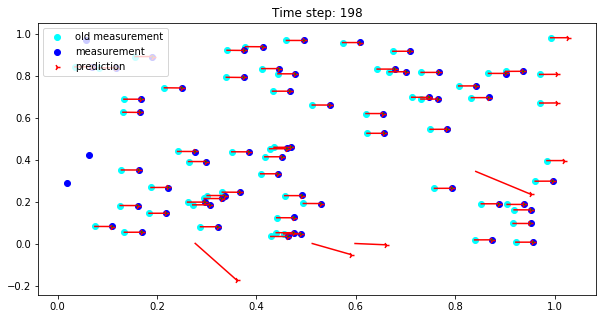

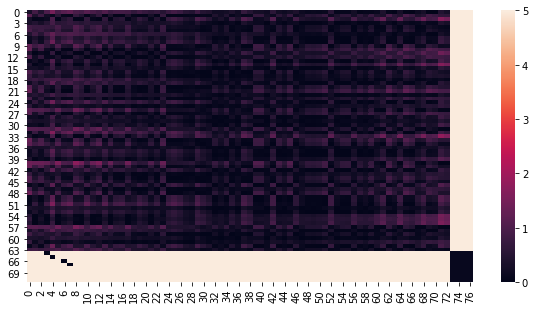

Time step: 199
dist 0.02855868157484842
B
D


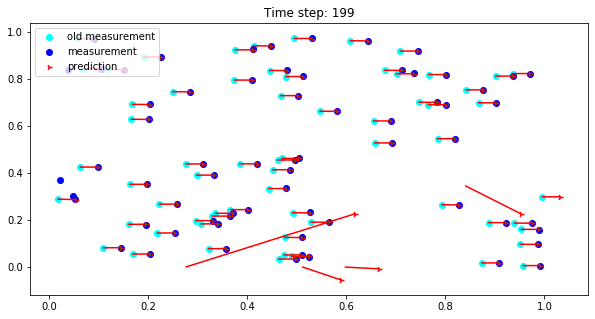

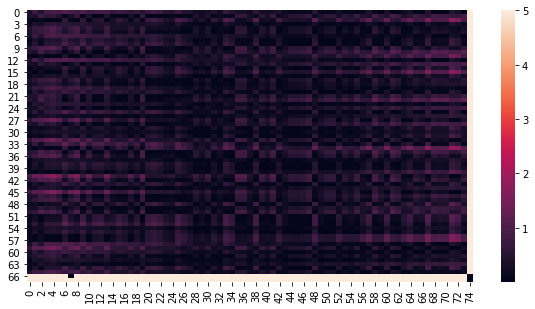

Time step: 200
dist 0.018928183484095973
dist 0.024221661637718217
dist 0.020885660734819345
dist 0.00435417343055744
dist 0.006893970233850855
B
B
B
B
B
D
D
D
D
D


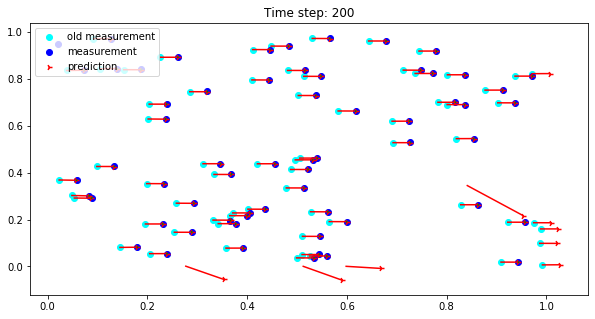

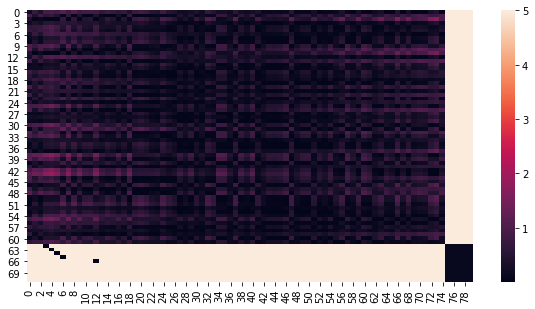

Time step: 201
dist 0.004463473436858489
B
D


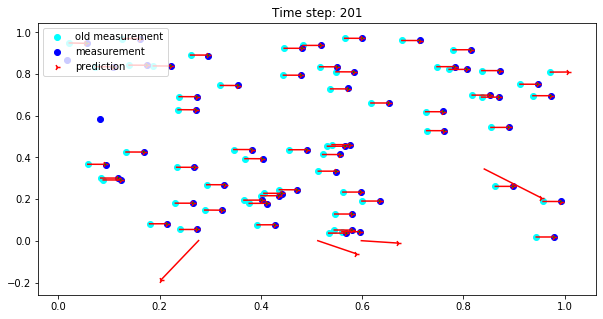

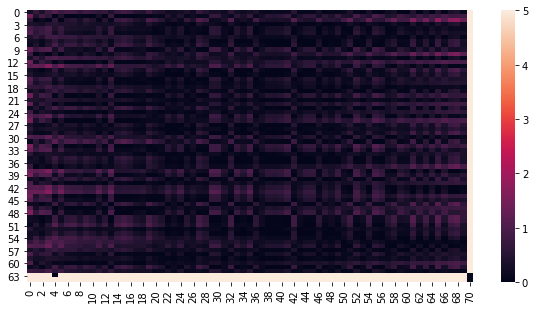

Time step: 202
dist 0.011236215423809703
dist 0.025152053212112113
dist 0.005050139509805263
B
B
B
D
D
D


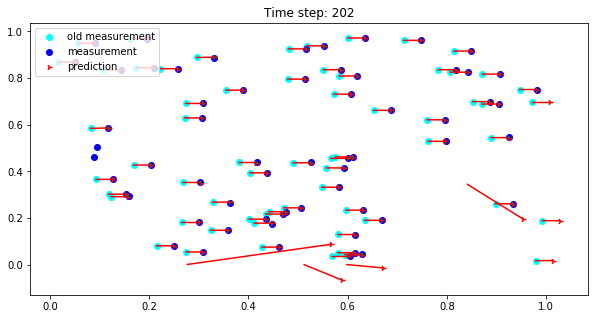

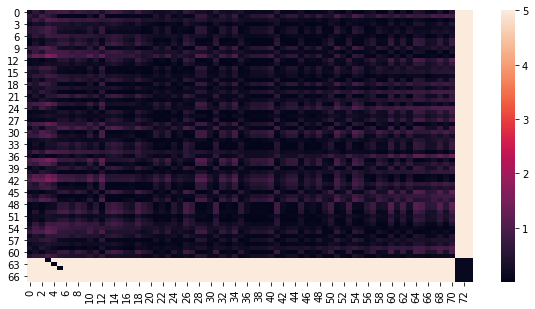

Time step: 203
dist 0.014510833050030314
B
D


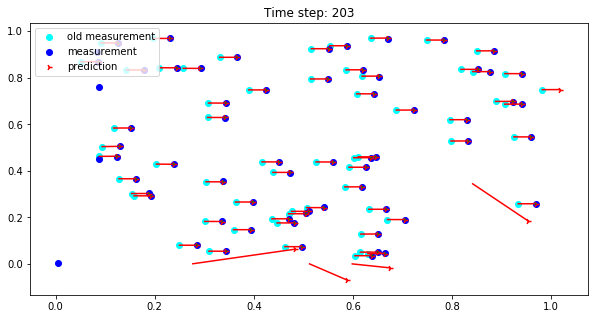

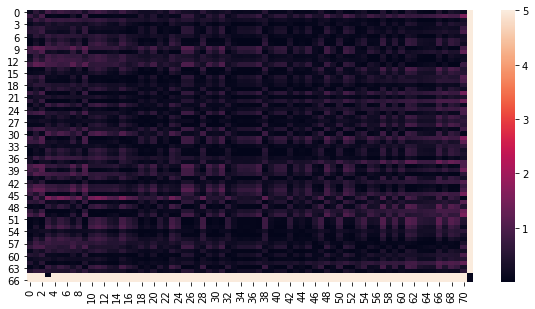

Time step: 204
dist 0.000838162486270555
B
D


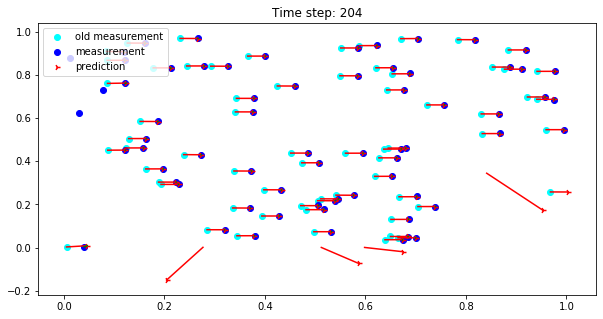

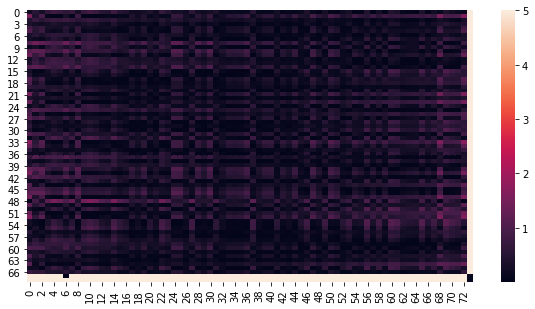

Time step: 205
dist 0.027027868571934288
dist 0.0089898263728303
dist 0.008540584341204305
B
B
B
D
D
D


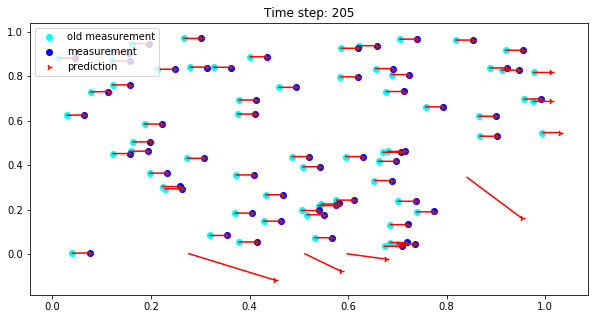

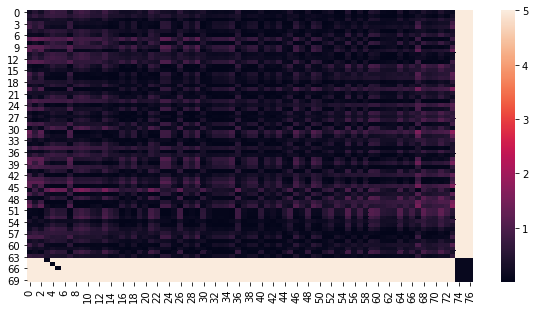

Time step: 206
dist 0.025103097705553745
B
D


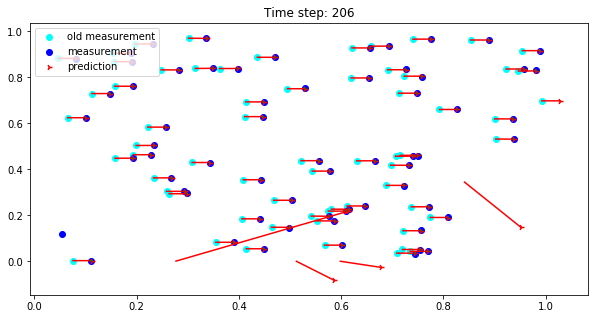

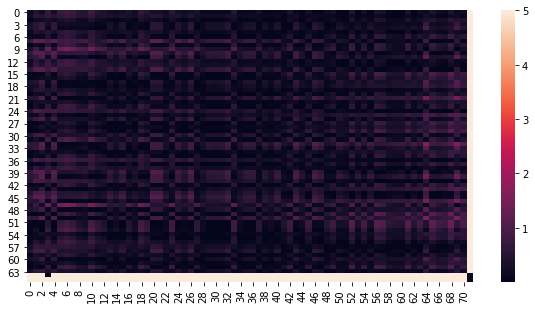

Time step: 207
dist 0.021747928279282736
dist 0.01433769539478802
B
B
D
D


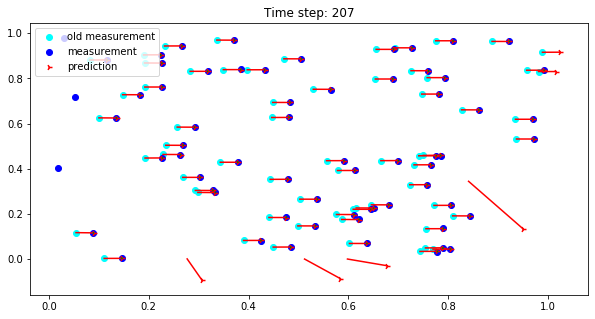

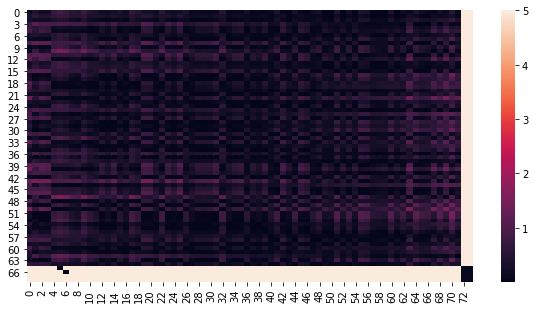

Time step: 208
dist 0.025456122073538756
dist 0.0030923882087026122
dist 0.004961977473677104
B
B
B
D
D
D


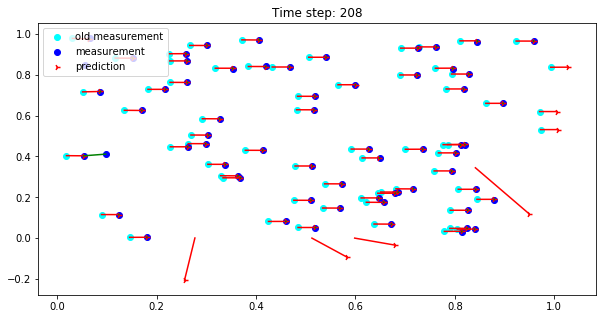

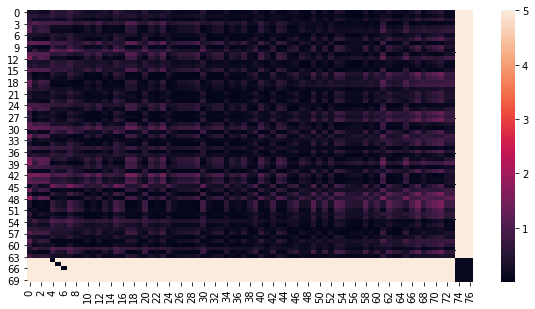

Time step: 209


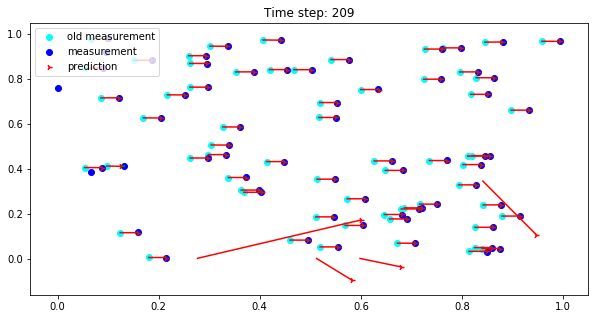

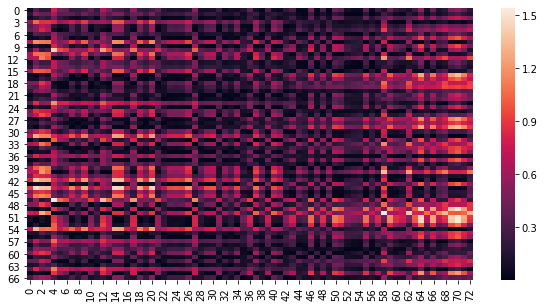

Time step: 210
dist 0.02582862197919633
B
D


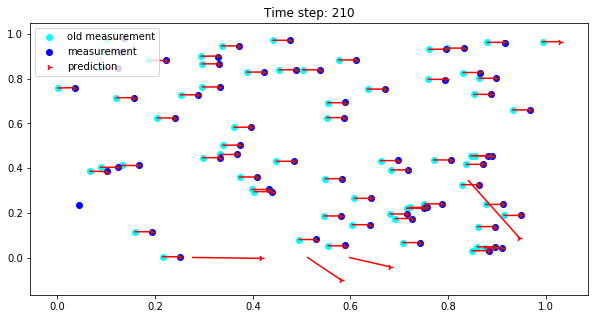

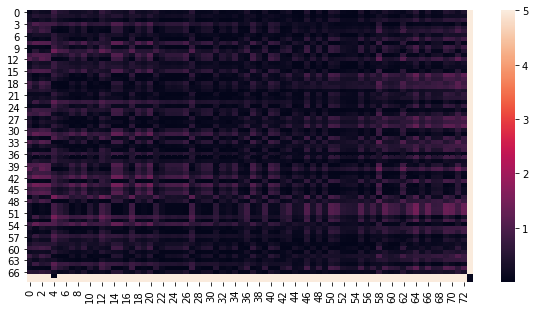

Time step: 211
dist 0.00014366573743829214
B
D


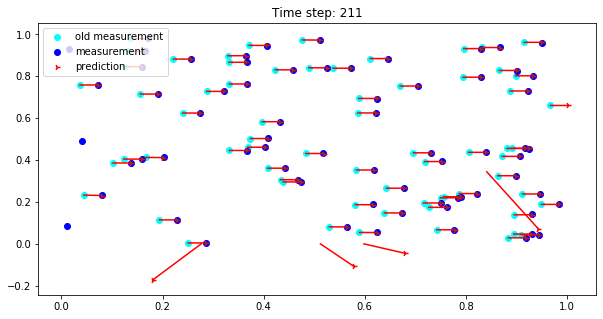

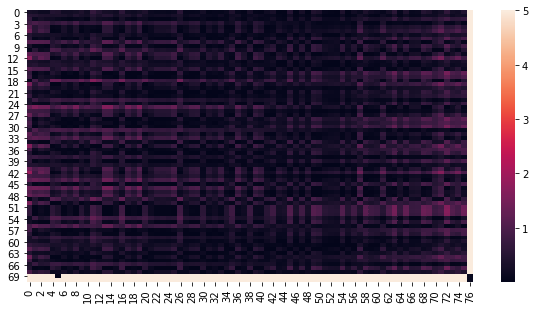

Time step: 212
dist 0.017130322954633348
B
D


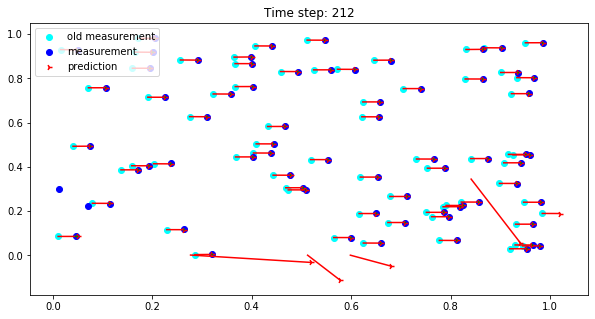

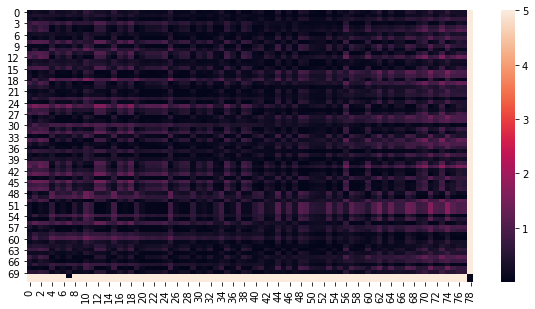

Time step: 213
dist 0.0010026408094931938
dist 0.014541821562755963
dist 0.017605640447126758
dist 0.012130792930026058
dist 0.0018097434926676037
B
B
B
B
B
D
D
D
D
D


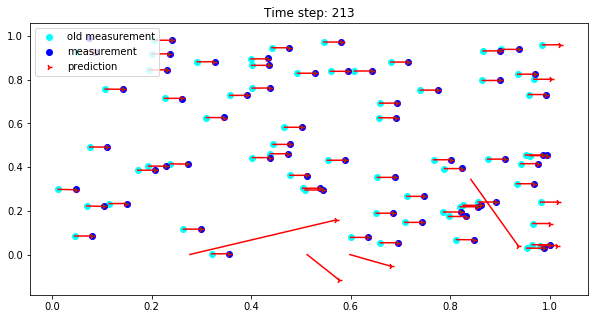

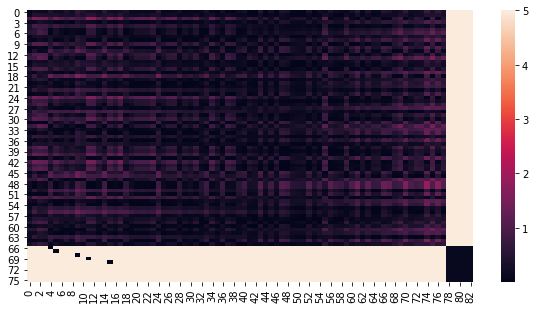

Time step: 214
dist 0.02822133361980672
dist 0.024980420113243307
dist 0.01892997152381959
dist 0.003493652988799667
dist 0.03221312994942904
dist 0.009618180127817899
dist 0.0011261977048155902
dist 0.021145276128165413
B
B
B
B
B
B
B
B
D
D
D
D
D
D
D
D


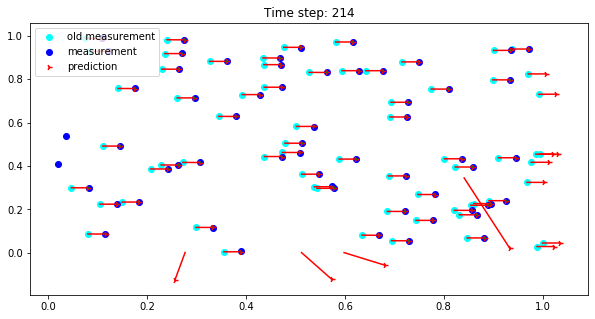

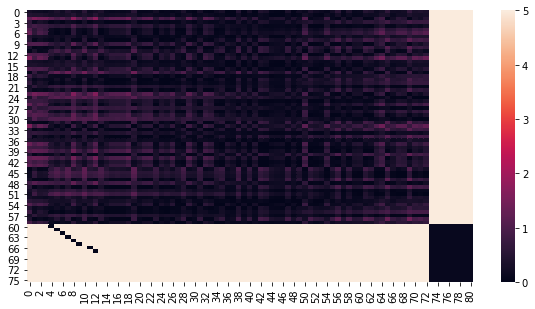

Time step: 215
dist 0.005577225208702297
B
D


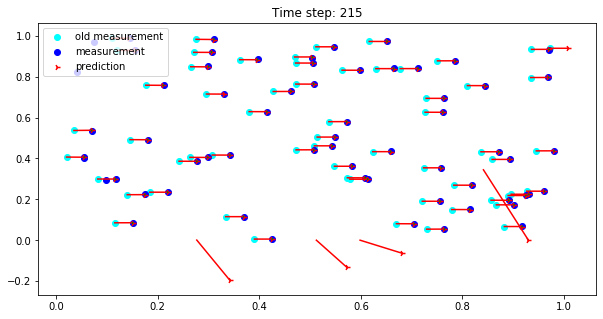

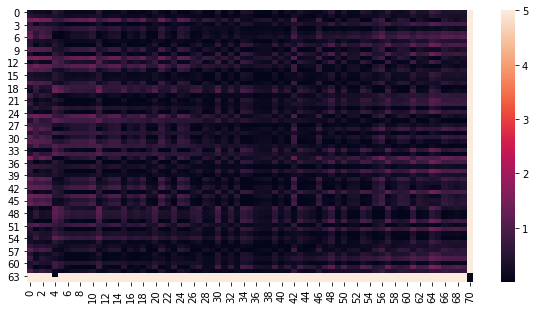

Time step: 216
dist 0.0020455763034514796
dist 0.013013823089309318
dist 0.0030142134446378144
B
B
B
D
D
D


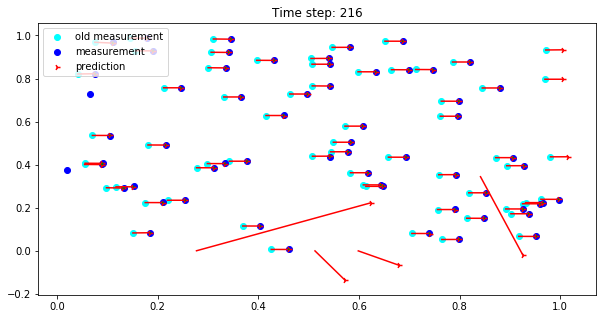

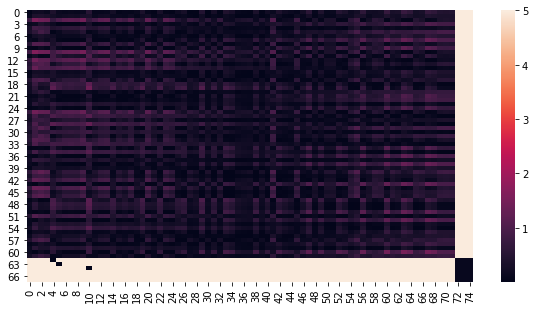

Time step: 217
dist 0.0014407864664123249
dist 0.029026879340470213
B
B
D
D


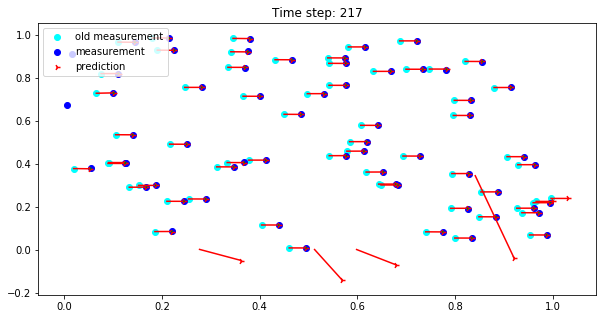

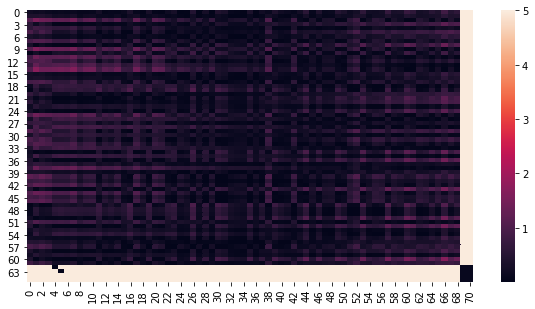

Time step: 218
dist 0.027518770115037228
dist 0.01996681361571362
dist 0.004468315665001832
B
B
B
D
D
D


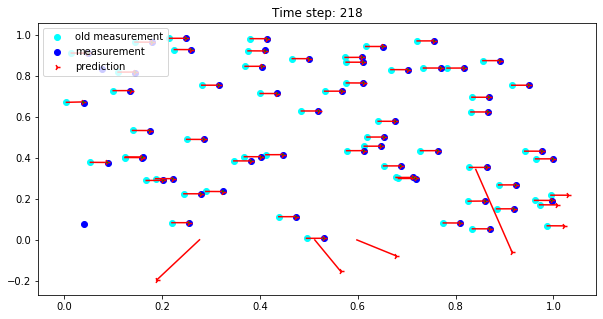

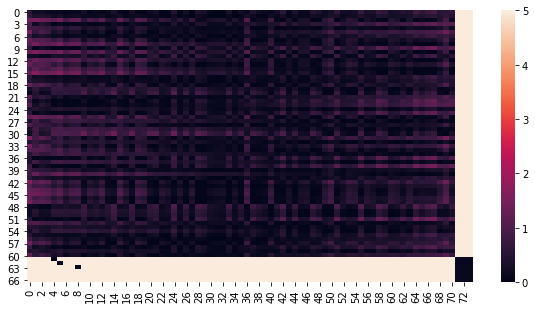

Time step: 219
dist 0.03094714832926604
dist 0.028984326797944826
dist 0.009135967518151933
B
B
B
D
D
D


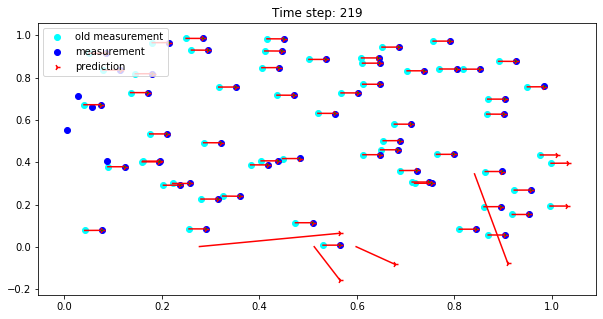

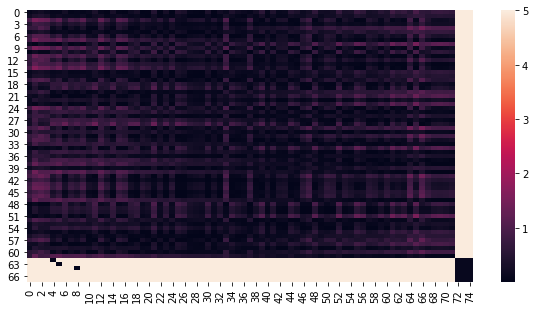

Time step: 220
dist 0.017627662061794114
B
D


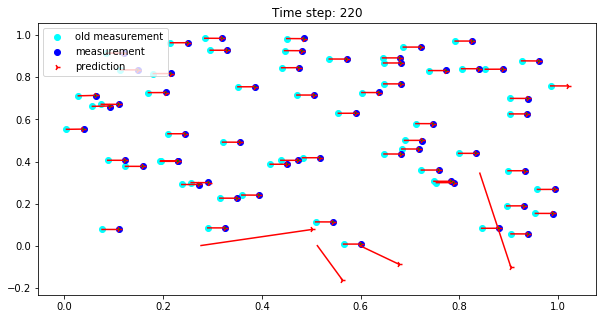

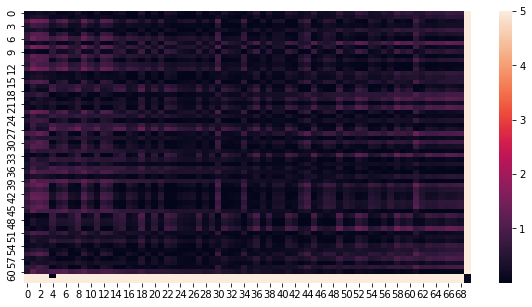

Time step: 221
dist 0.025541158394869035
dist 0.021271227794587455
B
B
D
D


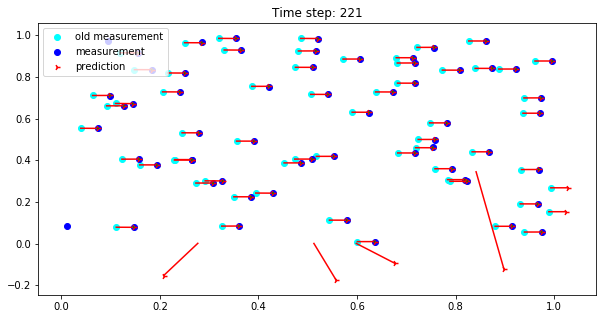

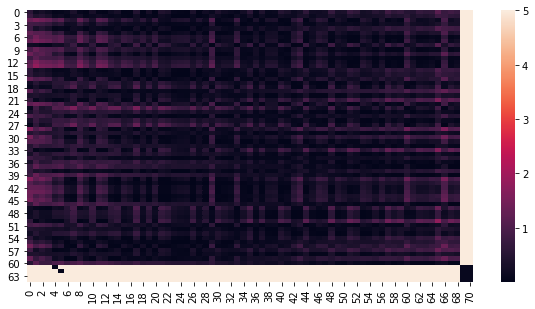

Time step: 222
dist 0.004164030497176174
dist 0.028374215809382264
dist 0.00680769850581453
dist 0.0009535302504664056
dist 0.0016741383087832684
dist 0.005917397374842315
B
B
B
B
B
B
D
D
D
D
D
D


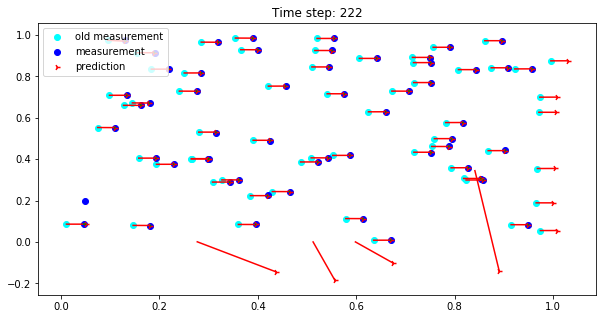

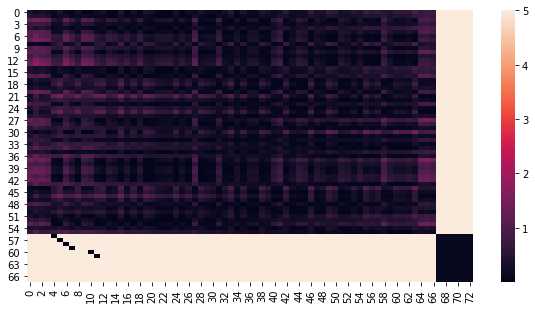

Time step: 223


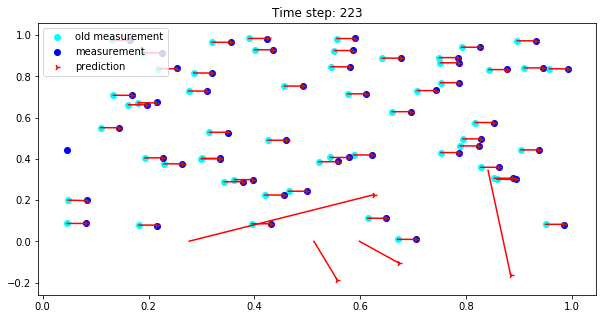

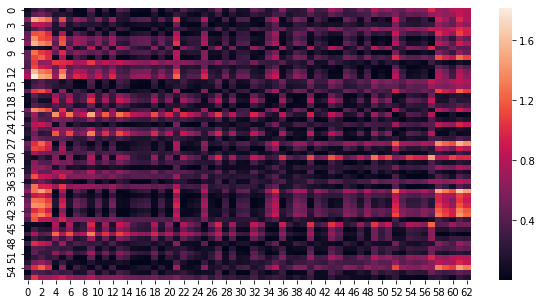

Time step: 224
dist 0.02513785514920186
dist 0.017048007141858168
B
B
D
D


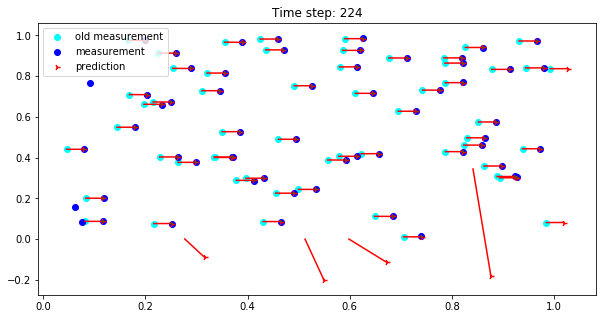

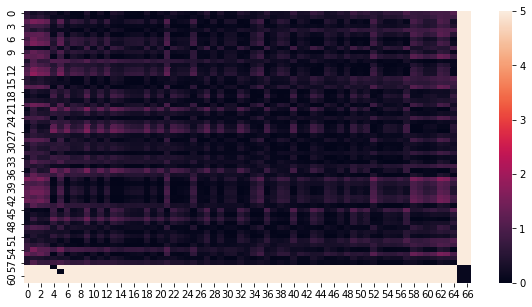

Time step: 225
dist 0.012118842052261769
dist 0.005939992563634311
dist 0.0011727947089124058
B
B
B
D
D
D


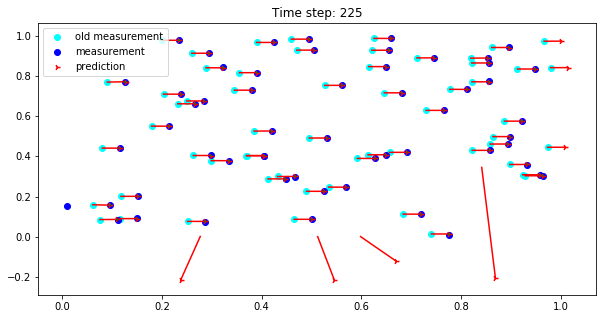

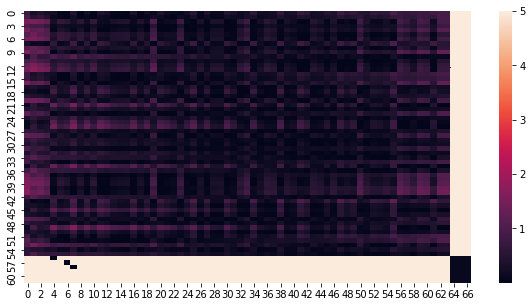

Time step: 226


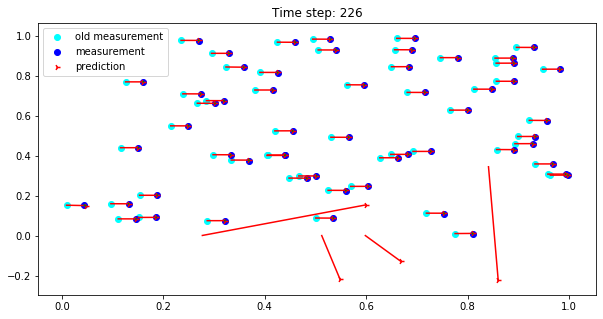

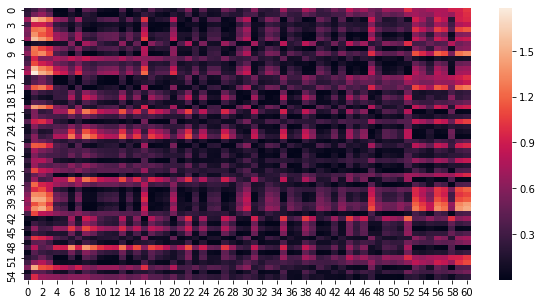

Time step: 227
dist 0.03086557197472528
dist 0.0006392384747135882
dist 0.015561852553192868
dist 0.02600061843949475
B
B
B
B
D
D
D
D


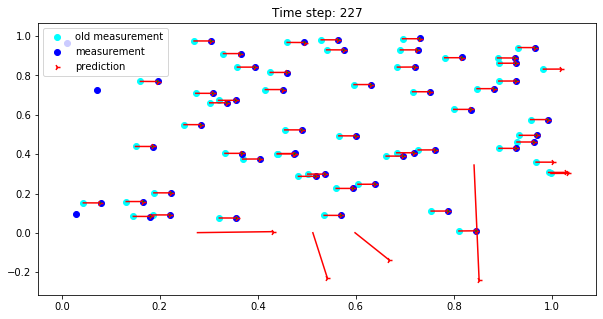

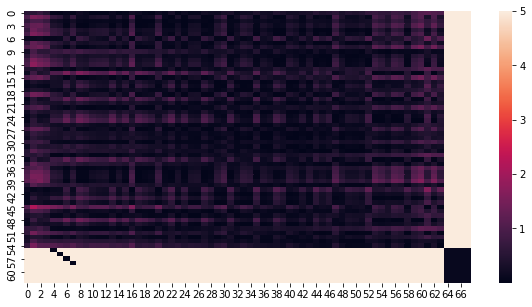

Time step: 228
dist 0.0009007335182369403
dist 0.024383061347584833
dist 0.0015809232346972735
B
B
B
D
D
D


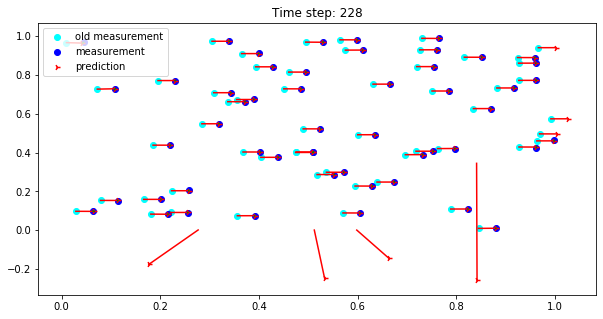

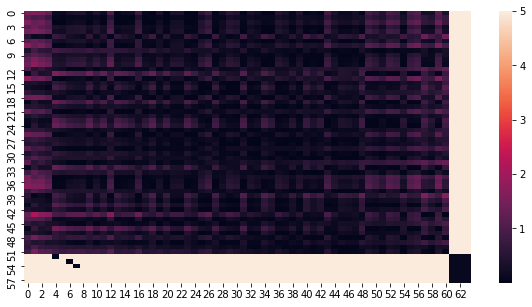

Time step: 229
dist 0.03132585076749872
B
D


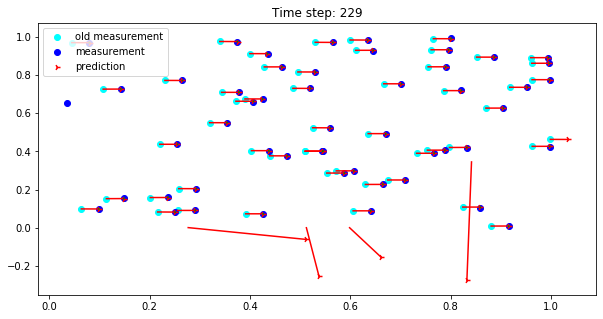

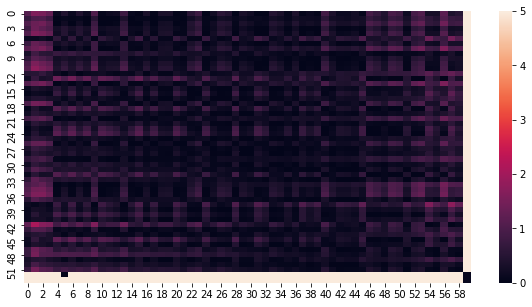

Time step: 230
dist 0.0291186361943232
dist 0.02674922373240518
dist 0.02999788905109413
dist 0.029289571519891755
B
B
B
B
D
D
D
D


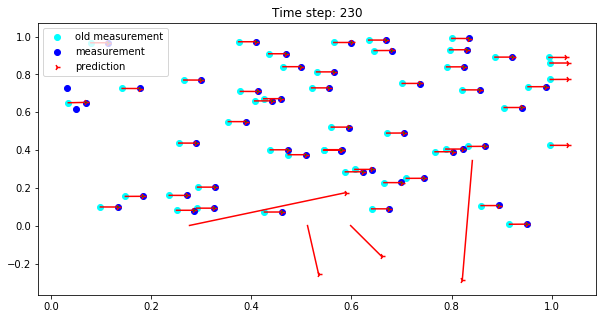

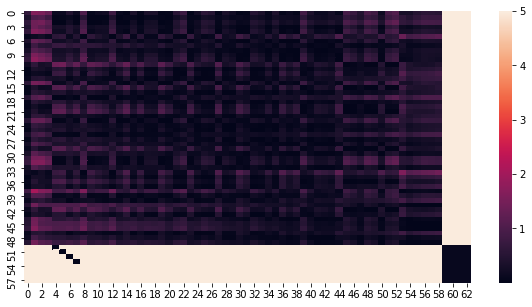

Time step: 231
dist 0.019929199944357823
B
D


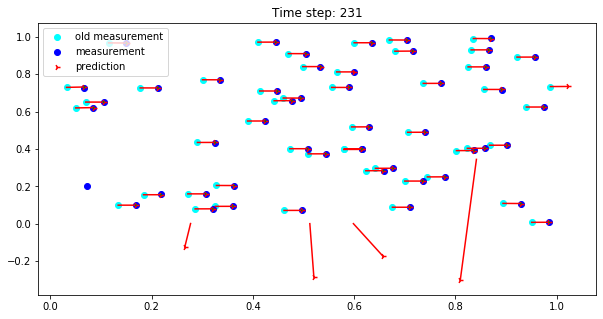

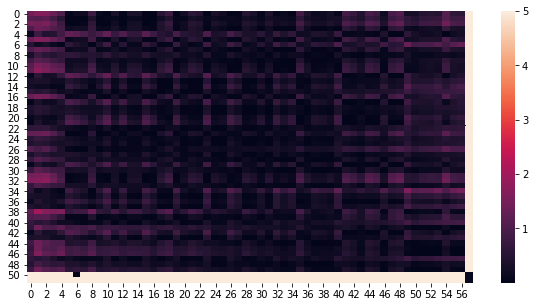

Time step: 232
dist 0.01761517203733809
dist 0.00770236941950686
B
B
D
D


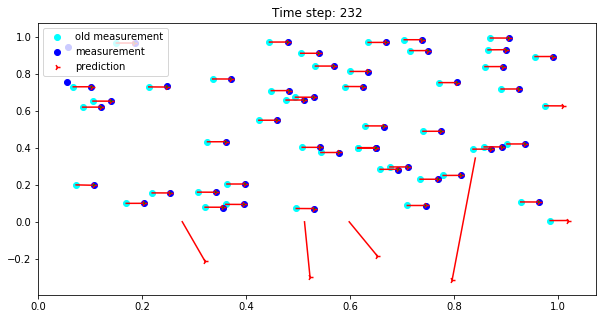

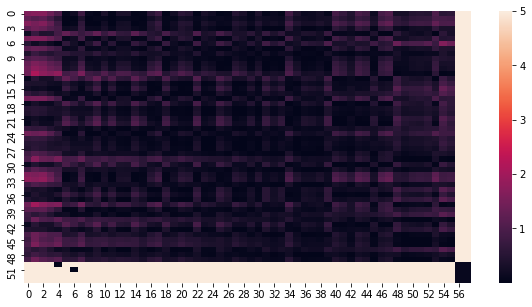

Time step: 233
dist 0.02408269223983428
B
D


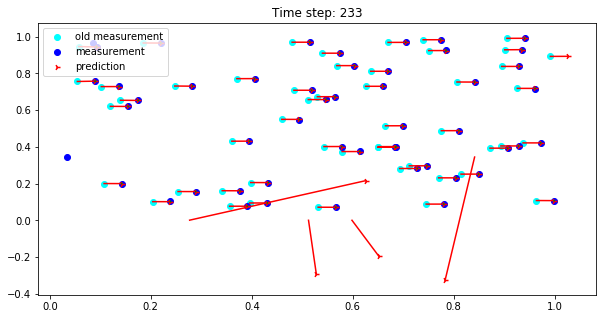

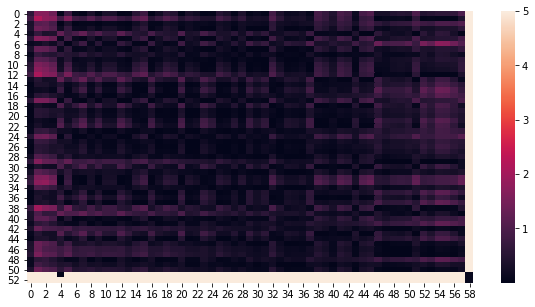

Time step: 234
dist 0.031225166072266664
dist 0.004867561047900981
B
B
D
D


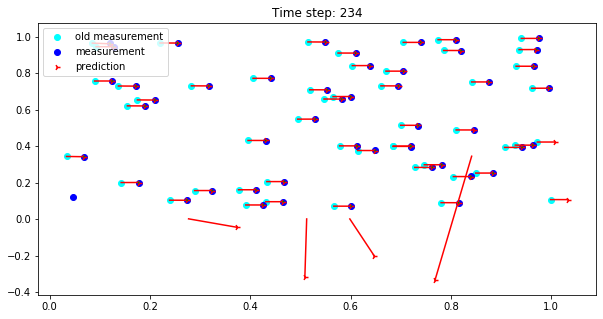

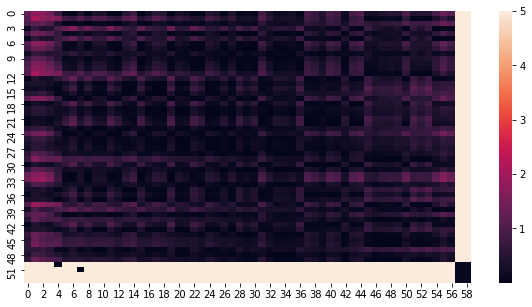

Time step: 235
dist 0.028615360893443853
dist 0.007917955609891614
dist 0.003049166705737072
B
B
B
D
D
D


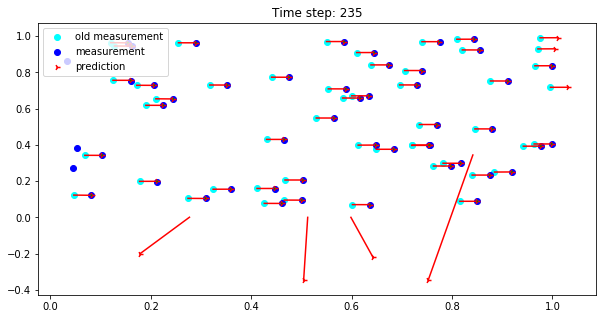

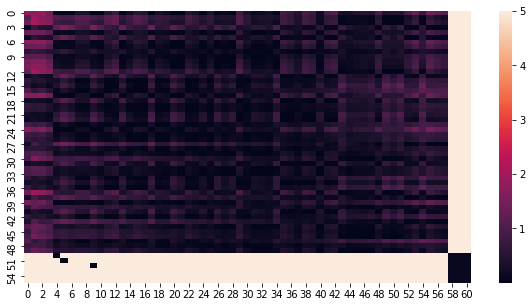

Time step: 236
dist 0.03245702399685646
dist 0.031268565651958236
dist 0.009628109745181357
B
B
B
D
D
D


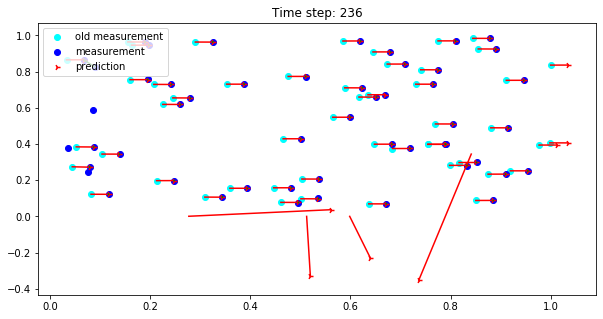

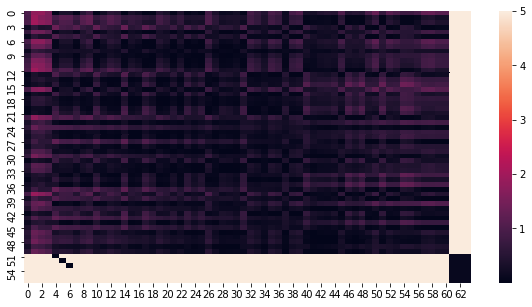

Time step: 237


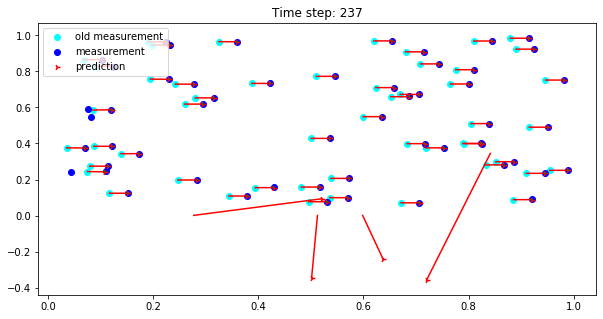

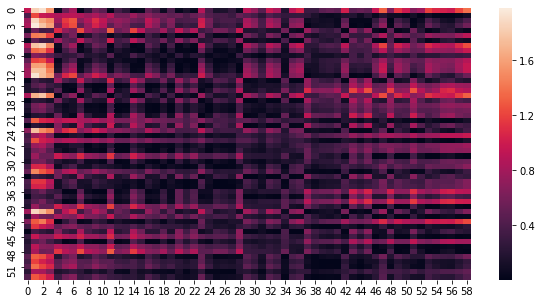

Time step: 238
dist 0.014062208650674313
dist 0.022060860562314932
B
B
D
D


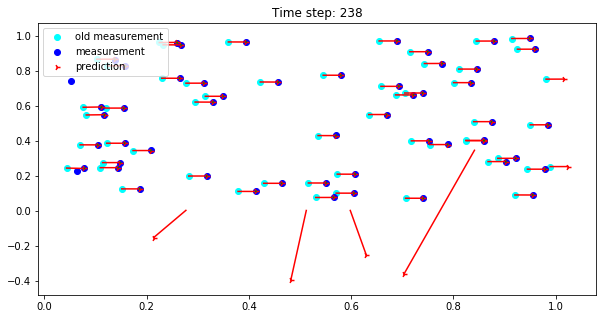

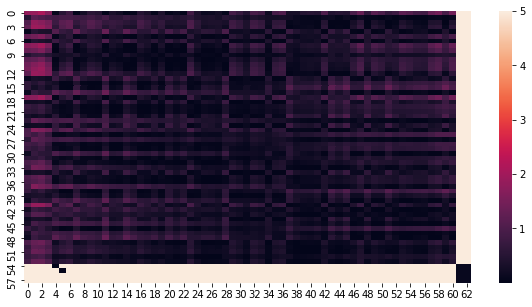

Time step: 239
dist 0.018051328683810874
dist 0.01246678646963928
B
B
D
D


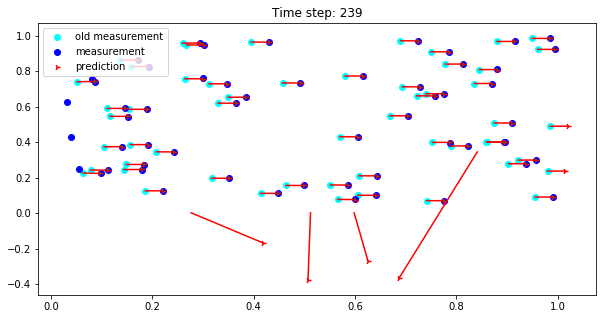

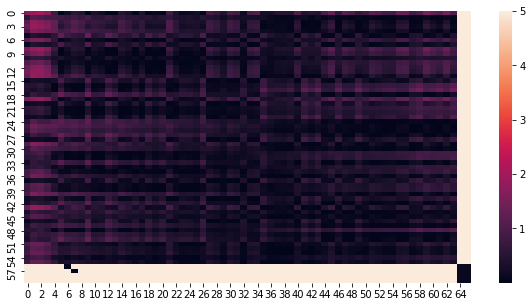

Time step: 240
dist 0.02276542731301756
dist 0.028144254446058392
dist 0.016730403209271216
B
B
B
D
D
D


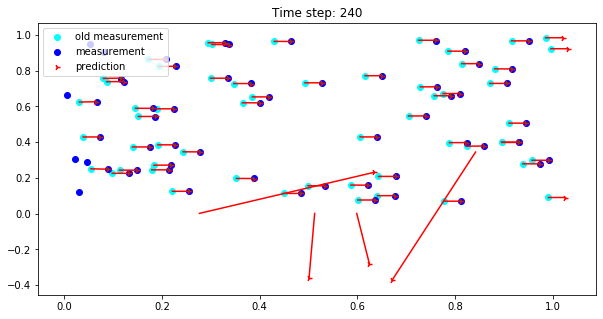

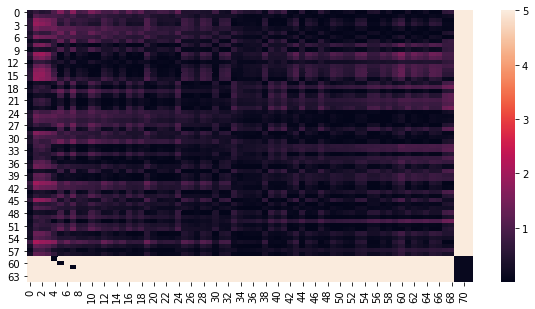

Time step: 241
dist 0.024532667159749666
dist 0.005509059950150386
B
B
D
D


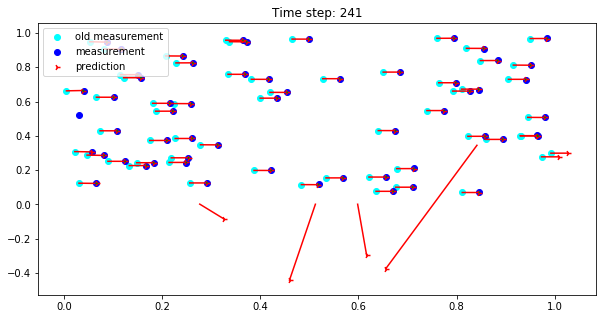

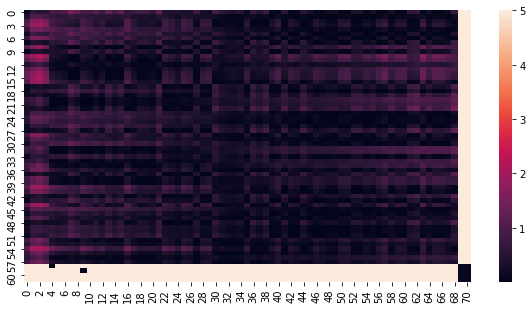

Time step: 242
dist 0.0020747590436016594
dist 0.01264992866205783
dist 0.01721457680537042
B
B
B
D
D
D


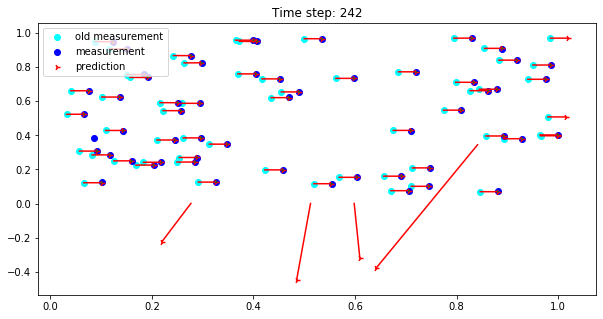

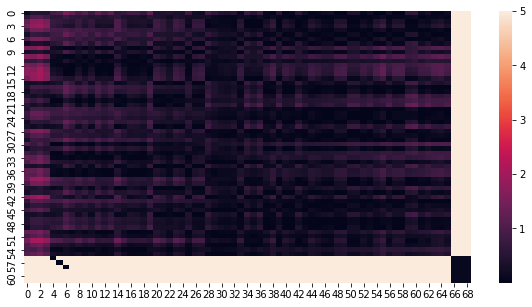

Time step: 243
dist 0.01815827738985054
dist 0.03234011563035022
dist 0.008020136381724718
B
B
B
D
D
D


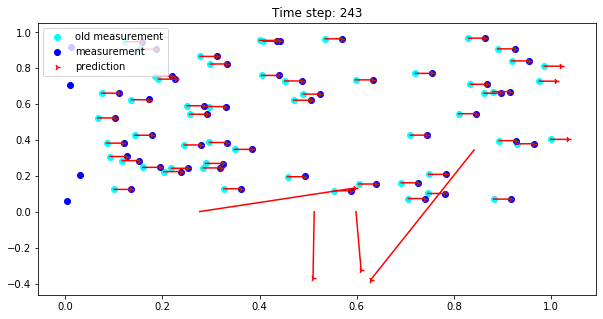

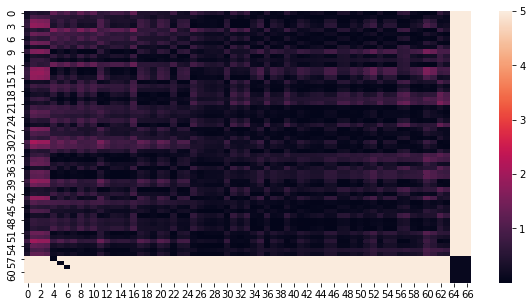

Time step: 244


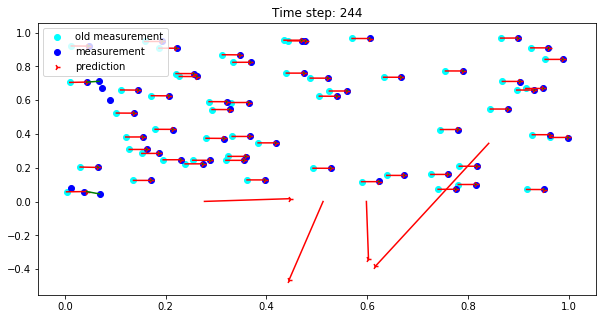

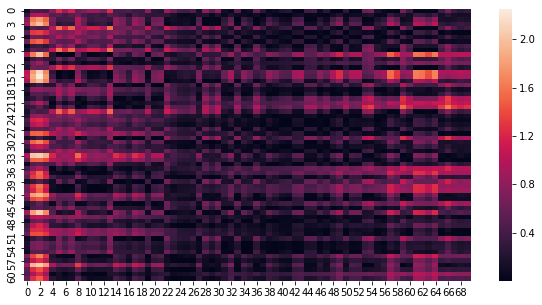

Time step: 245
dist 0.03129394626236204
dist 0.020845021962680343
B
B
D
D


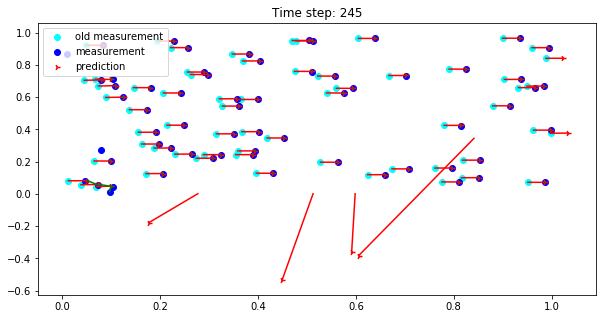

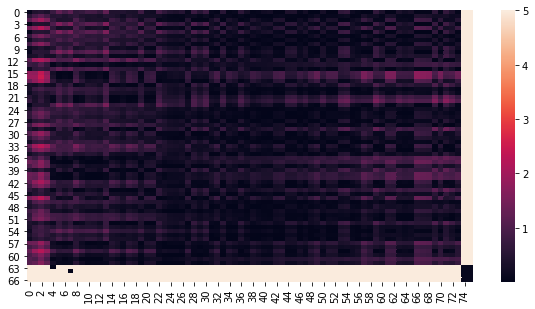

Time step: 246
dist 0.027599480945008636
dist 0.017616017296866238
dist 0.018689970617931095
dist 0.03052910907404849
dist 0.0003766970283582971
B
B
B
B
B
D
D
D
D
D


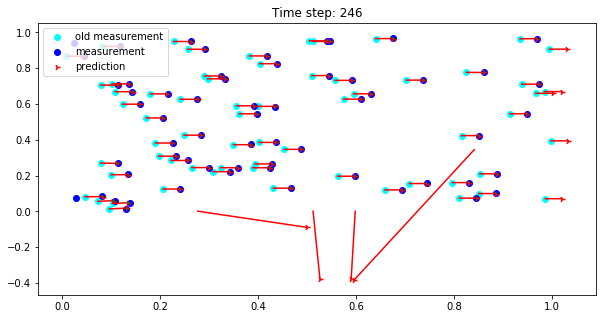

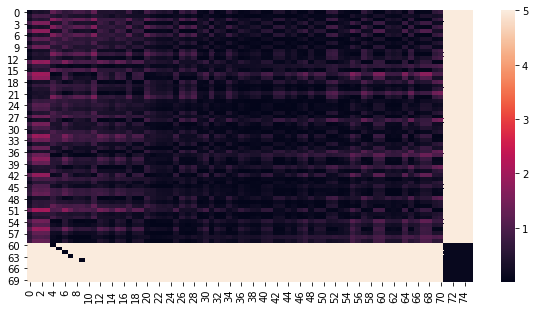

Time step: 247
dist 0.006034582775107156
dist 0.001872946499055228
B
B
D
D


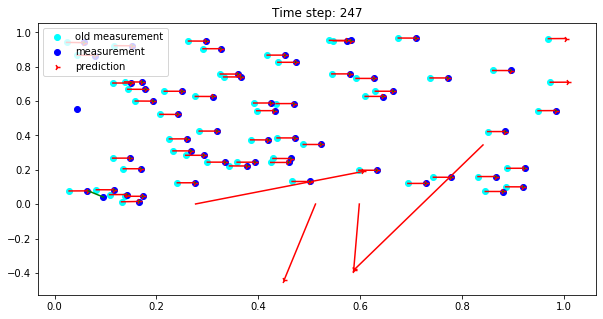

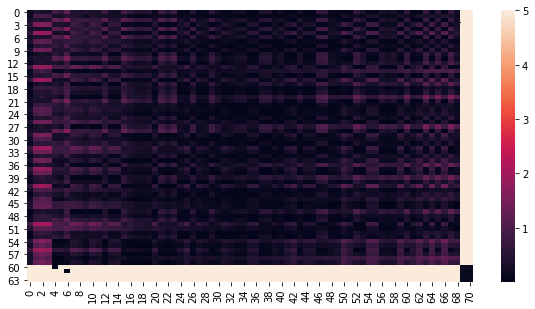

Time step: 248
dist 0.01707222457506652
B
D


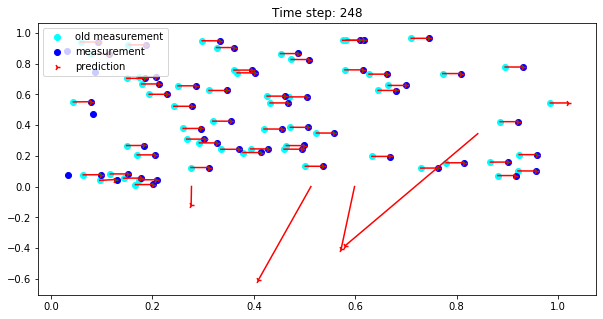

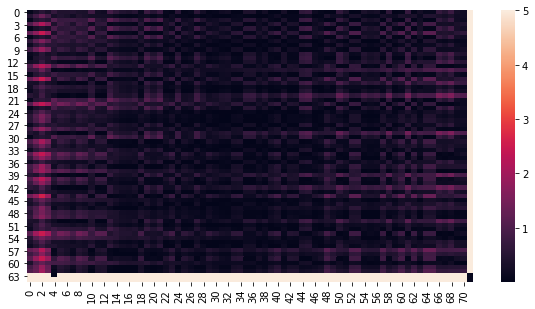

Time step: 249


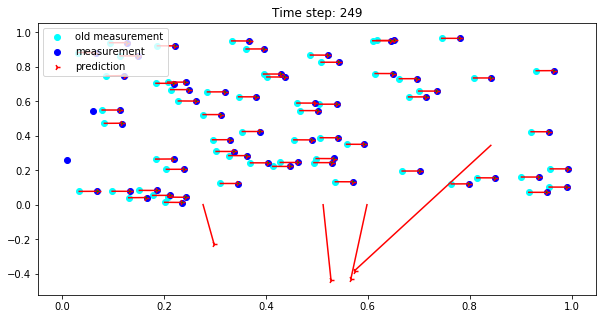

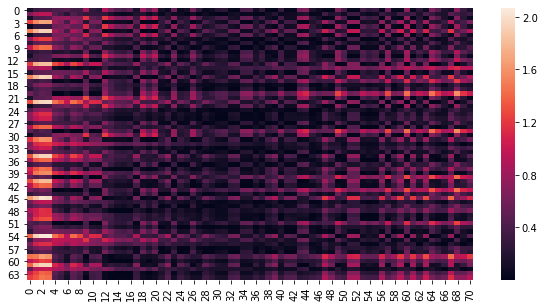

Time step: 250
dist 0.023007326560015695
dist 0.025425895656674635
dist 0.002113547751606326
B
B
B
D
D
D


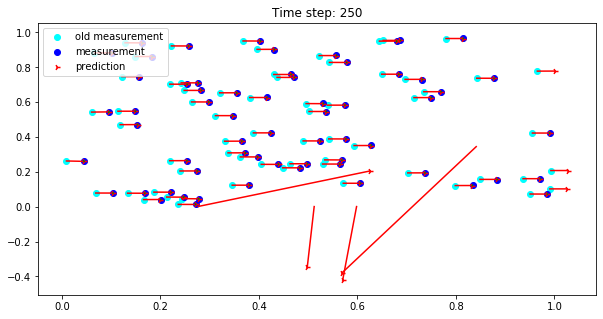

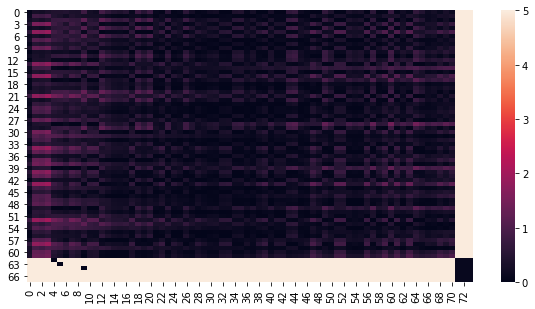

Time step: 251
dist 0.023198536746739995
dist 0.018226325810198007
dist 0.003896255837821272
B
B
B
D
D
D


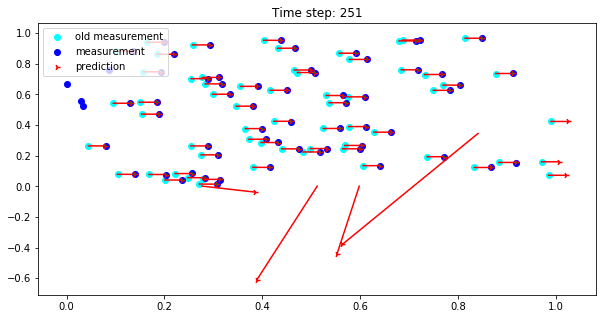

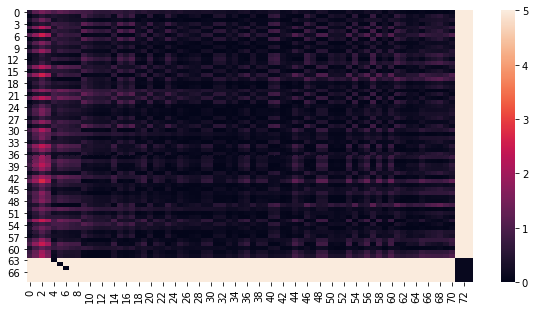

Time step: 252


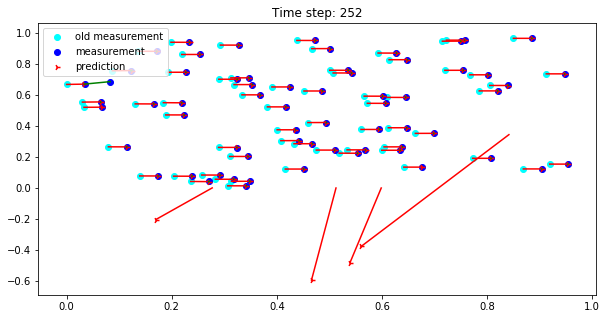

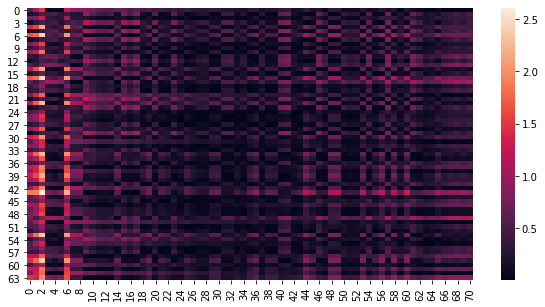

Time step: 253


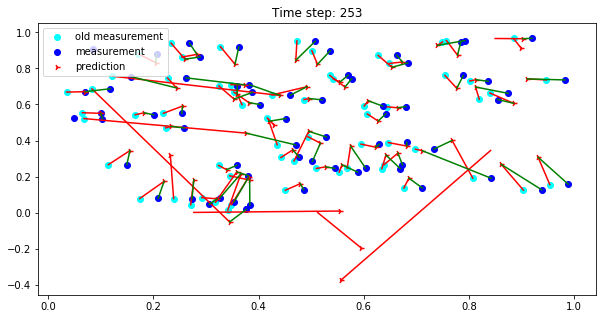

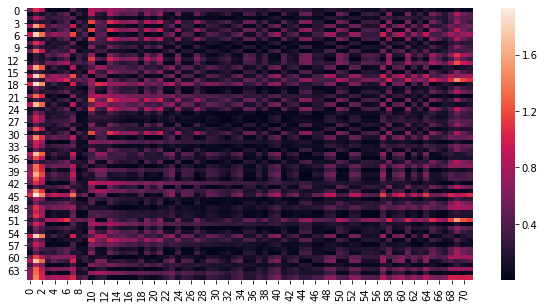

Time step: 254


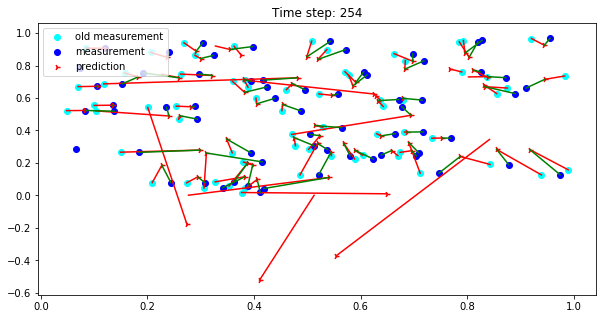

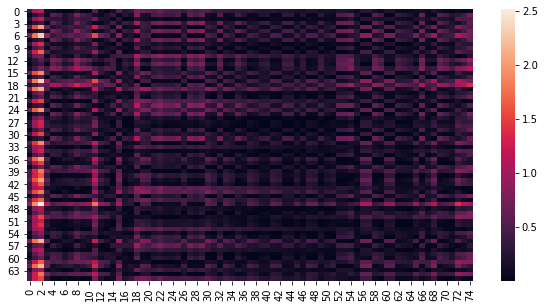

Time step: 255


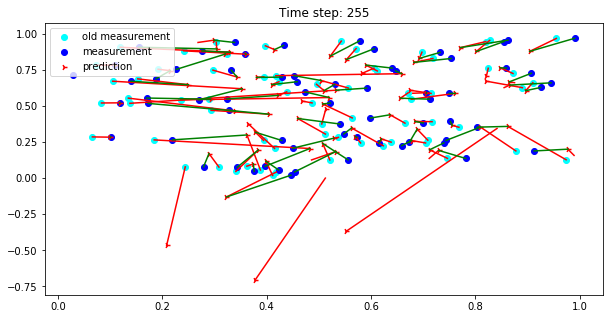

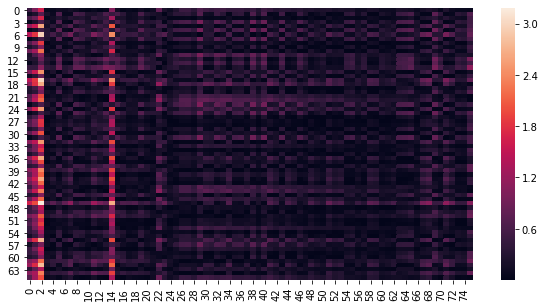

Time step: 256


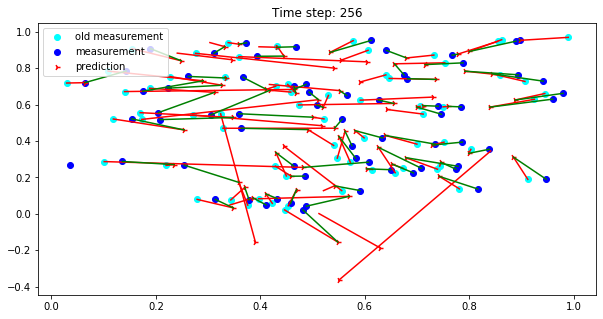

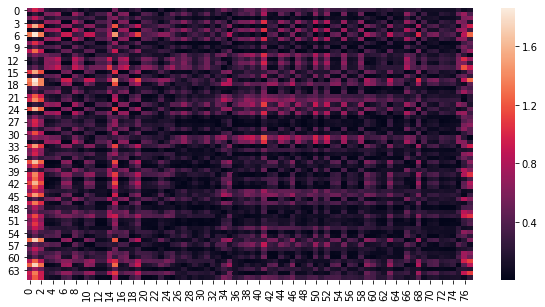

Time step: 257


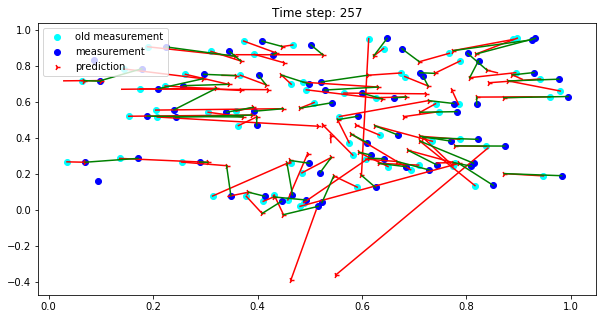

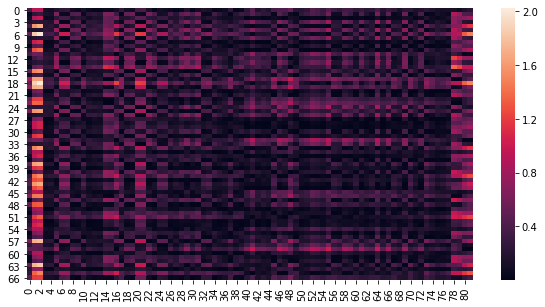

Time step: 258


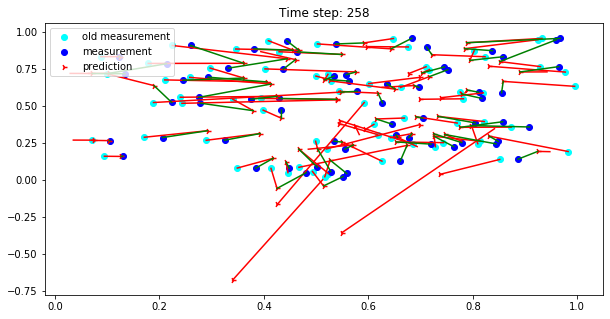

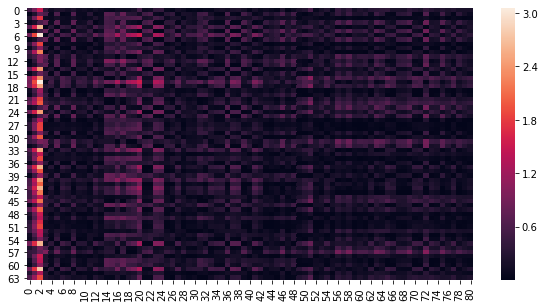

Time step: 259


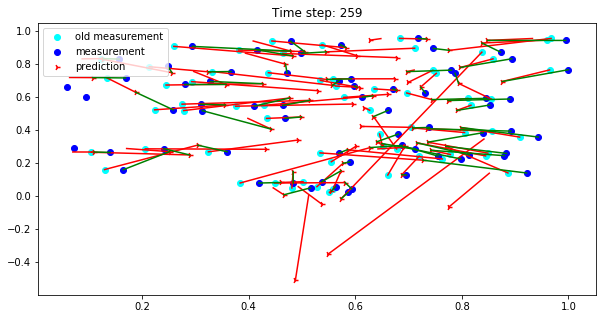

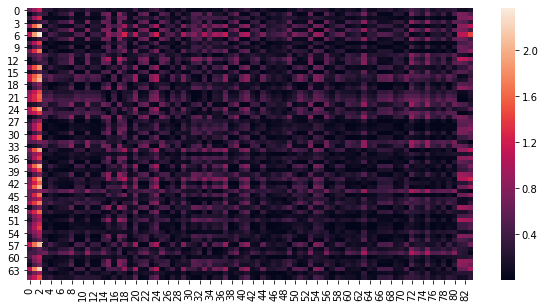

Time step: 260
dist 0.006299142309573291
B
D


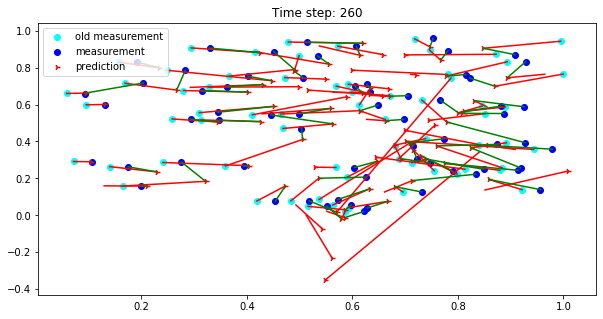

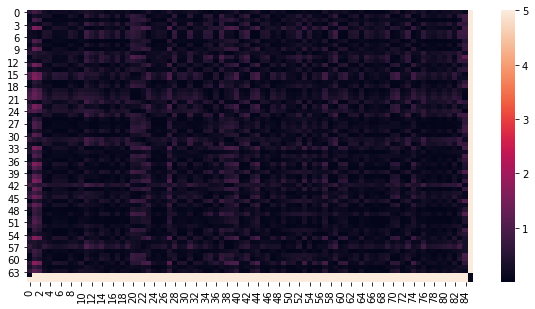

Time step: 261


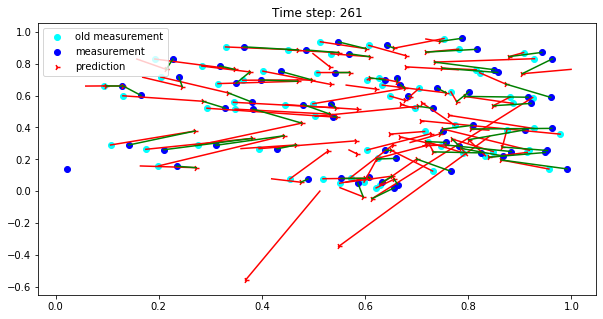

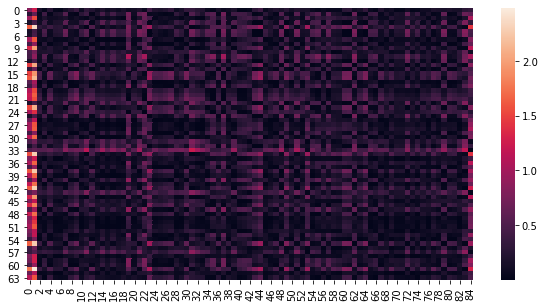

Time step: 262


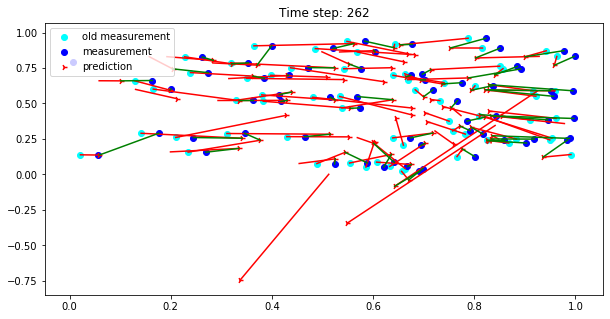

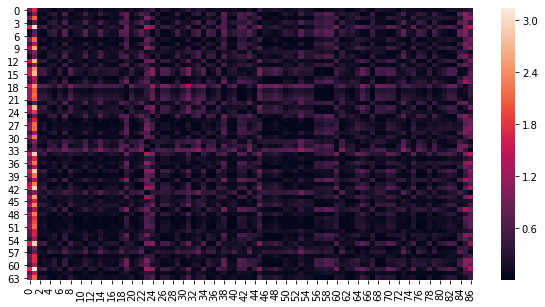

Time step: 263


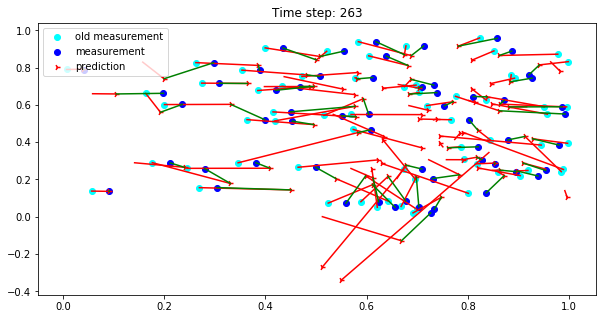

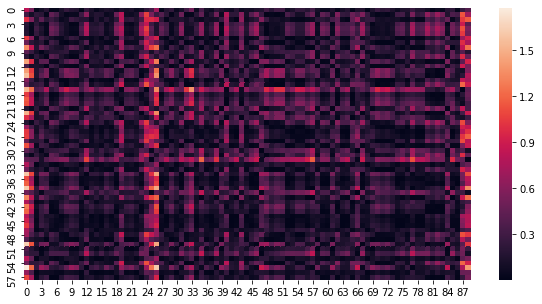

Time step: 264


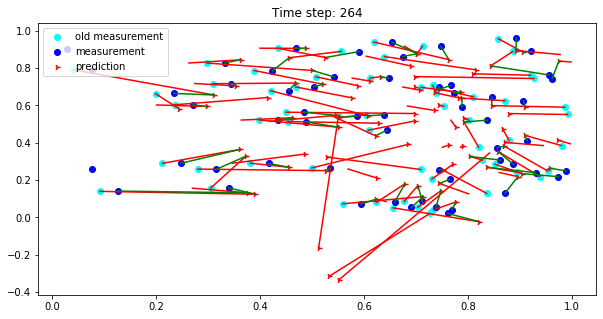

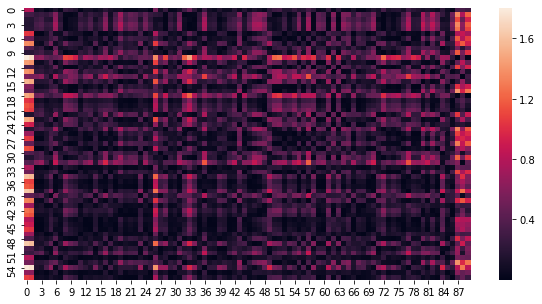

Time step: 265


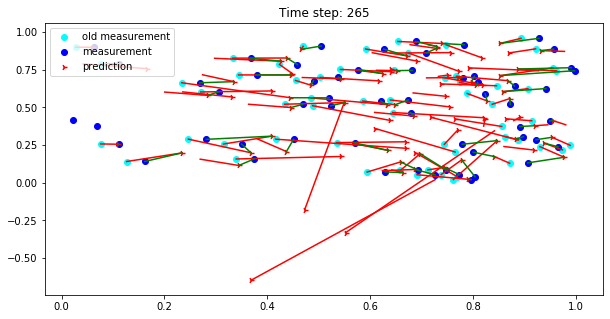

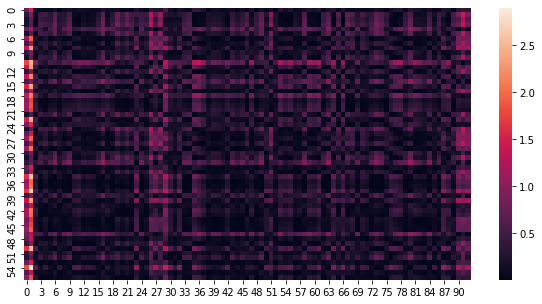

Time step: 266


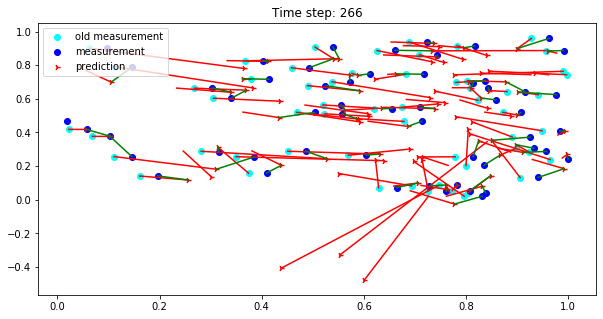

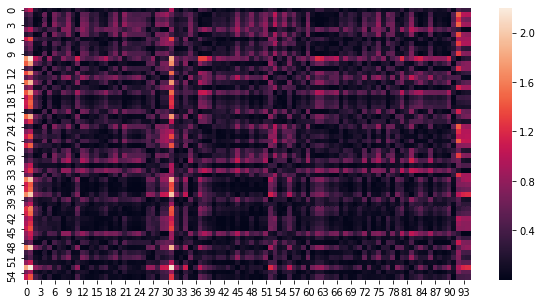

Time step: 267
dist 0.0399873046632051
dist 0.00015717834260331465
dist 0.01780906065646648
B
B
B
D
D
D


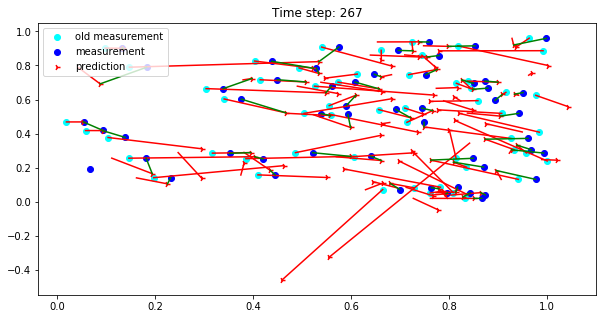

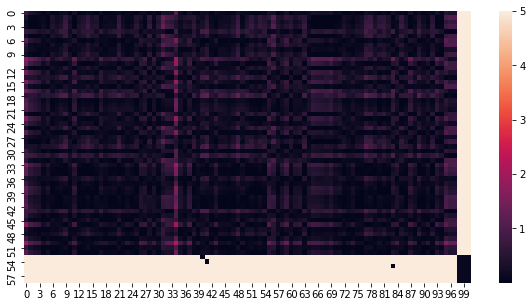

Time step: 268
dist 0.006794398664782708
dist 0.028031125017151215
B
B
D
D


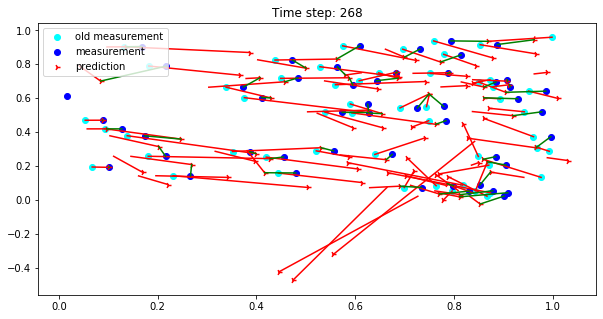

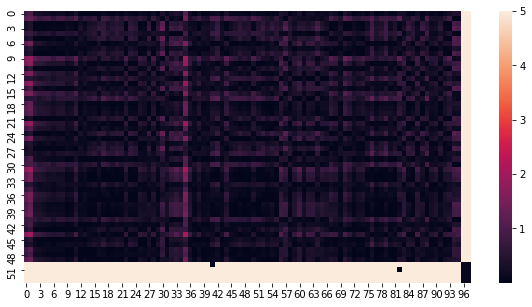

Time step: 269
dist 0.006432459470209428
dist 0.038539311680294785
B
B
D
D


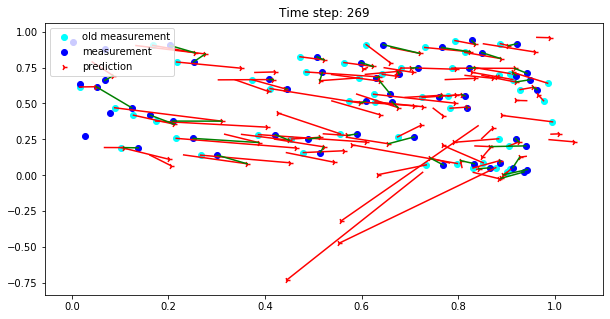

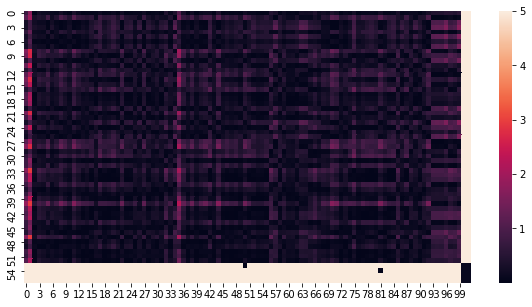

Time step: 270
dist 0.04211890558724085
dist 0.002030739633289036
dist 0.05019349605612056
B
B
B
D
D
D


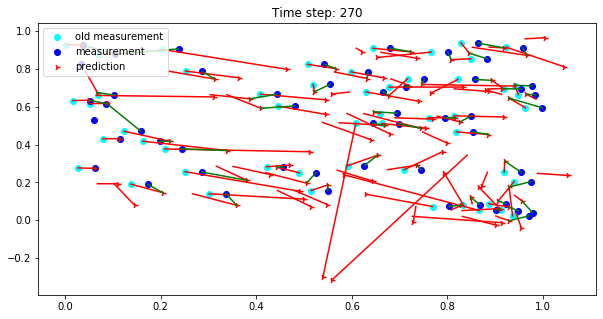

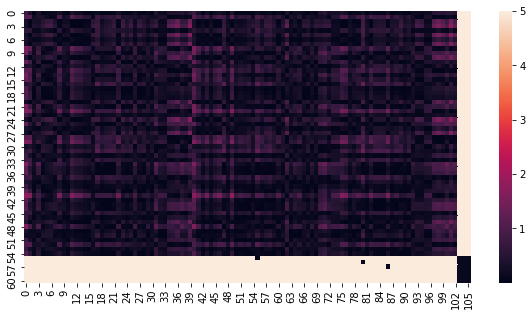

Time step: 271
dist 0.014636914191995531
dist 0.05665788491612056
B
B
D
D


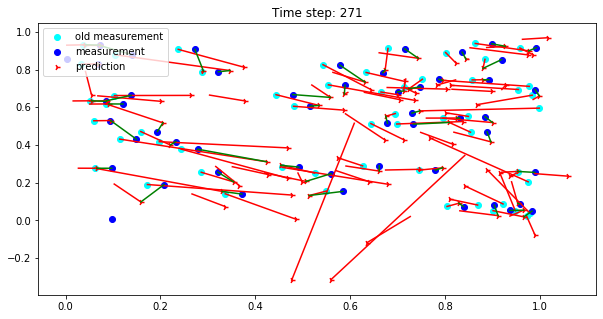

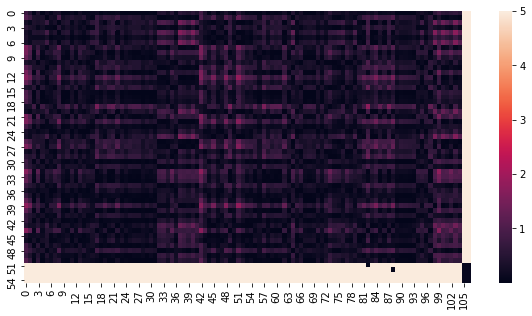

Time step: 272
dist 0.0057626875540219835
dist 0.026273655812847796
dist 0.00011445653191244354
dist 0.028240860498511378
B
B
B
B
D
D
D
D


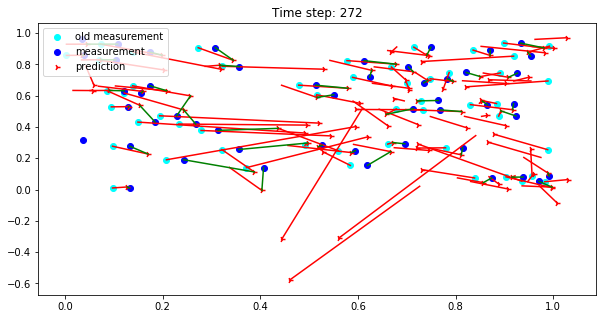

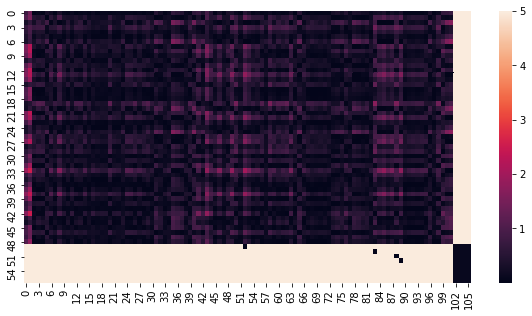

Time step: 273
dist 0.021552880988260137
dist 0.012651239297027939


KeyboardInterrupt: ignored

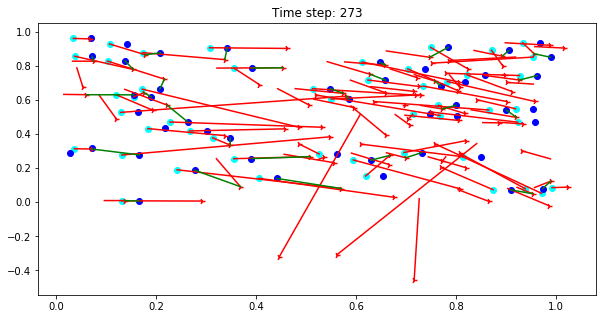

In [99]:
shutil.rmtree('visualizations/matching_visualization', ignore_errors=True)
os.makedirs('visualizations/matching_visualization')

number_tracks = dataset.track_data.shape[0]

# create the model manager
model_manager = model.ModelManager(number_tracks, batch_size, rnn_model)

TIME_STEPS = num_time_steps
MAX_NUM_TRAJECTORIES = number_tracks
SIZE_X = 1.
SIZE_Y = 1.
# the region, where the track is considered to appear / disappear
X_DETECTION_TOLERANCE = SIZE_X / 10.
X_DISAPPEAR_TOLERANCE = 0

# the distance of the pseudo measurements and tracks to the actual belt
X_THRESHOLD = 5./2000.

# generate increasing ids
def id_generator():
    n = 0
    while True:
        yield n
        n += 1

id_seed = id_generator()

all_ids = []

# mm: model_manager
# id => mm_id
id_2_mm = {}

# mm_id => id
mm_2_id = {}

# id => list(observations)
track_history = defaultdict(list)

measurements = None

active_ids = set()

for time_step in range(num_time_steps):
    print('Time step: {}'.format(time_step))
    plt.title('Time step: {}'.format(time_step))
    predictions_mm_ids = [id_2_mm[i] for i in sorted(active_ids)]
    predictions_ids = [i for i in sorted(active_ids)]
    predictions = model_manager.predict()
    
    predictions_mask = np.zeros(predictions.shape[0], dtype=np.bool)
    predictions_mask[predictions_mm_ids] = True
    
    predictions = predictions[predictions_mask]

    # old measurement
    old_observations = np.array(model_manager.batch_measurements).reshape([model_manager.n_batches * model_manager.batch_size, model_manager.num_dims])[predictions_mask]

    if measurements is not None:
      plt.scatter(measurements[:, 0], measurements[:, 1], c='cyan', label='old measurement')

      for pred_i in range(predictions.shape[0]):
        start = old_observations[pred_i]
        end = predictions[pred_i]
        line = np.stack((start, end), axis=0)
        plt.plot(line[:, 0], line[:, 1], c='red')
    
    
    measurements = dataset.get_measurement_at_timestep(time_step)
    mask = np.any(measurements != [nan_value, nan_value], axis=-1)
    measurements = measurements[mask]
    
    plt.scatter(measurements[:, 0], measurements[:, 1], c='blue', label='measurement')
    plt.scatter(predictions[:, 0], predictions[:, 1], marker='4', c='red', label='prediction')
    # plt.show()
    
    if measurements.shape[0] == 0:
        continue
    
    # 1. particle enters perception: add an artificial track for every measurement at the first 1/10 of the belt
    #   -> for every of these tracks: create an artificial measurement
    mask_new_tracks = measurements[:, 0] < X_DETECTION_TOLERANCE
    count_new_tracks = np.sum(mask_new_tracks)
    
    artificial_predictions = np.stack((np.ones(count_new_tracks)*-X_THRESHOLD,
                                        measurements[mask_new_tracks][:, 1]), axis=-1)
    
    # 2. particle leaves perception: the predicted particles which are in the terminal region of the belt
    mask_end_measurements = predictions[:, 0] > SIZE_X - X_DISAPPEAR_TOLERANCE
    count_end_measurements = np.sum(mask_end_measurements)
    artificial_measurements = np.stack((np.ones(count_end_measurements)*(SIZE_X + X_THRESHOLD),
                                        predictions[mask_end_measurements][:, 1]), axis=-1)
    
    # Distance matrix
    all_measurements = np.concatenate((measurements, artificial_measurements))
    all_predictions = np.concatenate((predictions, artificial_predictions))
    distances = distance_matrix(all_measurements, all_predictions) ** 2

    # ToDo: set the special distances for the artificial components
    #   (the artificial measurements and predictions are close together)
    # 1. artificial measurements (where tracks end) are only connected to the
    #    provocing track and one 
    large_value = 5
    pseudo_distance = 0.1

    distances[measurements.shape[0]:, :] = large_value
    for measurement_idx, prediction_idx in enumerate(np.where(mask_end_measurements)[0]):
      # the distance between the pseudo measurement and the track
      distance_value = np.abs(predictions[prediction_idx, 0] - (SIZE_X + X_THRESHOLD))
      print('dist', distance_value)
      distances[measurements.shape[0]+measurement_idx, prediction_idx] = distance_value

      # What if the track doesn't match the pseudo measurement? (for example: because there is a better measurement for the track)
      #  -> then we want the pseudo measurement to match a pseudo track
      #      -> therefore, we create a new pseudo track with the following distances:
      #             - to real measurements: infinty
      #             - to pseudo measurements: 0.1 (pseudo_distance)
      #                (Attention. 0.1 is an arbitrary number which should actually be a sigma value!!!)
      new_column = np.ones(distances.shape[0])[:, np.newaxis] * large_value
      new_column[measurements.shape[0]:] = pseudo_distance
      distances = np.hstack((distances, new_column))

      # Now that we created a new column, we must create a new placeholder
      #   row. For the column to match.
      new_row = np.ones(distances.shape[1])[:, np.newaxis].T * large_value
      new_row[:, all_predictions.shape[0]:] = pseudo_distance
      distances = np.vstack((distances, new_row))



    #with np.printoptions(precision=3, suppress=True):
    #  print("Distances")
    #  print(distances)
        
    measurement_assignment_ids, prediction_assignment_ids  = linear_sum_assignment(distances)
    
    # Different cases
    #    A | B
    #    -----
    #    C | D
    for measurement_id, prediction_id in zip(measurement_assignment_ids.tolist(), 
                                             prediction_assignment_ids.tolist()):
        # A) measurement <-> existing prediction   => add measurement as new observation of the track
        if measurement_id < measurements.shape[0] and prediction_id < predictions.shape[0]:
            id_ = predictions_ids[prediction_id]
            mm_track_id = id_2_mm[id_]
            model_manager.set_track_measurement(mm_track_id, all_measurements[measurement_id])
            # store observation
            track_history[id_].append([time_step, all_measurements[measurement_id]])

            line = np.stack((all_measurements[measurement_id], all_predictions[prediction_id]), axis=0)
            plt.plot(line[:, 0], line[:, 1], c='green')
            
            
        # B) artificial measurement <-> prediction  => delete track
        elif measurement_id >= measurements.shape[0] and prediction_id < predictions.shape[0]:
            print("B")
            id_ = predictions_ids[prediction_id]
            active_ids.remove(id_)
            mm_track_id = id_2_mm[id_]
            # ToDo: fix this
            # model_manager.free(mm_track_id)
            # del mm_2_id[mm_track_id]
            # del id_2_mm[id_]
            
        # C) measurement <-> artificial prediction  => create track     
        elif measurement_id < measurements.shape[0] and prediction_id >= predictions.shape[0]:
            # new global id
            id_ = next(id_seed)
            active_ids.add(id_)
            # new model manger id
            mm_track_id = model_manager.allocate_track()
            id_2_mm[id_] = mm_track_id
            mm_2_id[mm_track_id] = id_

            model_manager.set_track_measurement(mm_track_id, all_measurements[measurement_id])
            # store observation
            track_history[id_].append([time_step, all_measurements[measurement_id]])

        # D) artificial measurement <-> artificial prediction   => do nothing
        elif measurement_id >= measurements.shape[0] and prediction_id >= predictions.shape[0]:
            print("D")  

    plt.legend(loc="upper left")
    plt.savefig('visualizations/matching_visualization/{:05d}'.format(time_step))
    plt.show()
    plt.clf()

    df_cm = pd.DataFrame(distances, range(distances.shape[0]),
                  range(distances.shape[1]))
    # sn.set(font_scale=1.4)#for label size
    sn.heatmap(df_cm, annot=False)
    plt.show()
    plt.clf()
    
    

In [103]:
from moviepy.editor import *

Imageio: 'ffmpeg-linux64-v3.3.1' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg-linux64-v3.3.1 (43.8 MB)
Downloading: 8192/45929032 bytes (0.0%)2048000/45929032 bytes (4.5%)5767168/45929032 bytes (12.6%)9510912/45929032 bytes (20.7%)13393920/45929032 bytes (29.2%)17039360/45929032 bytes (37.1%)20766720/45929032 bytes (45.2%)24502272/45929032 bytes (53.3%)28327936/45929032 bytes (61.7%)32112640/45929032 bytes (69.9%)35872768/45929032 bytes (78.1%)39493632/45929032 bytes (86.0%)43294720/45929032 bytes (94.3%)

In [0]:
from PIL import Image
import moviepy

In [110]:
clip = ImageSequenceClip('visualizations/matching_visualization', fps=4)
clip.write_videofile("visualizations/matching_visualization_vid.mp4", fps=4)

ValueError: ignored

In [0]:
import os
from os import listdir
from PIL import Image

dir_path = "visualizations/matching_visualization/"


for filename in listdir(dir_path):
    if filename.endswith('.png'):
        try:
            img = Image.open(dir_path+filename) # open the image file
            img.verify() # verify that it is, in fact an image
        except (IOError, SyntaxError) as e:
            print('Bad file:', filename)
            #os.remove(base_dir+"\\"+filename) (Maybe)

In [112]:
!ffmpeg -r 1 -i "visualizations/matching_visualization/%05d.png" -vcodec mpeg4 -y movie.mp4

ffmpeg version 3.4.6-0ubuntu0.18.04.1 Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.3.0-16ubuntu3)
  configuration: --prefix=/usr --extra-version=0ubuntu0.18.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --ena